# Esfandiar Kiani - DL - Project [EuroSat100]

## Imports

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support
import seaborn as sns
from tqdm.notebook import tqdm
import random
import kornia
import rasterio
import torchvision.transforms as transforms
from IPython.display import display, clear_output
import torch.nn.functional as F

## Hyperparameters

In [2]:
hyperparameters = {
    "learning_rate": 0.001,
    "batch_size": 350,
    "num_epochs": 70,
    "input_size": (64, 64),
    "num_classes": 10,
    "lstm_hidden_size": 98,
    "lstm_num_layers": 1,
    "patience": 1000
}

model_parameters = {
    "conv1_kernels": 8,
    "conv1_kernel_size": 3,
    "conv1_stride": 1,
    "conv1_padding": 1,
    "pool1_size": 2,
    "pool1_stride": 2,
    "conv2_kernels": 16,
    "conv2_kernel_size": 3,
    "conv2_stride": 1,
    "conv2_padding": 1,
    "pool2_size": 2,
    "pool2_stride": 2,
    "dense1_neurons": 64,
    "lstm_sequence_length": 32,
    "lstm_input_size": 128
}

num_workers = 8
seed = 13
dataset_path = "./EuroSAT"
best_model_path = "./saved_model_eurosat/best_model_eurosat.pkl"
best_improved_model_path = "./saved_model_eurosat/best_improved_model_eurosat.pkl"

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [4]:
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

## Dataset

In [12]:
class EuroSATDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.classes = ['AnnualCrop', 'Forest', 'HerbaceousVegetation', 'Highway', 'Industrial', 
                        'Pasture', 'PermanentCrop', 'Residential', 'River', 'SeaLake']
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}
        self.images = []
        self.labels = []
        
        for cls in self.classes:
            class_dir = os.path.join(root_dir, cls)
            for img_name in os.listdir(class_dir):
                if img_name.endswith('.jpg'):
                    self.images.append(os.path.join(class_dir, img_name))
                    self.labels.append(self.class_to_idx[cls])
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        img_path = self.images[idx]
        label = self.labels[idx]
        image = Image.open(img_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        return image, label

## Preprocessing data

In [35]:
data_transforms = transforms.Compose([
    transforms.Resize(hyperparameters["input_size"]), 
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    transforms.Lambda(lambda x: kornia.filters.laplacian(x.unsqueeze(0), kernel_size=3).squeeze(0) + x)
])

In [36]:
dataset = EuroSATDataset(root_dir=dataset_path, transform=data_transforms)

## Train/Test Split

In [37]:
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

## Load data

In [38]:
train_loader = DataLoader(train_dataset, batch_size=hyperparameters["batch_size"], shuffle=True, num_workers=0, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=hyperparameters["batch_size"],  shuffle=False, num_workers=0, pin_memory=True)

In [39]:
print(f"Total images: {len(dataset)}")
print(f"Train images: {len(train_dataset)}")
print(f"Test images: {len(test_dataset)}")
print(f"Classes: {dataset.classes}")

Total images: 27000
Train images: 21600
Test images: 5400
Classes: ['AnnualCrop', 'Forest', 'HerbaceousVegetation', 'Highway', 'Industrial', 'Pasture', 'PermanentCrop', 'Residential', 'River', 'SeaLake']


### Test Show

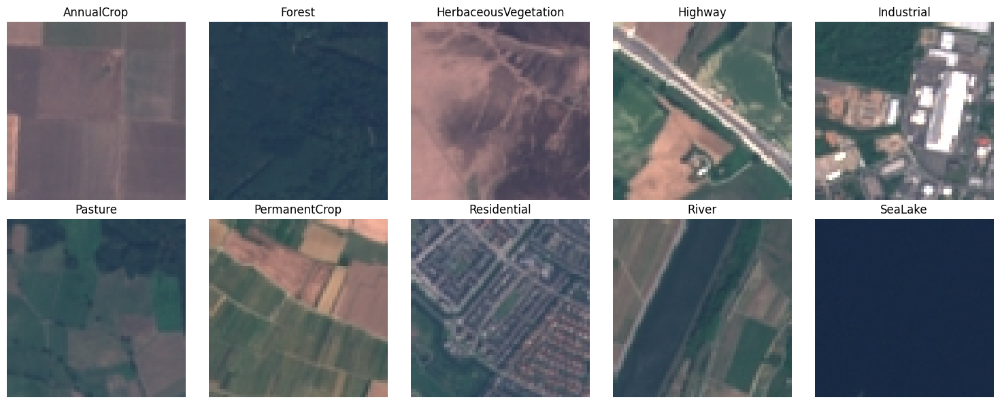

In [40]:
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i, cls in enumerate(dataset.classes):
    cls_imgs = [img for img, lbl in zip(dataset.images, dataset.labels) if dataset.class_to_idx[cls] == lbl]
    img = Image.open(cls_imgs[0]).convert('RGB')
    axes[i // 5, i % 5].imshow(img)
    axes[i // 5, i % 5].set_title(cls)
    axes[i // 5, i % 5].axis('off')
plt.tight_layout()
plt.show()

## Model

In [13]:
class LightweightCNNLSTM(nn.Module):
    def __init__(self, num_classes, model_params):
        super(LightweightCNNLSTM, self).__init__()
        self.model_params = model_params
        self.cnn = nn.Sequential(
            nn.Conv2d(3, model_params["conv1_kernels"], kernel_size=model_params["conv1_kernel_size"], 
                      stride=model_params["conv1_stride"], padding=model_params["conv1_padding"]),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=model_params["pool1_size"], stride=model_params["pool1_stride"]),
            nn.Conv2d(model_params["conv1_kernels"], model_params["conv2_kernels"], 
                      kernel_size=model_params["conv2_kernel_size"], stride=model_params["conv2_stride"], 
                      padding=model_params["conv2_padding"]),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=model_params["pool2_size"], stride=model_params["pool2_stride"])
        )
        self.flatten = nn.Flatten()
        self.lstm = nn.LSTM(input_size=model_params["lstm_input_size"], 
                            hidden_size=hyperparameters["lstm_hidden_size"], 
                            num_layers=hyperparameters["lstm_num_layers"], 
                            batch_first=True)
        self.fc1 = nn.Linear(hyperparameters["lstm_hidden_size"], model_params["dense1_neurons"])
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(model_params["dense1_neurons"], num_classes)
        self.softmax = nn.Softmax(dim=1)
    
    def forward(self, x):
        x = self.cnn(x)
        x = self.flatten(x)
        x = x.view(x.size(0), self.model_params["lstm_sequence_length"], -1)
        x, _ = self.lstm(x)
        x = x[:, -1, :]
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.softmax(x)
        return x

## Train

In [42]:
model = LightweightCNNLSTM(num_classes=hyperparameters["num_classes"], model_params=model_parameters).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=hyperparameters["learning_rate"])

In [43]:
best_val_acc = 0.0
patience = hyperparameters["patience"]
counter = 0

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

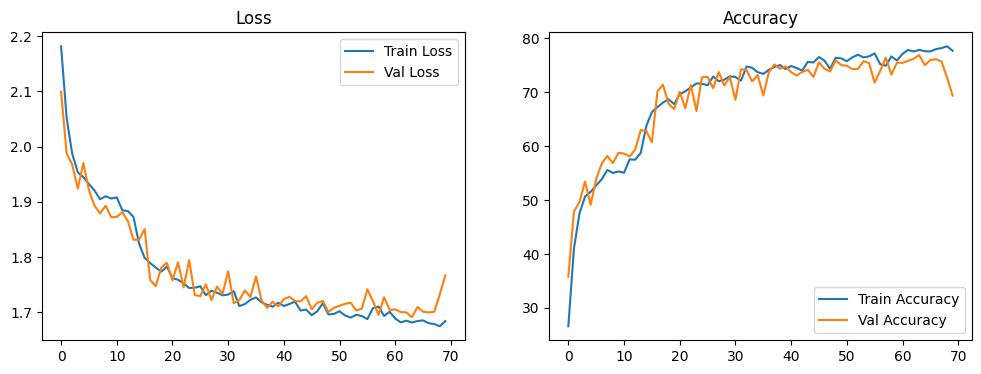

Epoch 70/70, Train Loss: 1.6841, Train Acc: 77.71%, Val Loss: 1.7669, Val Acc: 69.41%


In [44]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

for epoch in tqdm(range(hyperparameters["num_epochs"]), desc="Epochs"):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)
    
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    val_loss = val_loss / len(test_loader)
    val_acc = 100 * correct / total
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)
    
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), best_model_path)
        counter = 0
    else:
        counter += 1
    
    clear_output(wait=True)
    ax1.clear()
    ax2.clear()
    ax1.plot(train_losses, label='Train Loss')
    ax1.plot(val_losses, label='Val Loss')
    ax1.set_title('Loss')
    ax1.legend()
    ax2.plot(train_accuracies, label='Train Accuracy')
    ax2.plot(val_accuracies, label='Val Accuracy')
    ax2.set_title('Accuracy')
    ax2.legend()
    display(fig)
    
    print(f"Epoch {epoch+1}/{hyperparameters['num_epochs']}, "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")
    
    if counter >= patience:
        print("Early stopping triggered (though disabled with large patience).")
        break

plt.close()

## Evaluation

In [45]:
model.load_state_dict(torch.load(best_model_path))
model.eval()
all_preds = []
all_labels = []

C:\Users\Stephen\AppData\Local\Temp\ipykernel_34656\807321686.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_path))


In [46]:
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

In [47]:
accuracy = 100 * (np.array(all_preds) == np.array(all_labels)).sum() / len(all_labels)
precision, recall, f1, _ = precision_recall_fscore_support(all_labels, all_preds, average='weighted')

C:\Program Files\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Result

In [48]:
print(f"Final Test Accuracy: {accuracy:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")

Final Test Accuracy: 76.91%
Precision: 0.7102
Recall: 0.7691
F1-Score: 0.7342


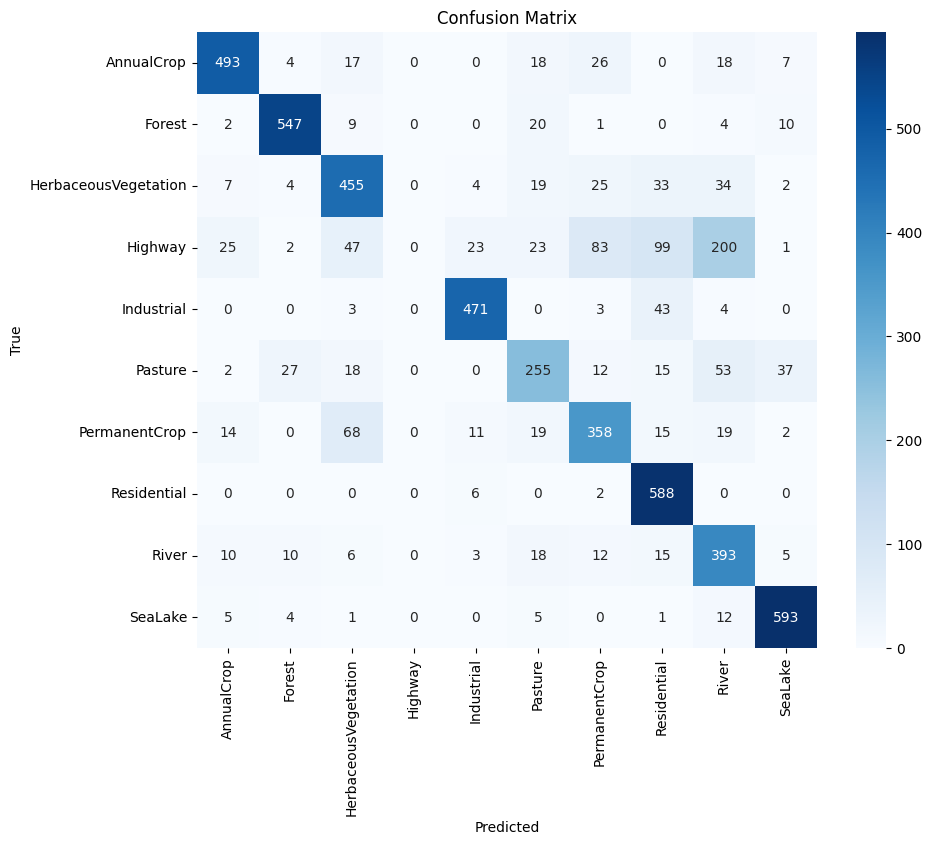

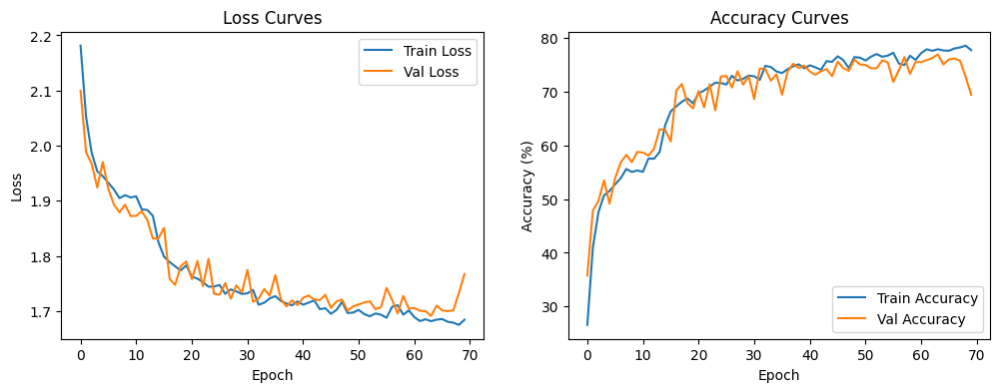

In [49]:
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=dataset.classes, yticklabels=dataset.classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.title('Loss Curves')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(val_accuracies, label='Val Accuracy')
plt.title('Accuracy Curves')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.show()

## Live Run

In [1]:
import os, random, numpy as np, torch, kornia, cv2
from PIL import Image
from torchvision import datasets, transforms
from torch import nn
from torch.utils.data import Dataset
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns

SEED=13; random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
os.environ["OMP_NUM_THREADS"]="1"; os.environ["MKL_NUM_THREADS"]="1"; cv2.setNumThreads(0); torch.set_num_threads(1)
device=torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATA_ROOT= "../Dataset/EuroSAT"
SAVE_DIR=  "./saved_model_eurosat"
WEIGHT_NAME="best_model_eurosat.pkl"
IMAGE_SIZE=(64,64); N_SHOW=6

tf=transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5],[0.5,0.5,0.5]),
    transforms.Lambda(lambda x: kornia.filters.laplacian(x.unsqueeze(0),kernel_size=3).squeeze(0)+x)
])

class LightweightCNNLSTM(nn.Module):
    def __init__(self,num_classes,mp):
        super().__init__()
        self.mp=mp
        self.cnn=nn.Sequential(
            nn.Conv2d(3, mp["conv1_kernels"], kernel_size=mp["conv1_kernel_size"], stride=mp["conv1_stride"], padding=mp["conv1_padding"]),
            nn.ReLU(), nn.MaxPool2d(kernel_size=mp["pool1_size"], stride=mp["pool1_stride"]),
            nn.Conv2d(mp["conv1_kernels"], mp["conv2_kernels"], kernel_size=mp["conv2_kernel_size"], stride=mp["conv2_stride"], padding=mp["conv2_padding"]),
            nn.ReLU(), nn.MaxPool2d(kernel_size=mp["pool2_size"], stride=mp["pool2_stride"])
        )
        self.flatten=nn.Flatten()
        self.lstm=nn.LSTM(input_size=mp["lstm_input_size"], hidden_size=98, num_layers=1, batch_first=True)
        self.fc1=nn.Linear(98, mp["dense1_neurons"]); self.relu=nn.ReLU(); self.fc2=nn.Linear(mp["dense1_neurons"], num_classes); self.sm=nn.Softmax(dim=1)
    def forward(self,x):
        x=self.cnn(x); x=self.flatten(x); x=x.view(x.size(0), self.mp["lstm_sequence_length"], -1)
        x,_=self.lstm(x); x=x[:,-1,:]; x=self.fc1(x); x=self.relu(x); x=self.fc2(x); return self.sm(x)

mp={"conv1_kernels":8,"conv1_kernel_size":3,"conv1_stride":1,"conv1_padding":1,"pool1_size":2,"pool1_stride":2,
    "conv2_kernels":16,"conv2_kernel_size":3,"conv2_stride":1,"conv2_padding":1,"pool2_size":2,"pool2_stride":2,
    "dense1_neurons":64,"lstm_sequence_length":32,"lstm_input_size":128}

ds=datasets.ImageFolder(DATA_ROOT); classes=ds.classes
idx=list(range(len(ds))); random.shuffle(idx); idx=idx[:N_SHOW]
items=[(Image.open(ds.samples[i][0]).convert("RGB"), ds.samples[i][1]) for i in idx]

xb=torch.stack([tf(img) for img,_ in items]).to(device); yb=torch.tensor([y for _,y in items], device=device)

model=LightweightCNNLSTM(num_classes=len(classes), mp=mp).to(device)
state=torch.load(os.path.join(SAVE_DIR,WEIGHT_NAME), map_location=device); model.load_state_dict(state); model.eval()

LightweightCNNLSTM(
  (cnn): Sequential(
    (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (lstm): LSTM(128, 98, batch_first=True)
  (fc1): Linear(in_features=98, out_features=64, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=64, out_features=10, bias=True)
  (sm): Softmax(dim=1)
)

Subset Accuracy: 100.00%
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000


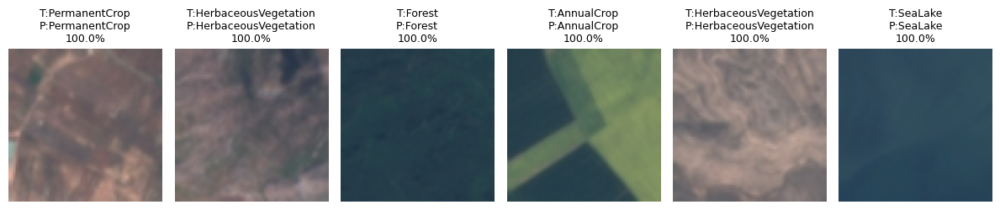

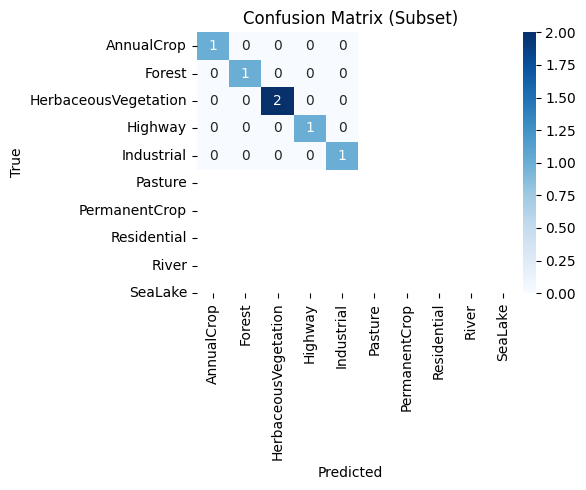

In [9]:
with torch.no_grad():
    probs=model(xb); pred=probs.argmax(1)
acc=100.0*(pred==yb).float().mean().item()
prec=precision_score(yb.cpu(),pred.cpu(),average='macro',zero_division=0)
rec=recall_score(yb.cpu(),pred.cpu(),average='macro',zero_division=0)
f1=f1_score(yb.cpu(),pred.cpu(),average='macro',zero_division=0)
cm=confusion_matrix(yb.cpu(),pred.cpu())

print(f"Subset Accuracy: {acc:.2f}%"); print(f"Precision: {prec:.4f}"); print(f"Recall: {rec:.4f}"); print(f"F1-Score: {f1:.4f}")

plt.figure(figsize=(12,3))
for i,(img,y) in enumerate(items):
    x=xb[i].detach().cpu(); x=(x*0.5)+0.5; x=x.clamp(0,1).permute(1,2,0).numpy()
    p=int(pred[i].item()); conf=float(probs[i,p].item())
    ax=plt.subplot(1,N_SHOW,i+1); ax.imshow(x); ax.set_title(f"T:{classes[y]}\nP:{classes[p]}\n{conf*100:.1f}%",fontsize=9); ax.axis("off")
plt.tight_layout(); plt.show()

plt.figure(figsize=(6,5))
sns.heatmap(cm,annot=True,fmt="d",cmap="Blues",xticklabels=classes,yticklabels=classes)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Confusion Matrix (Subset)"); plt.tight_layout(); plt.show()


In [3]:
import torch
from torchinfo import summary


summary(model, input_size=(1, 3, 64, 64))

Layer (type:depth-idx)                   Output Shape              Param #
LightweightCNNLSTM                       [1, 10]                   --
├─Sequential: 1-1                        [1, 16, 16, 16]           --
│    └─Conv2d: 2-1                       [1, 8, 64, 64]            224
│    └─ReLU: 2-2                         [1, 8, 64, 64]            --
│    └─MaxPool2d: 2-3                    [1, 8, 32, 32]            --
│    └─Conv2d: 2-4                       [1, 16, 32, 32]           1,168
│    └─ReLU: 2-5                         [1, 16, 32, 32]           --
│    └─MaxPool2d: 2-6                    [1, 16, 16, 16]           --
├─Flatten: 1-2                           [1, 4096]                 --
├─LSTM: 1-3                              [1, 32, 98]               89,376
├─Linear: 1-4                            [1, 64]                   6,336
├─ReLU: 1-5                              [1, 64]                   --
├─Linear: 1-6                            [1, 10]                   650
├─S

## Enhancement

### Type-1 (Same Model)

In [7]:
SEED = 13
DATA_ROOT = r"C:\Users\Stephen\Code\University"
EUROSAT_DIR = DATA_ROOT + r"\EuroSAT"
SAVE_DIR = r"C:\Users\Stephen\Code\University\saved_model_eurosat"
BEST_MODEL_PATH = SAVE_DIR + r"\best_improved_model_eurosat_v2.pkl"
META_PATH = SAVE_DIR + r"\run_eurosat_meta.json"

BATCH_SIZE = 500
NUM_WORKERS = 8
IMAGE_SIZE = 64
EPOCHS = 70
BASE_LR = 1e-3

USE_ADV_AUG = True
AUG_INTENSITY = "medium"

SCHEDULER_TYPE = "cosine"
SCHEDULER_COSINE_TMAX = EPOCHS
SCHEDULER_PLATEAU_PATIENCE = 5
SCHEDULER_PLATEAU_FACTOR = 0.5
SCHEDULER_PLATEAU_MIN_LR = 1e-5

import os, json, random, math, time, numpy as np
from collections import Counter
import cv2
from PIL import Image
import torch
from torch import nn
import torch.backends.cudnn as cudnn
from torch.utils.data import DataLoader, random_split
from torchvision import transforms, datasets
from torchvision.transforms import functional as TF
from torch.optim.lr_scheduler import CosineAnnealingLR, ReduceLROnPlateau
import matplotlib.pyplot as plt
from IPython.display import clear_output

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
cudnn.deterministic = True; cudnn.benchmark = False
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
os.makedirs(SAVE_DIR, exist_ok=True)
print(device)


cuda


In [2]:
class LaplacianSharpenCLAHE:
    def __init__(self, alpha=0.3, clip_limit=2.0, tile_grid_size=(8,8)):
        self.alpha=float(alpha); self.clip_limit=float(clip_limit); self.tile_grid_size=tile_grid_size
    def __call__(self, img_pil: Image.Image) -> Image.Image:
        img = np.array(img_pil)
        lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        l,a,b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
        l_eq = clahe.apply(l)
        lab_eq = cv2.merge([l_eq,a,b])
        img_eq = cv2.cvtColor(lab_eq, cv2.COLOR_LAB2RGB)
        lap = cv2.Laplacian(img_eq, ddepth=cv2.CV_16S, ksize=3)
        lap = cv2.convertScaleAbs(lap)
        sharp = cv2.addWeighted(img_eq, 1.0, lap, self.alpha, 0)
        return Image.fromarray(sharp)

class GaussianNoise:
    def __init__(self, mean=0.0, std=0.01, p=0.3):
        self.mean=mean; self.std=std; self.p=p
    def __call__(self, x: torch.Tensor) -> torch.Tensor:
        if torch.rand(1).item() < self.p:
            x = x + torch.randn_like(x)*self.std + self.mean
            x = torch.clamp(x, 0.0, 1.0)
        return x

def _aug_block(image_size=64, intensity="medium"):
    if intensity=="light":
        return transforms.Compose([
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomVerticalFlip(p=0.2),
            transforms.RandomRotation(degrees=15),
            transforms.RandomResizedCrop(image_size, scale=(0.9,1.0), ratio=(0.9,1.1)),
            transforms.AutoAugment(transforms.AutoAugmentPolicy.IMAGENET),
        ])
    if intensity=="strong":
        return transforms.Compose([
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomVerticalFlip(p=0.3),
            transforms.RandomRotation(degrees=25),
            transforms.RandomPerspective(distortion_scale=0.3, p=0.2),
            transforms.RandomResizedCrop(image_size, scale=(0.85,1.0), ratio=(0.85,1.15)),
            transforms.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.2, hue=0.02),
            transforms.RandomAutocontrast(p=0.3),
            transforms.GaussianBlur(kernel_size=3, sigma=(0.1,1.2)),
        ])
    return transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.2),
        transforms.RandomRotation(degrees=20),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.2),
        transforms.RandomResizedCrop(image_size, scale=(0.9,1.0), ratio=(0.9,1.1)),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.15, hue=0.02),
        transforms.RandomAutocontrast(p=0.2),
    ])

def build_train_transform(image_size=64, intensity="medium", use_adv=True):
    pre = LaplacianSharpenCLAHE(alpha=0.3, clip_limit=2.0, tile_grid_size=(8,8))
    if use_adv:
        aug = _aug_block(image_size, intensity)
        core = [transforms.Resize((image_size,image_size)), pre, aug, transforms.ToTensor(), GaussianNoise(0.0,0.01,0.3)]
    else:
        core = [transforms.Resize((image_size,image_size)), pre, transforms.ToTensor()]
    return transforms.Compose(core)

def build_val_transform(image_size=64):
    pre = LaplacianSharpenCLAHE(alpha=0.3, clip_limit=2.0, tile_grid_size=(8,8))
    return transforms.Compose([transforms.Resize((image_size,image_size)), pre, transforms.ToTensor()])


In [3]:
import os, time, torch, psutil, numpy as np
from PIL import Image
from torchvision import transforms, datasets
from torch.utils.data import DataLoader, random_split
import cv2

os.environ["OMP_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
cv2.setNumThreads(0)
torch.set_num_threads(8)

SEED = 13
# BATCH_SIZE = 450
IMAGE_SIZE = 64
DATA_ROOT = r"C:\Users\Stephen\Code\University"
EUROSAT_DIR = DATA_ROOT + r"\EuroSAT"

def _mem():
    vm = psutil.virtual_memory()
    gtot = torch.cuda.get_device_properties(0).total_memory if torch.cuda.is_available() else 0
    gall = torch.cuda.memory_allocated(0) if torch.cuda.is_available() else 0
    return {"ram_used": vm.used, "ram_free": vm.available, "gpu_total": gtot, "gpu_alloc": gall}

class LaplacianSharpenCLAHE:
    def __init__(self, alpha=0.3, clip_limit=2.0, tile_grid_size=(8,8)):
        self.alpha=float(alpha); self.clip_limit=float(clip_limit); self.tile_grid_size=tile_grid_size
    def __call__(self, img_pil: Image.Image) -> Image.Image:
        img = np.array(img_pil)
        lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        l,a,b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
        l_eq = clahe.apply(l)
        lab_eq = cv2.merge([l_eq,a,b])
        img_eq = cv2.cvtColor(lab_eq, cv2.COLOR_LAB2RGB)
        lap = cv2.Laplacian(img_eq, ddepth=cv2.CV_16S, ksize=3)
        lap = cv2.convertScaleAbs(lap)
        sharp = cv2.addWeighted(img_eq, 1.0, lap, self.alpha, 0)
        return Image.fromarray(sharp)

train_tf = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    LaplacianSharpenCLAHE(alpha=0.3, clip_limit=2.0, tile_grid_size=(8,8)),
    transforms.ToTensor()
])
val_tf = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    LaplacianSharpenCLAHE(alpha=0.3, clip_limit=2.0, tile_grid_size=(8,8)),
    transforms.ToTensor()
])

full_dataset = datasets.ImageFolder(EUROSAT_DIR)
train_len = int(0.8 * len(full_dataset))
val_len = len(full_dataset) - train_len
g = torch.Generator().manual_seed(SEED)
train_subset, val_subset = random_split(full_dataset, [train_len, val_len], generator=g)
train_subset.dataset.transform = train_tf
val_subset.dataset.transform = val_tf

print("DBG:dataset ready", len(train_subset), len(val_subset), "classes", full_dataset.classes)

def build_safe_loader(subset, bs, name):
    print(f"DBG:rebuild {name} with nw=0 pin=False", flush=True)
    return DataLoader(subset, batch_size=bs, shuffle=(name.startswith("train")),
                      num_workers=0, pin_memory=False, drop_last=True)

def fetch_one(ld, name, timeout=30.0):
    print(f"DBG:test {name} start", flush=True)
    t0 = time.time()
    it = iter(ld)
    while True:
        if time.time()-t0 > timeout:
            print(f"ERR:{name} timeout>{timeout}s", flush=True); return False
        try:
            xb, yb = next(it)
            print(f"DBG:{name} ok batch={tuple(xb.shape)} labels={tuple(yb.shape)} mem={_mem()}", flush=True)
            return True
        except StopIteration:
            print(f"ERR:{name} empty", flush=True); return False
        except Exception as e:
            print(f"ERR:{name} next()->{repr(e)}", flush=True); return False

train_loader = build_safe_loader(train_subset, BATCH_SIZE, "train_loader")
val_loader   = build_safe_loader(val_subset,   BATCH_SIZE, "val_loader")

ok_t = fetch_one(train_loader, "train_loader")
ok_v = fetch_one(val_loader,   "val_loader")
print("DBG:ready", {"train_ok": ok_t, "val_ok": ok_v}, flush=True)


DBG:dataset ready 21600 5400 classes ['AnnualCrop', 'Forest', 'HerbaceousVegetation', 'Highway', 'Industrial', 'Pasture', 'PermanentCrop', 'Residential', 'River', 'SeaLake']
DBG:rebuild train_loader with nw=0 pin=False
DBG:rebuild val_loader with nw=0 pin=False
DBG:test train_loader start
DBG:train_loader ok batch=(750, 3, 64, 64) labels=(750,) mem={'ram_used': 18368184320, 'ram_free': 15614603264, 'gpu_total': 6441926656, 'gpu_alloc': 0}
DBG:test val_loader start
DBG:val_loader ok batch=(750, 3, 64, 64) labels=(750,) mem={'ram_used': 18373287936, 'ram_free': 15609499648, 'gpu_total': 6441926656, 'gpu_alloc': 0}
DBG:ready {'train_ok': True, 'val_ok': True}


In [4]:
class CNNLSTM(nn.Module):
    def __init__(self, num_classes: int, hidden_size: int = 64):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3,8,kernel_size=3,stride=1,padding=0),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            nn.Conv2d(8,16,kernel_size=3,stride=1,padding=0),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
        )
        self.flatten = nn.Flatten()
        self.T = 32
        self.F = 3136 // self.T
        self.lstm = nn.LSTM(input_size=self.F, hidden_size=64, num_layers=1, batch_first=True, bidirectional=False)
        self.fc1 = nn.Linear(64,64)
        self.act = nn.ReLU(inplace=True)
        self.fc2 = nn.Linear(64,num_classes)
    def forward(self,x):
        x = self.features(x)
        x = self.flatten(x)
        x = x.view(x.size(0), self.T, self.F)
        out,_ = self.lstm(x)
        h = out[:,-1,:]
        z = self.act(self.fc1(h))
        logits = self.fc2(z)
        return logits

model = CNNLSTM(num_classes=10, hidden_size=64).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=BASE_LR)

def build_scheduler(optimizer, scheduler_type=SCHEDULER_TYPE):
    if scheduler_type is None:
        return None
    t = scheduler_type.lower()
    if t=="cosine":
        return CosineAnnealingLR(optimizer, T_max=SCHEDULER_COSINE_TMAX, eta_min=1e-6)
    if t=="plateau":
        return ReduceLROnPlateau(optimizer, mode="min", factor=SCHEDULER_PLATEAU_FACTOR, patience=SCHEDULER_PLATEAU_PATIENCE, min_lr=SCHEDULER_PLATEAU_MIN_LR, verbose=True)
    raise ValueError("unknown scheduler")

scheduler = build_scheduler(optimizer, SCHEDULER_TYPE)
print(sum(p.numel() for p in model.parameters()))


48186


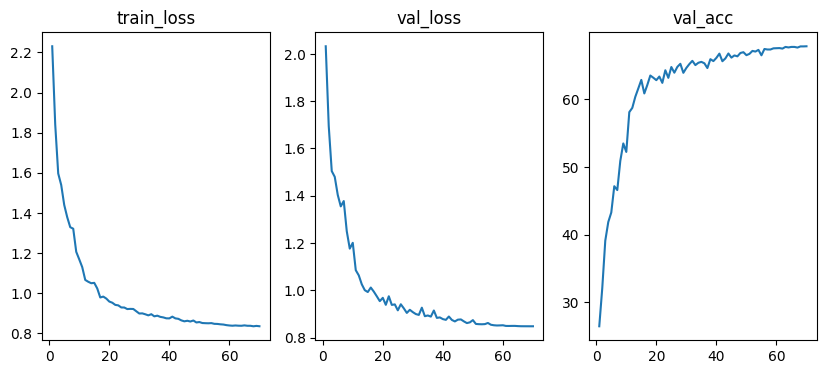

epoch=70/70  train_loss=0.8357  val_loss=0.8476  val_acc=67.85%  lr=0.000001
C:\Users\Stephen\Code\University\saved_model_eurosat\best_improved_model_eurosat_v2.pkl 67.84761904761905


In [5]:
best_acc = -1.0
history = {"epoch": [], "train_loss": [], "val_loss": [], "val_acc": [], "lr": []}

for epoch in range(1, EPOCHS+1):
    model.train()
    train_loss_sum = 0.0
    n_train = 0
    for xb,yb in train_loader:
        xb,yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        optimizer.zero_grad(set_to_none=True)
        out = model(xb)
        loss = criterion(out,yb)
        loss.backward()
        optimizer.step()
        train_loss_sum += loss.item()*xb.size(0)
        n_train += xb.size(0)

    model.eval()
    val_loss_sum = 0.0
    correct = 0
    n_val = 0
    with torch.no_grad():
        for xb,yb in val_loader:
            xb,yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
            out = model(xb)
            loss = criterion(out,yb) 
            val_loss_sum += loss.item()*xb.size(0)
            pred = out.argmax(dim=1)
            correct += (pred==yb).sum().item()
            n_val += xb.size(0)

    train_loss = train_loss_sum / max(1,n_train)
    val_loss = val_loss_sum / max(1,n_val)
    val_acc = 100.0 * correct / max(1,n_val)

    if scheduler is not None:
        if (SCHEDULER_TYPE or "").lower()=="plateau":
            scheduler.step(val_loss)
        else:
            scheduler.step()

    cur_lr = optimizer.param_groups[0]['lr']
    history["epoch"].append(epoch)
    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)
    history["val_acc"].append(val_acc)
    history["lr"].append(cur_lr)

    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(model.state_dict(), BEST_MODEL_PATH)

    clear_output(wait=True)
    plt.figure(figsize=(10,4))
    plt.subplot(1,3,1); plt.plot(history["epoch"], history["train_loss"]); plt.title("train_loss")
    plt.subplot(1,3,2); plt.plot(history["epoch"], history["val_loss"]); plt.title("val_loss")
    plt.subplot(1,3,3); plt.plot(history["epoch"], history["val_acc"]); plt.title("val_acc")
    plt.show()
    print(f"epoch={epoch}/{EPOCHS}  train_loss={train_loss:.4f}  val_loss={val_loss:.4f}  val_acc={val_acc:.2f}%  lr={cur_lr:.6f}")

print(BEST_MODEL_PATH, best_acc)

In [8]:
import json, torch, numpy as np
from torchvision import transforms as T

def _extract_norm_from_loader(loader):
    ds = getattr(loader, "dataset", None)
    base = getattr(ds, "dataset", None)
    tf = getattr(base, "transform", None)
    mean = std = None
    if isinstance(tf, T.Compose):
        for t in tf.transforms:
            if isinstance(t, T.Normalize):
                mean = torch.tensor(t.mean, dtype=torch.float32)
                std  = torch.tensor(t.std, dtype=torch.float32)
                break
    return mean, std

if "train_loader" not in globals():
    raise RuntimeError("train_loader not found")
if "val_loader" not in globals():
    raise RuntimeError("val_loader not found")
if "BEST_MODEL_PATH" not in globals():
    BEST_MODEL_PATH = r"C:\Users\Stephen\Code\University\saved_model_eurosat\best_model_eurosat_v2.pkl"

tm, ts = _extract_norm_from_loader(train_loader)
if tm is None or ts is None:
    tm, ts = torch.tensor([0.0,0.0,0.0]), torch.tensor([1.0,1.0,1.0])
train_mean, train_std = tm, ts

meta = {
    "seed": SEED if "SEED" in globals() else 13,
    "image_size": IMAGE_SIZE if "IMAGE_SIZE" in globals() else 64,
    "epochs": EPOCHS if "EPOCHS" in globals() else None,
    "base_lr": BASE_LR if "BASE_LR" in globals() else None,
    "batch_size": BATCH_SIZE if "BATCH_SIZE" in globals() else None,
    "num_workers": NUM_WORKERS if "NUM_WORKERS" in globals() else 0,
    "scheduler": SCHEDULER_TYPE if "SCHEDULER_TYPE" in globals() else None,
    "scheduler_params": {
        "cosine_Tmax": SCHEDULER_COSINE_TMAX if "SCHEDULER_COSINE_TMAX" in globals() else None,
        "plateau_patience": SCHEDULER_PLATEAU_PATIENCE if "SCHEDULER_PLATEAU_PATIENCE" in globals() else None,
        "plateau_factor": SCHEDULER_PLATEAU_FACTOR if "SCHEDULER_PLATEAU_FACTOR" in globals() else None,
        "plateau_min_lr": SCHEDULER_PLATEAU_MIN_LR if "SCHEDULER_PLATEAU_MIN_LR" in globals() else None
    },
    "use_adv_aug": USE_ADV_AUG if "USE_ADV_AUG" in globals() else None,
    "aug_intensity": AUG_INTENSITY if "AUG_INTENSITY" in globals() else None,
    "train_mean": train_mean.tolist(),
    "train_std": train_std.tolist(),
    "num_classes": num_classes if "num_classes" in globals() else None,
    "classes": full_dataset.classes if "full_dataset" in globals() else None,
    "best_val_acc": best_acc if "best_acc" in globals() else None,
    "best_model_path": BEST_MODEL_PATH
}

if "SAVE_DIR" not in globals():
    SAVE_DIR = r"C:\Users\Stephen\Code\University\saved_model_eurosat"
if "META_PATH" not in globals():
    META_PATH = os.path.join(SAVE_DIR, "run_eurosat_meta.json")
os.makedirs(SAVE_DIR, exist_ok=True)
with open(META_PATH, "w", encoding="utf-8") as f:
    json.dump(meta, f, ensure_ascii=False, indent=2)

model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=device))
model.eval()
all_preds, all_labels = [], []
with torch.no_grad():
    for xb,yb in val_loader:
        xb,yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        out = model(xb)
        all_preds.extend(out.argmax(1).detach().cpu().numpy().tolist())
        all_labels.extend(yb.detach().cpu().numpy().tolist())
final_val_acc = 100.0 * (np.sum(np.array(all_preds)==np.array(all_labels)) / max(1,len(all_labels)))
print("META saved to:", META_PATH)
print(f"Final Val Acc (recheck): {final_val_acc:.2f}%")


C:\Users\Stephen\AppData\Local\Temp\ipykernel_16796\105143682.py:61: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(BEST_MODEL_PATH, map_loca

META saved to: C:\Users\Stephen\Code\University\saved_model_eurosat\run_eurosat_meta.json
Final Val Acc (recheck): 67.85%


C:\Users\Stephen\AppData\Local\Temp\ipykernel_16796\3853328496.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(BEST_MODEL_PATH, map_loca

Final Test Accuracy: 67.85%
Precision: 0.6436
Recall: 0.6648
F1-Score: 0.6497


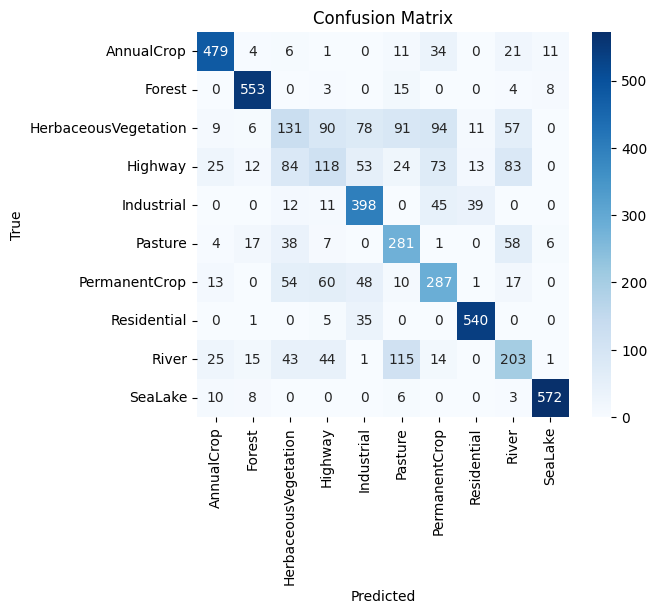

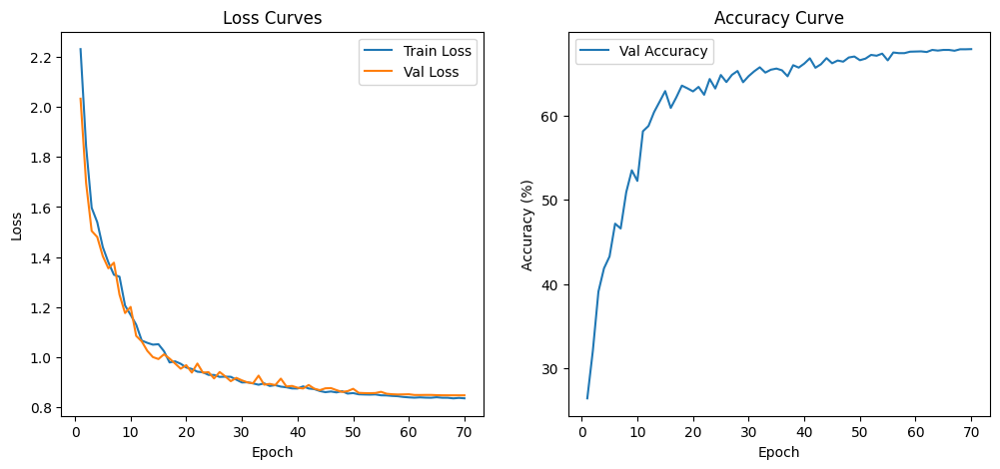

In [9]:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns

model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=device))
model.eval()
all_preds = []
all_labels = []
val_loss_sum = 0.0
n_val = 0

with torch.no_grad():
    for xb,yb in val_loader:
        xb,yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        out = model(xb)
        loss = criterion(out,yb)
        val_loss_sum += loss.item() * xb.size(0)
        preds = out.argmax(dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(yb.cpu().numpy())
        n_val += yb.size(0)

final_acc = 100.0 * np.sum(np.array(all_preds) == np.array(all_labels)) / max(1,n_val)
prec = precision_score(all_labels, all_preds, average='macro')
rec = recall_score(all_labels, all_preds, average='macro')
f1 = f1_score(all_labels, all_preds, average='macro')
cm = confusion_matrix(all_labels, all_preds)

print(f"Final Test Accuracy: {final_acc:.2f}%")
print(f"Precision: {prec:.4f}")
print(f"Recall: {rec:.4f}")
print(f"F1-Score: {f1:.4f}")

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=full_dataset.classes, yticklabels=full_dataset.classes)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(history["epoch"], history["train_loss"], label="Train Loss")
plt.plot(history["epoch"], history["val_loss"], label="Val Loss")
plt.title("Loss Curves"); plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend()

plt.subplot(1,2,2)
plt.plot(history["epoch"], history["val_acc"], label="Val Accuracy")
plt.title("Accuracy Curve"); plt.xlabel("Epoch"); plt.ylabel("Accuracy (%)"); plt.legend()
plt.show()

#### Live Run

C:\Users\Stephen\AppData\Local\Temp\ipykernel_23344\2058306628.py:78: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(os.path.join(SAVE_DIR,WEIGHT_NAME), ma

Subset Accuracy: 83.33%
Precision: 0.8750
Recall: 0.9167
F1-Score: 0.8667


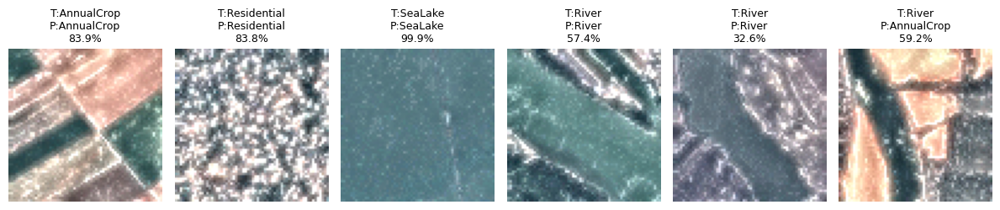

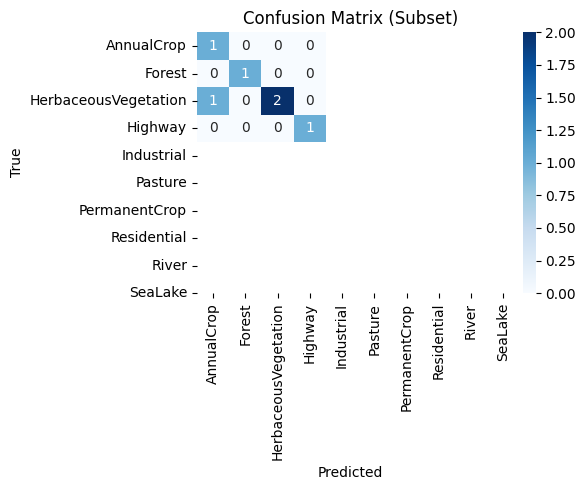

In [4]:
import os, random, numpy as np, torch, cv2
from PIL import Image
from torchvision import datasets, transforms
from torch import nn
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns

SEED=13
np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
os.environ["OMP_NUM_THREADS"]="1"; os.environ["MKL_NUM_THREADS"]="1"; cv2.setNumThreads(0); torch.set_num_threads(1)
device=torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATA_ROOT= "../Dataset/EuroSAT"
SAVE_DIR=  "./saved_model_eurosat"
WEIGHT_NAME="best_improved_model_eurosat_v2.pkl"
IMAGE_SIZE=64
N_SHOW=6

class LaplacianSharpenCLAHE:
    def __init__(self, alpha=0.3, clip_limit=2.0, tile_grid_size=(8,8)):
        self.alpha=float(alpha); self.clip_limit=float(clip_limit); self.tile_grid_size=tile_grid_size
    def __call__(self, img_pil: Image.Image) -> Image.Image:
        img = np.array(img_pil)
        lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        l,a,b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
        l_eq = clahe.apply(l)
        lab_eq = cv2.merge([l_eq,a,b])
        img_eq = cv2.cvtColor(lab_eq, cv2.COLOR_LAB2RGB)
        lap = cv2.Laplacian(img_eq, ddepth=cv2.CV_16S, ksize=3)
        lap = cv2.convertScaleAbs(lap)
        sharp = cv2.addWeighted(img_eq, 1.0, lap, self.alpha, 0)
        return Image.fromarray(sharp)

val_tf = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    LaplacianSharpenCLAHE(alpha=0.3, clip_limit=2.0, tile_grid_size=(8,8)),
    transforms.ToTensor()
])

class CNNLSTM(nn.Module):
    def __init__(self, num_classes: int, hidden_size: int = 64):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3,8,kernel_size=3,stride=1,padding=0),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            nn.Conv2d(8,16,kernel_size=3,stride=1,padding=0),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
        )
        self.flatten = nn.Flatten()
        self.T = 32
        self.F = 3136 // self.T
        self.lstm = nn.LSTM(input_size=self.F, hidden_size=64, num_layers=1, batch_first=True, bidirectional=False)
        self.fc1 = nn.Linear(64,64)
        self.act = nn.ReLU(inplace=True)
        self.fc2 = nn.Linear(64,num_classes)
    def forward(self,x):
        x = self.features(x)
        x = self.flatten(x)
        x = x.view(x.size(0), self.T, self.F)
        y,_ = self.lstm(x)
        h = y[:,-1,:]
        z = self.act(self.fc1(h))
        logits = self.fc2(z)
        return logits

ds = datasets.ImageFolder(DATA_ROOT)
classes = ds.classes
idx = list(range(len(ds))); random.shuffle(idx); idx = idx[:N_SHOW]
items = [(Image.open(ds.samples[i][0]).convert("RGB"), ds.samples[i][1]) for i in idx]
xb = torch.stack([val_tf(img) for img,_ in items]).to(device)
yb = torch.tensor([y for _,y in items], device=device)

model = CNNLSTM(num_classes=len(classes), hidden_size=64).to(device)
state = torch.load(os.path.join(SAVE_DIR,WEIGHT_NAME), map_location=device)
model.load_state_dict(state, strict=False)
model.eval()

with torch.no_grad():
    logits = model(xb)
    probs = torch.softmax(logits, dim=1)
    pred = probs.argmax(1)

acc = 100.0 * (pred==yb).float().mean().item()
prec = precision_score(yb.cpu(),pred.cpu(),average='macro',zero_division=0)
rec  = recall_score(yb.cpu(),pred.cpu(),average='macro',zero_division=0)
f1   = f1_score(yb.cpu(),pred.cpu(),average='macro',zero_division=0)
cm   = confusion_matrix(yb.cpu(),pred.cpu())
print(f"Subset Accuracy: {acc:.2f}%"); print(f"Precision: {prec:.4f}"); print(f"Recall: {rec:.4f}"); print(f"F1-Score: {f1:.4f}")

plt.figure(figsize=(12,3))
for i,(img,y) in enumerate(items):
    x = xb[i].detach().cpu().clamp(0,1).permute(1,2,0).numpy()
    p = int(pred[i].item()); conf = float(probs[i,p].item())
    ax = plt.subplot(1,N_SHOW,i+1); ax.imshow(x); ax.set_title(f"T:{classes[y]}\nP:{classes[p]}\n{conf*100:.1f}%", fontsize=9); ax.axis("off")
plt.tight_layout(); plt.show()

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Confusion Matrix (Subset)"); plt.tight_layout(); plt.show()


### Type-2 (Different Model)

In [1]:
import os, json, random, time, numpy as np, cv2
from PIL import Image
import torch
from torch import nn
import torch.backends.cudnn as cudnn
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt

In [3]:
SEED = 13
DATA_ROOT = r"C:\Users\Stephen\Code\University"
EUROSAT_DIR = DATA_ROOT + r"\EuroSAT"
SAVE_DIR = DATA_ROOT + r"\saved_model_eurosat"
BEST_MODEL_PATH = SAVE_DIR + r"\best_improved_model_eurosat_v3.pkl"

BATCH_SIZE = 500
IMAGE_SIZE = 64
EPOCHS = 70
BASE_LR = 1e-3

os.makedirs(SAVE_DIR, exist_ok=True)
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
cudnn.deterministic = True; cudnn.benchmark = False
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
os.environ["OMP_NUM_THREADS"] = "1"; os.environ["MKL_NUM_THREADS"] = "1"; cv2.setNumThreads(0); torch.set_num_threads(1)
print("device:", device)

device: cuda


In [4]:
class LaplacianSharpenCLAHE:
    def __init__(self, alpha=0.25, clip_limit=2.0, tile_grid_size=(8,8)):
        self.alpha=float(alpha); self.clip_limit=float(clip_limit); self.tile_grid_size=tile_grid_size
    def __call__(self, img_pil: Image.Image) -> Image.Image:
        img = np.array(img_pil)
        lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        l,a,b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
        l_eq = clahe.apply(l)
        lab_eq = cv2.merge([l_eq,a,b])
        img_eq = cv2.cvtColor(lab_eq, cv2.COLOR_LAB2RGB)
        lap = cv2.Laplacian(img_eq, ddepth=cv2.CV_16S, ksize=3)
        lap = cv2.convertScaleAbs(lap)
        sharp = cv2.addWeighted(img_eq, 1.0, lap, self.alpha, 0)
        return Image.fromarray(sharp)

def build_train_tf(sz=64):
    return transforms.Compose([
        transforms.Resize((sz,sz)),
        LaplacianSharpenCLAHE(alpha=0.25, clip_limit=2.0, tile_grid_size=(8,8)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=10),
        transforms.RandomResizedCrop(sz, scale=(0.95,1.0), ratio=(0.95,1.05)),
        transforms.ToTensor(),
    ])

def build_val_tf(sz=64):
    return transforms.Compose([
        transforms.Resize((sz,sz)),
        LaplacianSharpenCLAHE(alpha=0.25, clip_limit=2.0, tile_grid_size=(8,8)),
        transforms.ToTensor(),
    ])

full_dataset = datasets.ImageFolder(EUROSAT_DIR)
TOTAL = len(full_dataset)
train_len = int(0.8*TOTAL); val_len = TOTAL-train_len
g = torch.Generator().manual_seed(SEED)
train_subset, val_subset = random_split(full_dataset, [train_len, val_len], generator=g)

train_subset.dataset.transform = build_train_tf(IMAGE_SIZE)
val_subset.dataset.transform   = build_val_tf(IMAGE_SIZE)

tmp_loader = DataLoader(train_subset, batch_size=256, shuffle=False, num_workers=0, pin_memory=True)
def compute_stats(loader):
    n=0; mean=torch.zeros(3,dtype=torch.double); M2=torch.zeros(3,dtype=torch.double)
    for x,_ in loader:
        x=x.double()
        b,c,h,w=x.shape; p=b*h*w; n+=p
        m=x.mean(dim=[0,2,3]); d=m-mean; mean+=d*(p/n)
        var=((x-m[None,:,None,None])**2).sum(dim=[0,2,3])/p
        M2+=var*p
    std=torch.sqrt(M2/max(1,n))
    return mean.float(), std.float()
train_mean, train_std = compute_stats(tmp_loader)
norm_tf = transforms.Normalize(mean=train_mean.tolist(), std=train_std.tolist())

train_subset.dataset.transform = transforms.Compose([build_train_tf(IMAGE_SIZE), norm_tf])
val_subset.dataset.transform   = transforms.Compose([build_val_tf(IMAGE_SIZE),   norm_tf])

train_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=0, pin_memory=True, drop_last=True)
val_loader   = DataLoader(val_subset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)
num_classes = len(full_dataset.classes)
print("classes:", full_dataset.classes)
print("mean/std:", train_mean.tolist(), train_std.tolist())

classes: ['AnnualCrop', 'Forest', 'HerbaceousVegetation', 'Highway', 'Industrial', 'Pasture', 'PermanentCrop', 'Residential', 'River', 'SeaLake']
mean/std: [0.4840352237224579, 0.5211266279220581, 0.5482553839683533] [0.23421944677829742, 0.18533417582511902, 0.16956263780593872]


In [5]:
class DWConv(nn.Module):
    def __init__(self, cin, cout, k=3, s=1, p=0):
        super().__init__()
        self.dw = nn.Conv2d(cin, cin, k, s, p, groups=cin, bias=False)
        self.pw = nn.Conv2d(cin, cout, 1, 1, 0, bias=False)
        self.act = nn.ReLU(inplace=True)
    def forward(self,x):
        x=self.dw(x); x=self.pw(x); x=self.act(x); return x

class SE(nn.Module):
    def __init__(self, c, r=8):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(nn.Linear(c, c//r), nn.ReLU(inplace=True), nn.Linear(c//r, c), nn.Sigmoid())
    def forward(self,x):
        b,c,_,_=x.shape
        w=self.pool(x).view(b,c)
        w=self.fc(w).view(b,c,1,1)
        return x*w

class LitePlusBiGRU(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.b1 = nn.Sequential(DWConv(3,16,k=3,s=1,p=0), nn.MaxPool2d(2))   
        self.b2 = nn.Sequential(DWConv(16,32,k=3,s=1,p=0), nn.MaxPool2d(2))  
        self.b3 = nn.Sequential(DWConv(32,32,k=3,s=1,p=0))                   
        self.se = SE(32, r=8)
        self.flat = nn.Flatten()
        self.T = 32
        self.gru = nn.GRU(input_size=144, hidden_size=48, num_layers=1, batch_first=True, bidirectional=True)
        self.head = nn.Sequential(nn.Linear(96,64), nn.ReLU(inplace=True), nn.Linear(64,num_classes))
    def forward(self,x):
        x=self.b1(x); x=self.b2(x); x=self.b3(x); x=self.se(x)
        x=self.flat(x)              
        x=x.view(x.size(0), self.T, 4608//self.T)  
        y,_=self.gru(x)
        h=y[:,-1,:]                
        z=self.head(h)             
        return z

model = LitePlusBiGRU(num_classes=num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=BASE_LR)
print("params(M):", sum(p.numel() for p in model.parameters())/1e6)

params(M): 0.065065


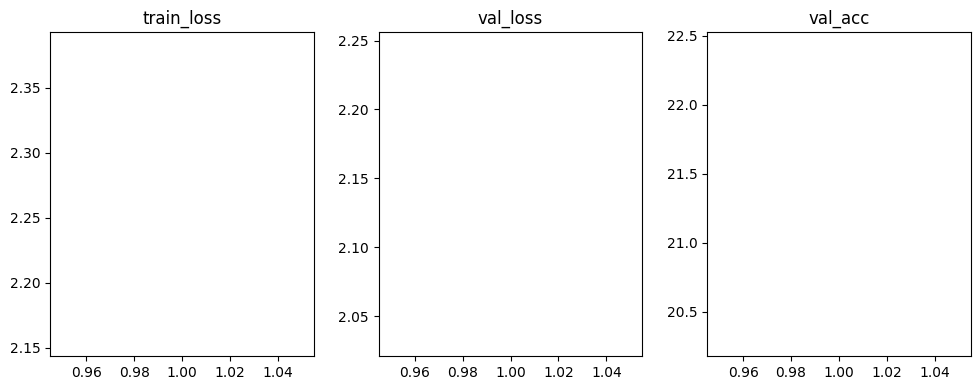

epoch=1/70  train_loss=2.2681  val_loss=2.1384  val_acc=21.35%  lr=0.001000


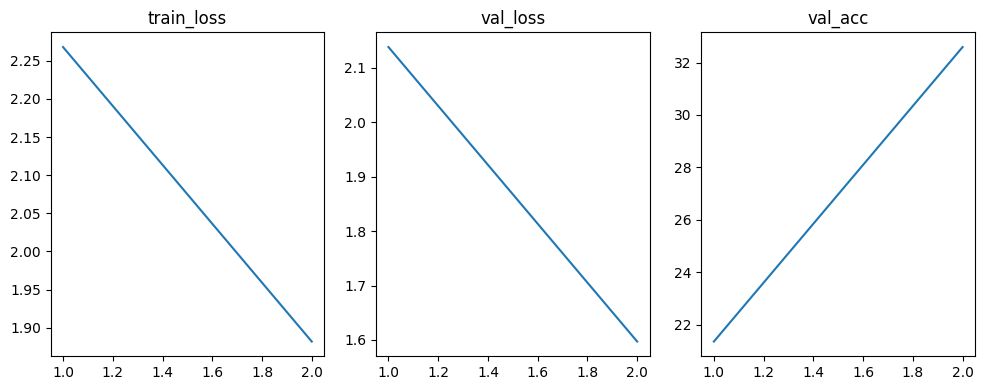

epoch=2/70  train_loss=1.8819  val_loss=1.5971  val_acc=32.59%  lr=0.001000


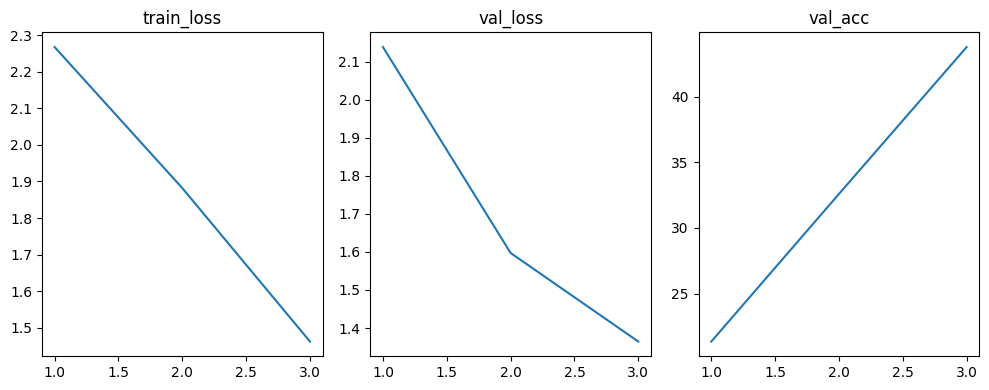

epoch=3/70  train_loss=1.4617  val_loss=1.3644  val_acc=43.78%  lr=0.001000


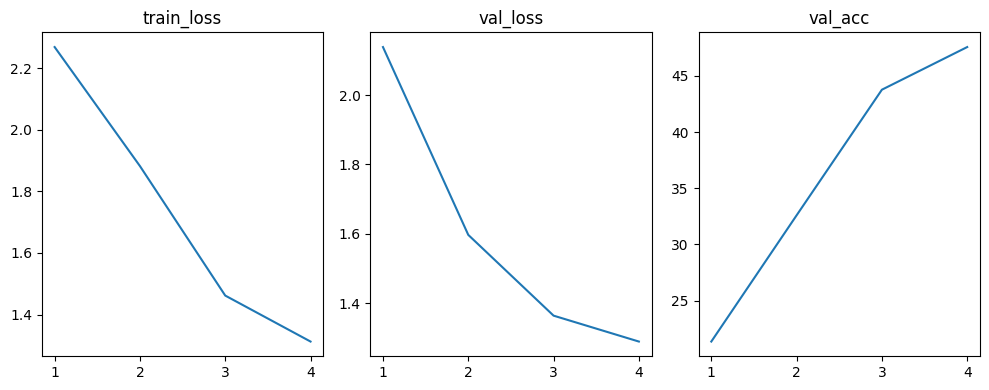

epoch=4/70  train_loss=1.3125  val_loss=1.2897  val_acc=47.57%  lr=0.001000


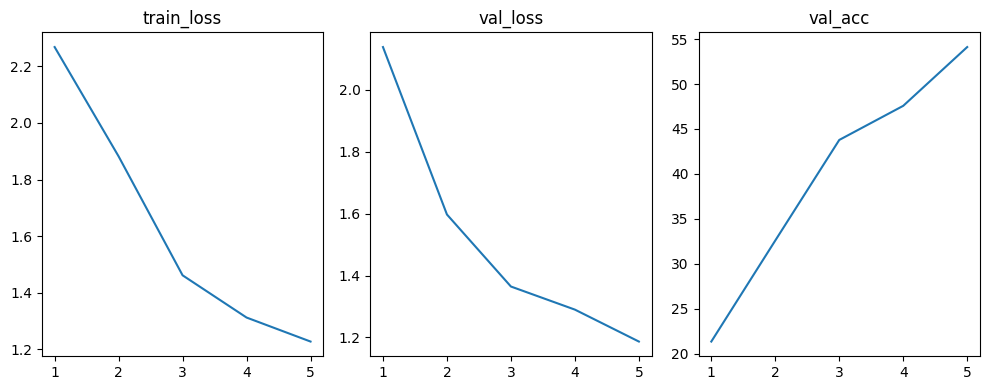

epoch=5/70  train_loss=1.2277  val_loss=1.1865  val_acc=54.11%  lr=0.001000


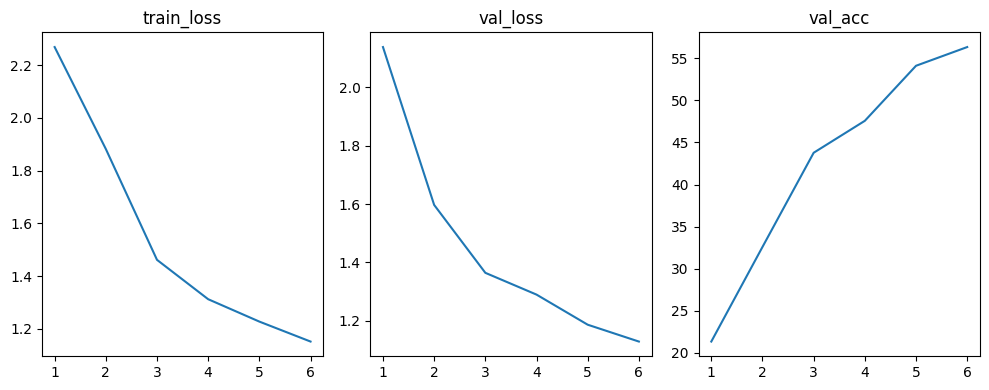

epoch=6/70  train_loss=1.1521  val_loss=1.1287  val_acc=56.33%  lr=0.001000


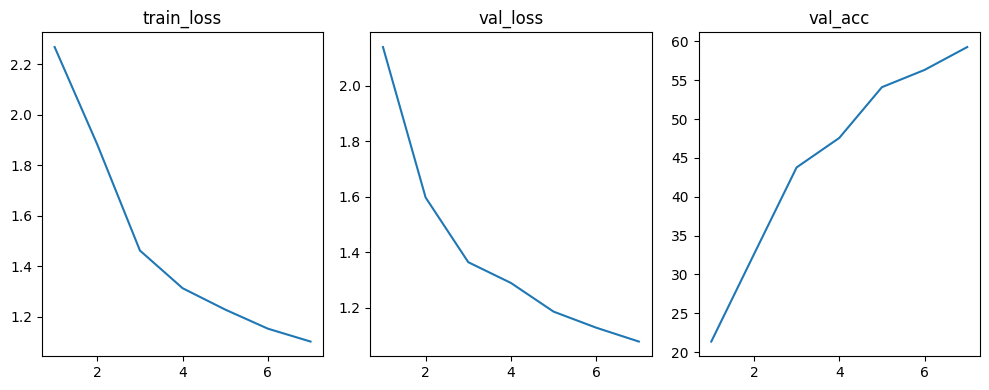

epoch=7/70  train_loss=1.1011  val_loss=1.0789  val_acc=59.28%  lr=0.001000


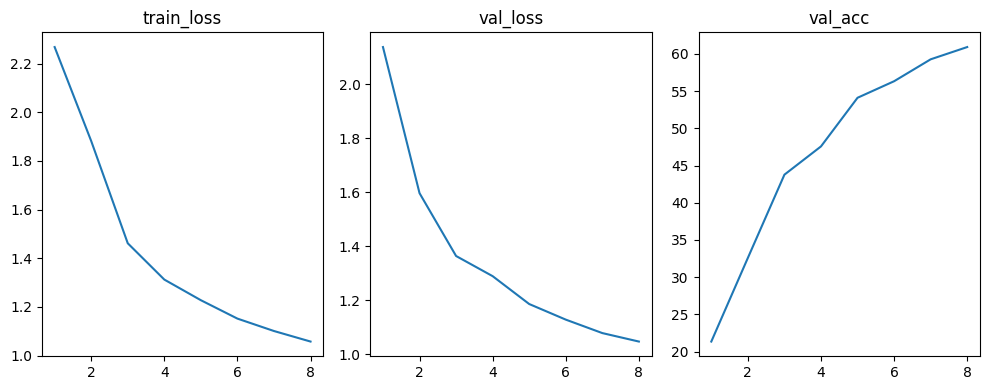

epoch=8/70  train_loss=1.0578  val_loss=1.0475  val_acc=60.93%  lr=0.001000


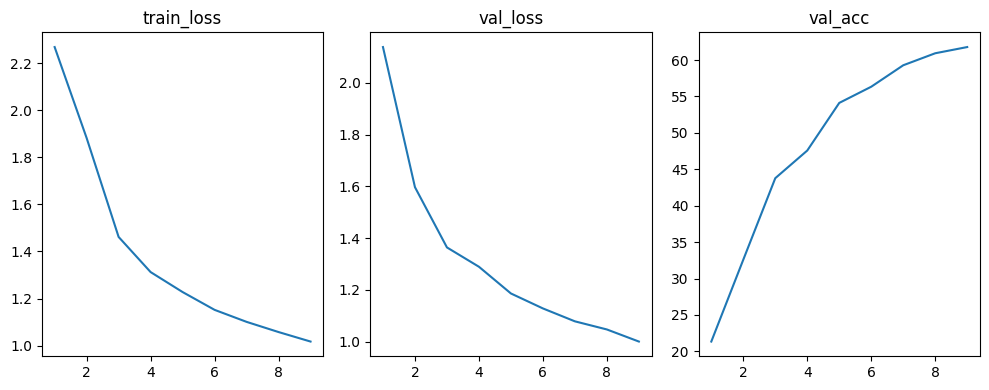

epoch=9/70  train_loss=1.0175  val_loss=1.0008  val_acc=61.78%  lr=0.001000


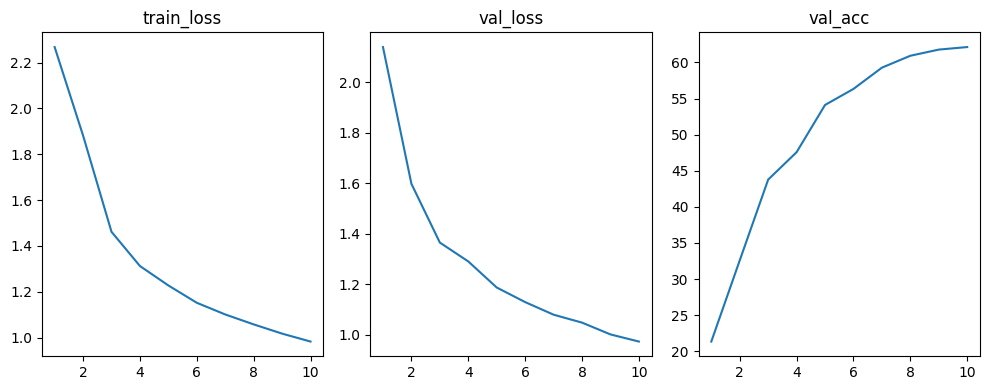

epoch=10/70  train_loss=0.9829  val_loss=0.9725  val_acc=62.13%  lr=0.001000


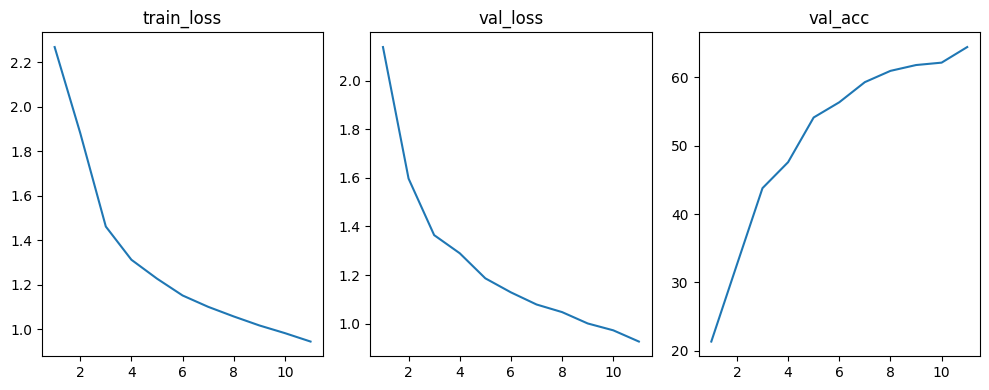

epoch=11/70  train_loss=0.9451  val_loss=0.9263  val_acc=64.41%  lr=0.001000


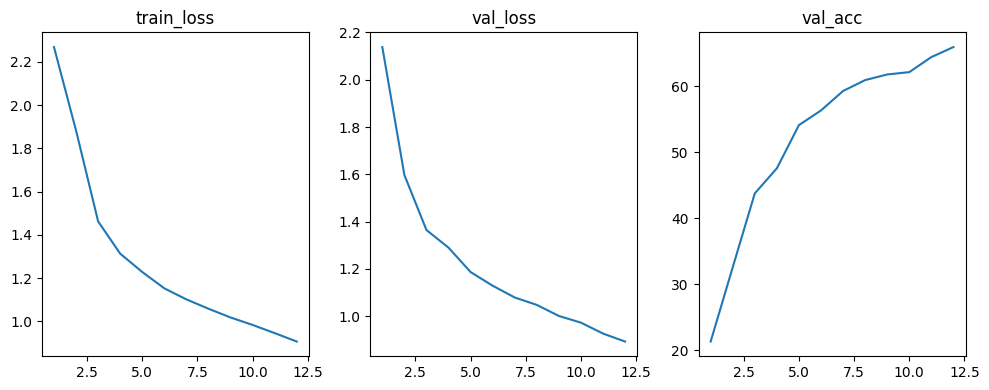

epoch=12/70  train_loss=0.9061  val_loss=0.8925  val_acc=65.93%  lr=0.001000


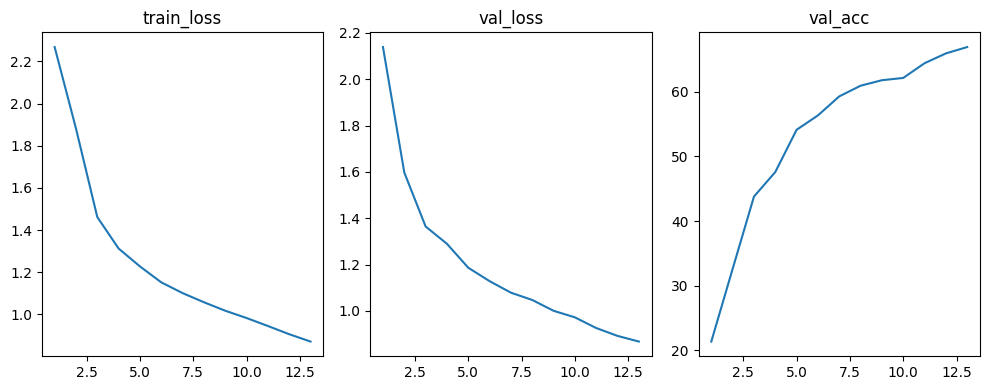

epoch=13/70  train_loss=0.8713  val_loss=0.8681  val_acc=66.91%  lr=0.001000


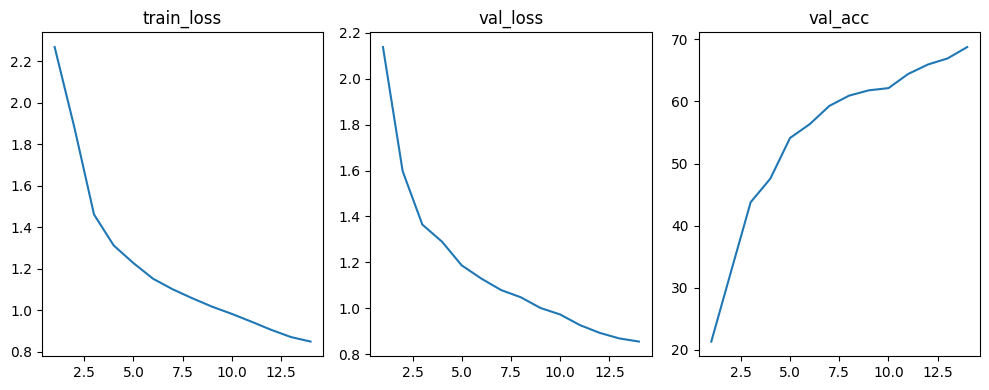

epoch=14/70  train_loss=0.8495  val_loss=0.8544  val_acc=68.74%  lr=0.001000


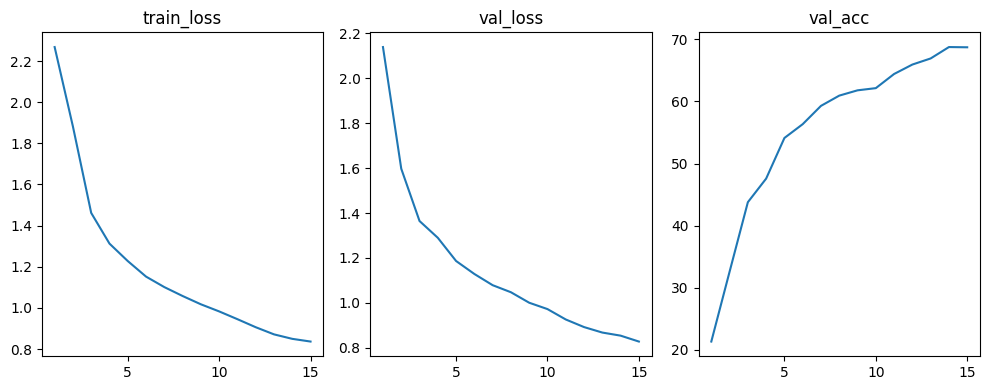

epoch=15/70  train_loss=0.8363  val_loss=0.8281  val_acc=68.70%  lr=0.001000


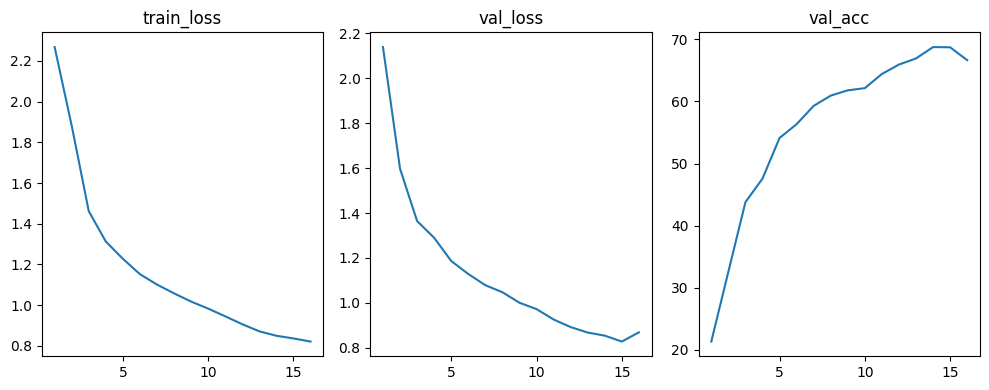

epoch=16/70  train_loss=0.8211  val_loss=0.8691  val_acc=66.63%  lr=0.001000


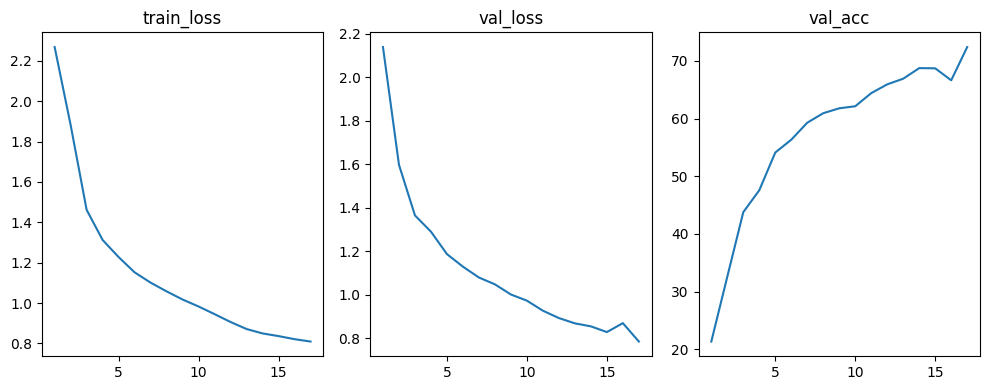

epoch=17/70  train_loss=0.8093  val_loss=0.7845  val_acc=72.39%  lr=0.001000


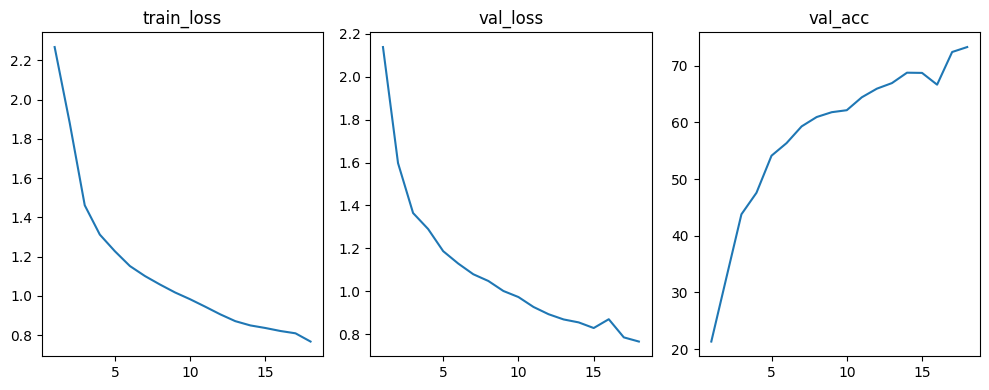

epoch=18/70  train_loss=0.7673  val_loss=0.7650  val_acc=73.26%  lr=0.001000


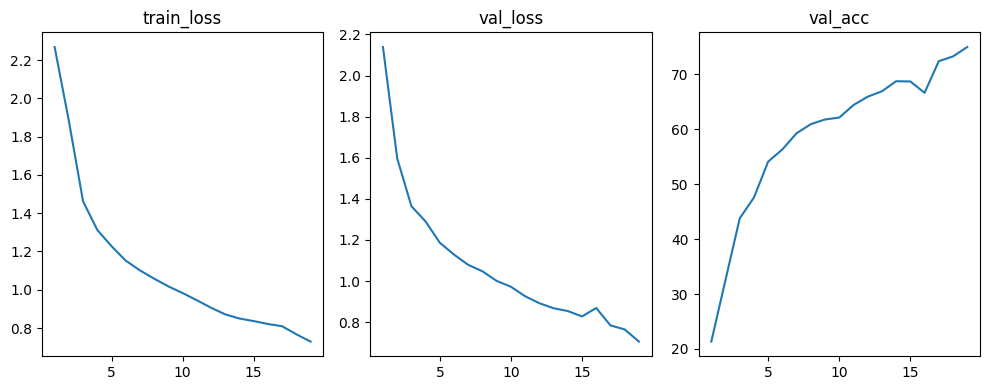

epoch=19/70  train_loss=0.7293  val_loss=0.7060  val_acc=74.96%  lr=0.001000


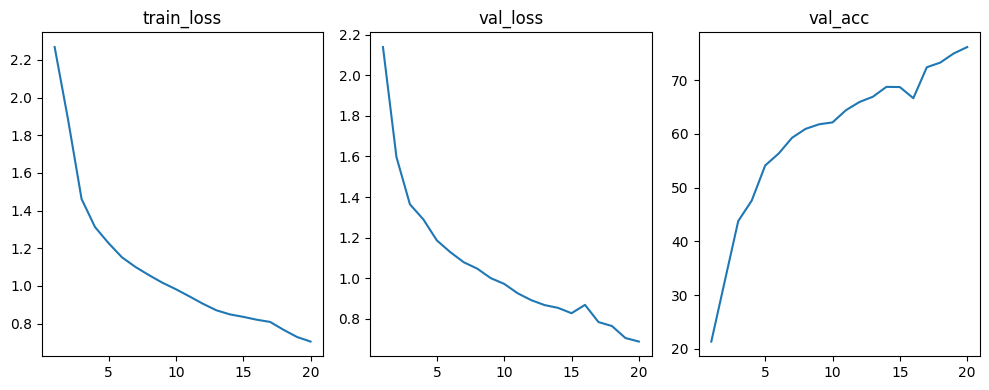

epoch=20/70  train_loss=0.7051  val_loss=0.6886  val_acc=76.15%  lr=0.001000


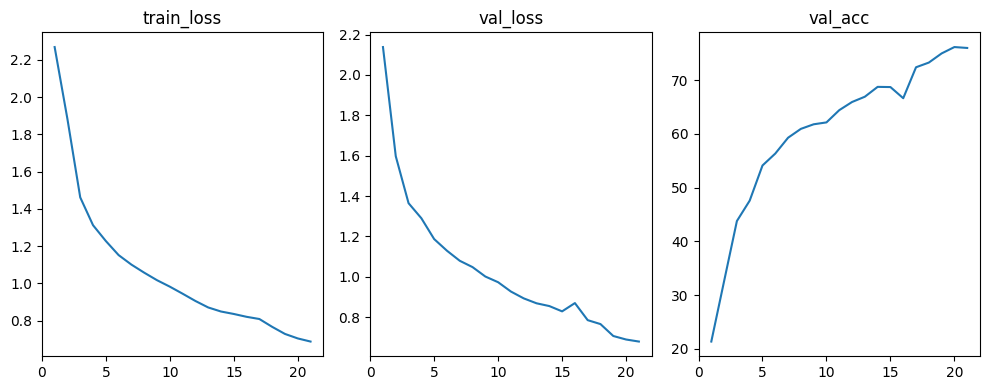

epoch=21/70  train_loss=0.6884  val_loss=0.6784  val_acc=75.98%  lr=0.001000


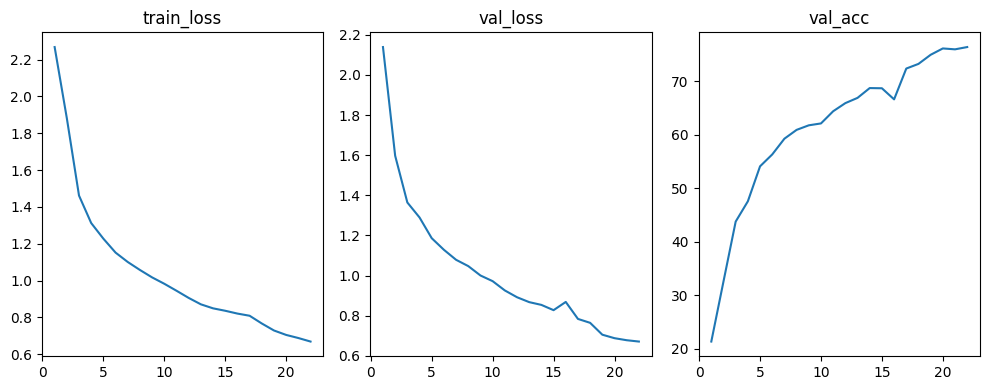

epoch=22/70  train_loss=0.6692  val_loss=0.6718  val_acc=76.41%  lr=0.001000


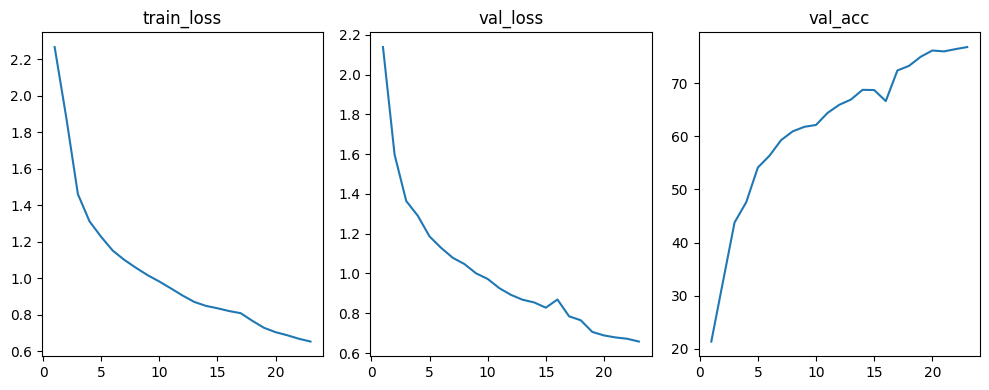

epoch=23/70  train_loss=0.6539  val_loss=0.6578  val_acc=76.80%  lr=0.001000


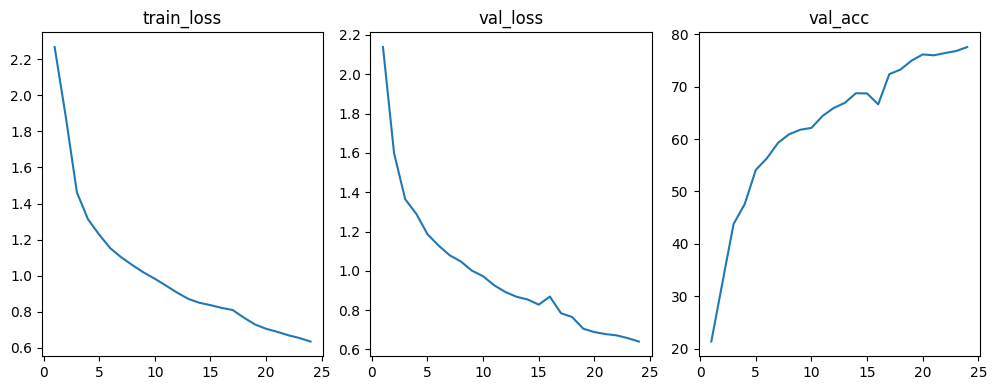

epoch=24/70  train_loss=0.6343  val_loss=0.6404  val_acc=77.56%  lr=0.001000


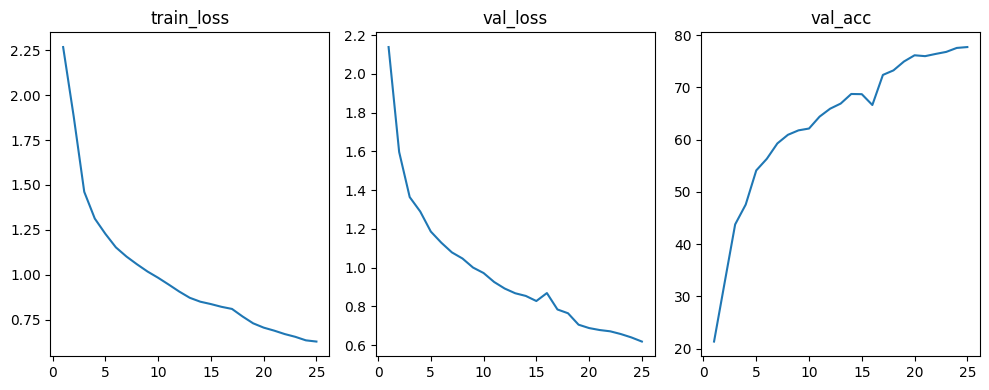

epoch=25/70  train_loss=0.6275  val_loss=0.6190  val_acc=77.72%  lr=0.001000


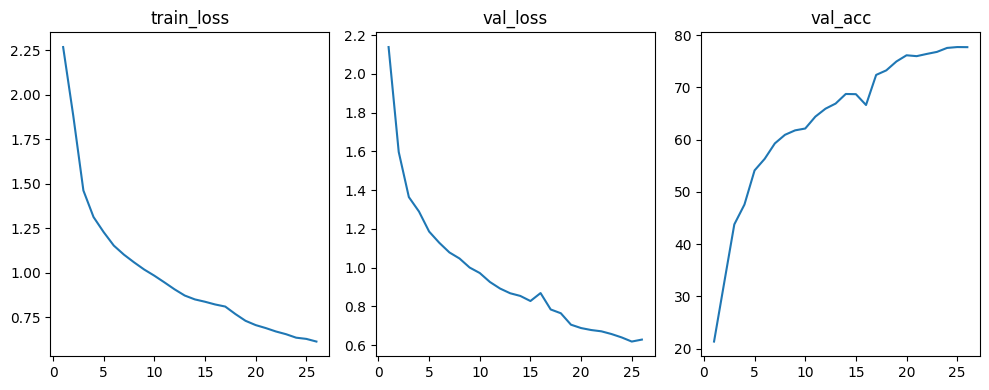

epoch=26/70  train_loss=0.6125  val_loss=0.6291  val_acc=77.70%  lr=0.001000


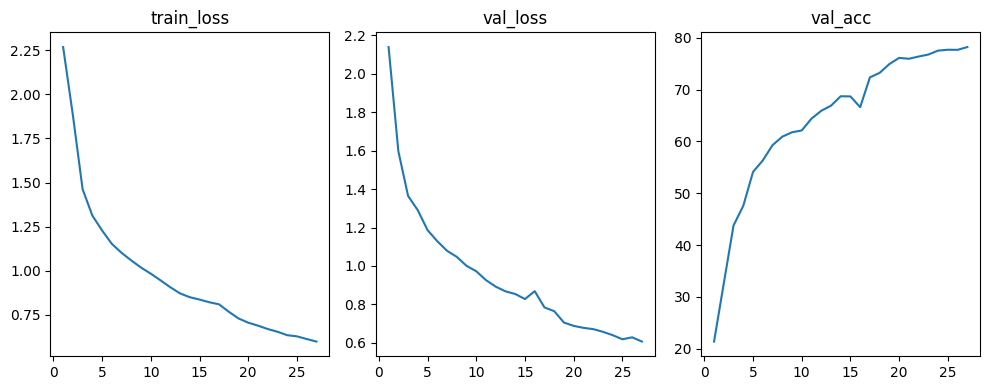

epoch=27/70  train_loss=0.5981  val_loss=0.6071  val_acc=78.24%  lr=0.001000


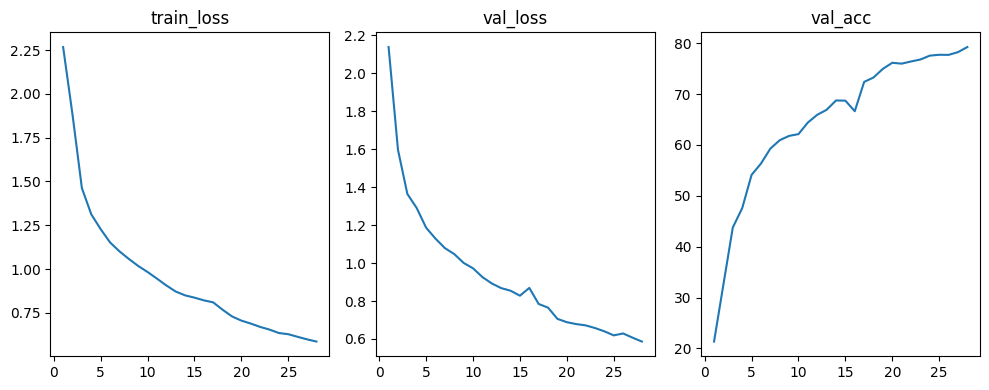

epoch=28/70  train_loss=0.5856  val_loss=0.5865  val_acc=79.24%  lr=0.001000


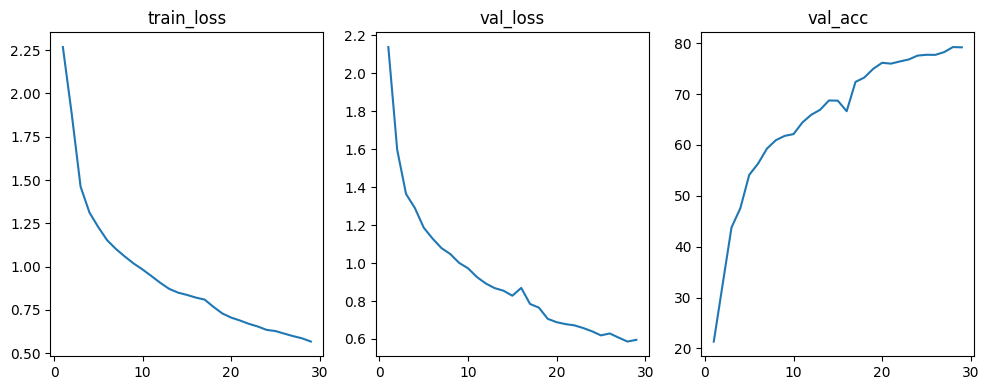

epoch=29/70  train_loss=0.5669  val_loss=0.5956  val_acc=79.19%  lr=0.001000


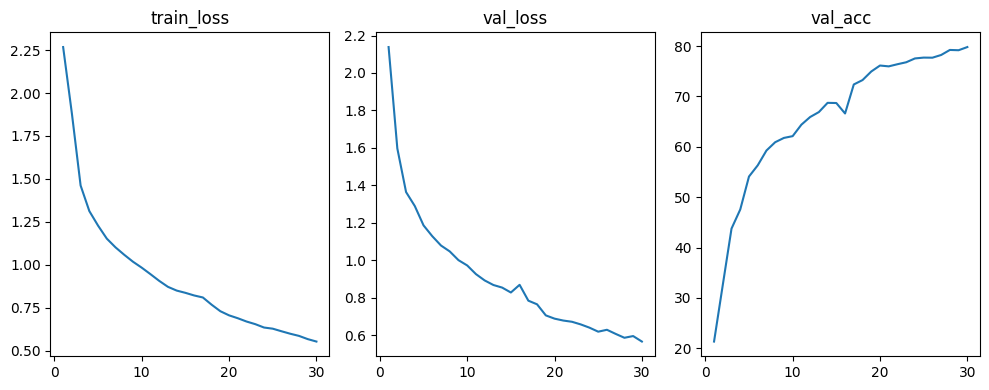

epoch=30/70  train_loss=0.5526  val_loss=0.5663  val_acc=79.81%  lr=0.001000


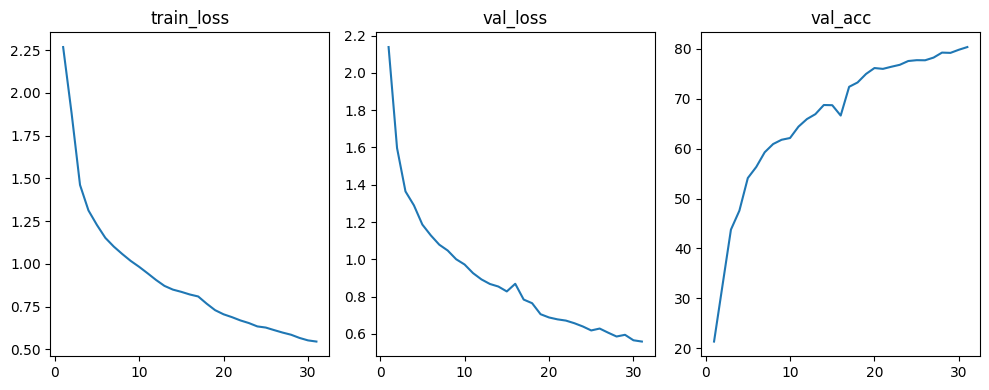

epoch=31/70  train_loss=0.5457  val_loss=0.5594  val_acc=80.35%  lr=0.001000


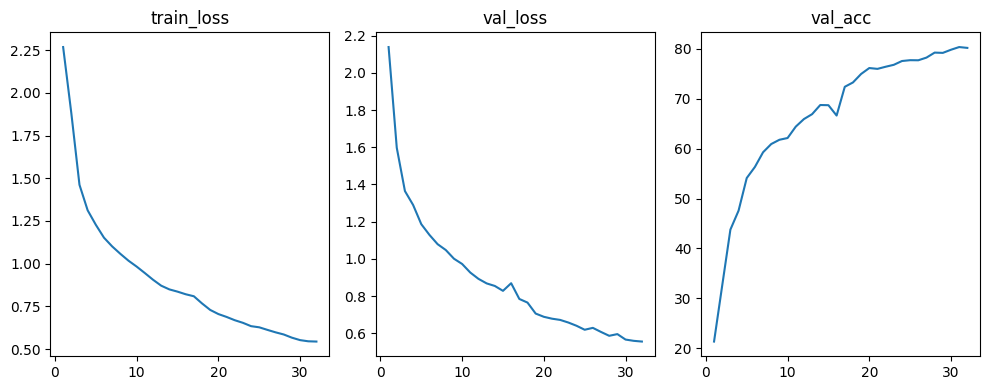

epoch=32/70  train_loss=0.5442  val_loss=0.5555  val_acc=80.19%  lr=0.001000


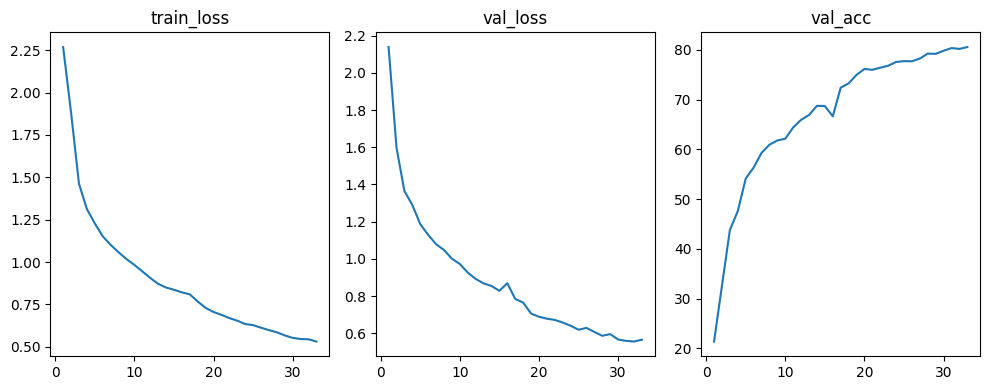

epoch=33/70  train_loss=0.5307  val_loss=0.5657  val_acc=80.56%  lr=0.001000


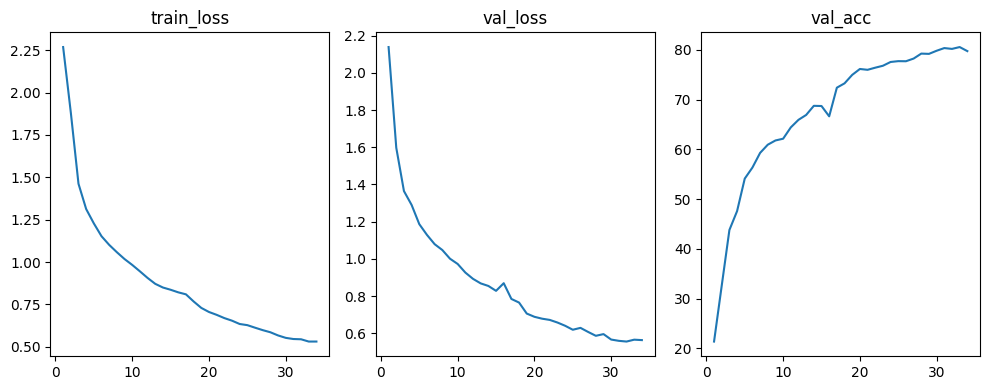

epoch=34/70  train_loss=0.5308  val_loss=0.5633  val_acc=79.74%  lr=0.001000


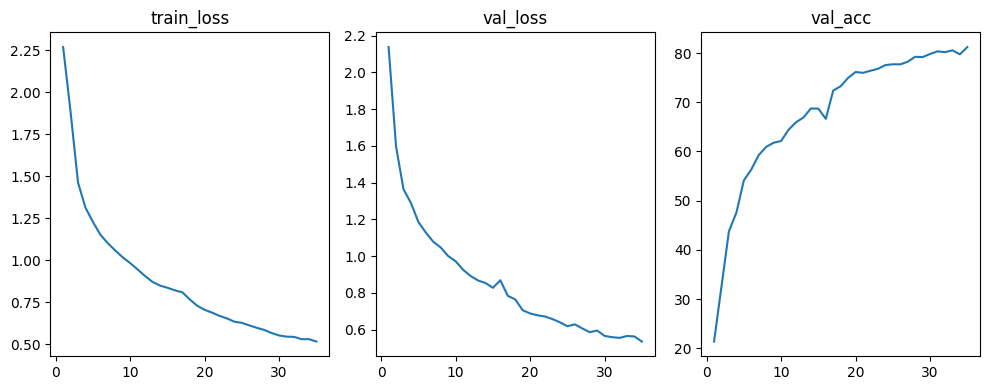

epoch=35/70  train_loss=0.5165  val_loss=0.5356  val_acc=81.22%  lr=0.001000


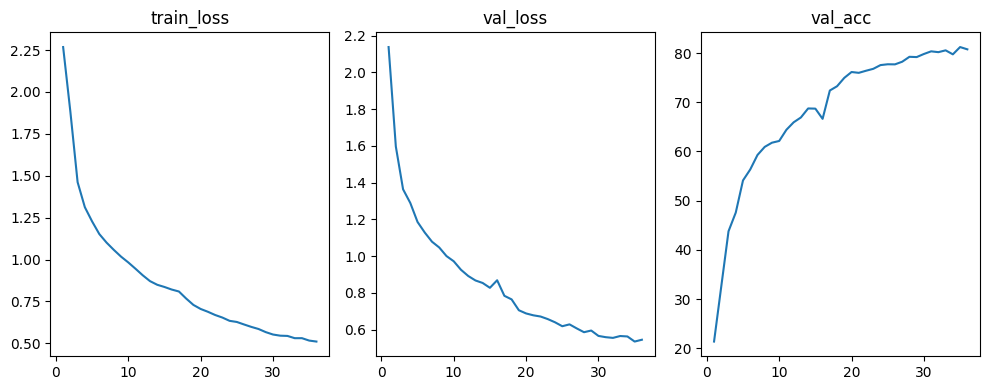

epoch=36/70  train_loss=0.5106  val_loss=0.5455  val_acc=80.76%  lr=0.001000


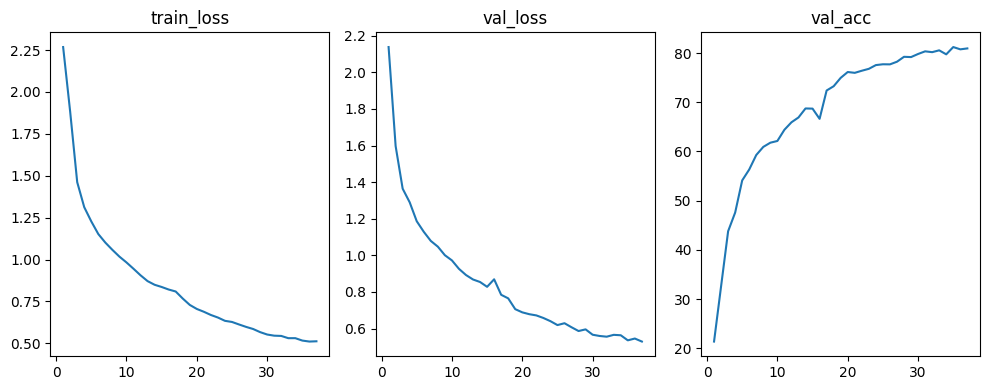

epoch=37/70  train_loss=0.5122  val_loss=0.5290  val_acc=80.94%  lr=0.001000


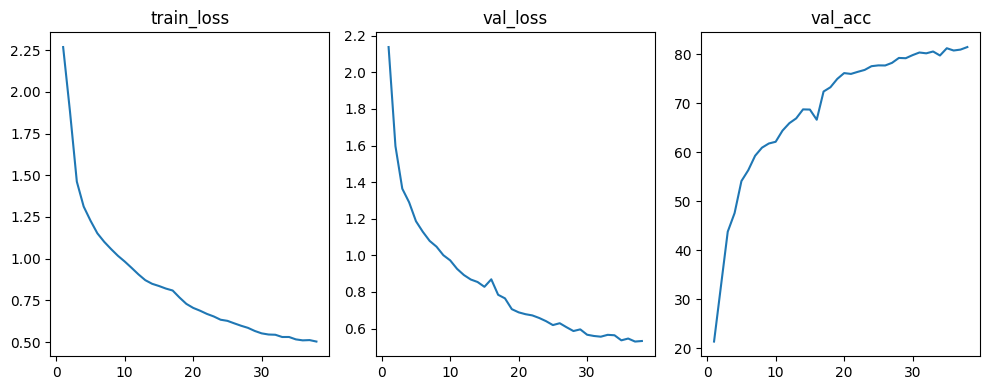

epoch=38/70  train_loss=0.5035  val_loss=0.5319  val_acc=81.46%  lr=0.001000


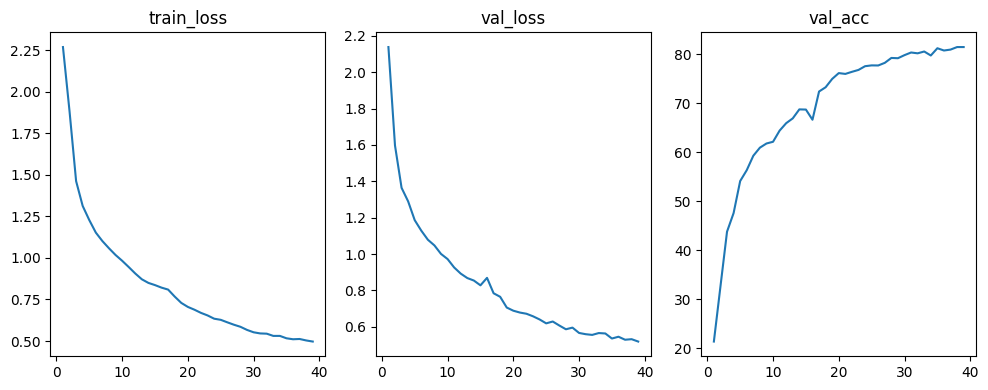

epoch=39/70  train_loss=0.4968  val_loss=0.5189  val_acc=81.46%  lr=0.001000


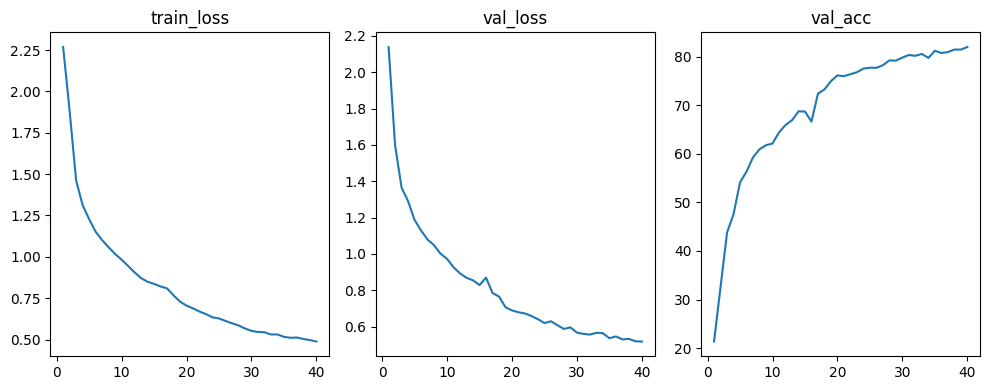

epoch=40/70  train_loss=0.4879  val_loss=0.5173  val_acc=81.98%  lr=0.001000


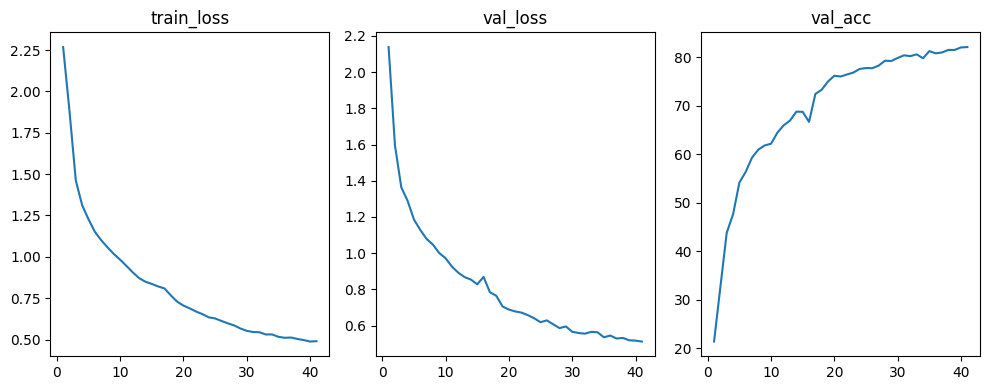

epoch=41/70  train_loss=0.4902  val_loss=0.5121  val_acc=82.06%  lr=0.001000


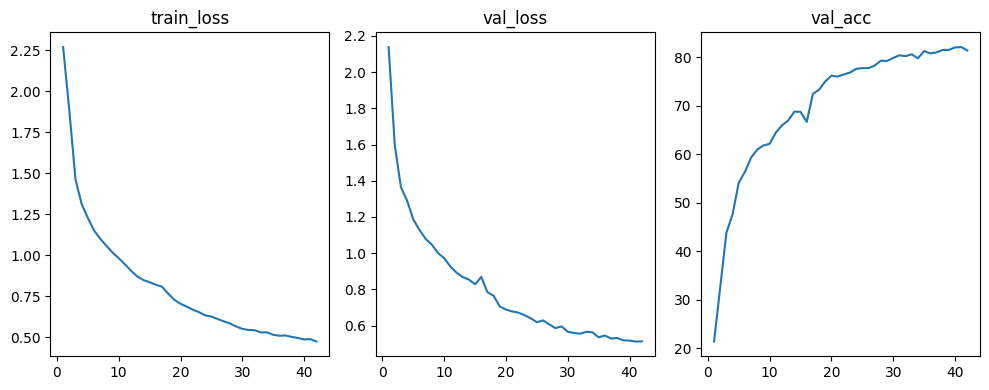

epoch=42/70  train_loss=0.4752  val_loss=0.5129  val_acc=81.35%  lr=0.001000


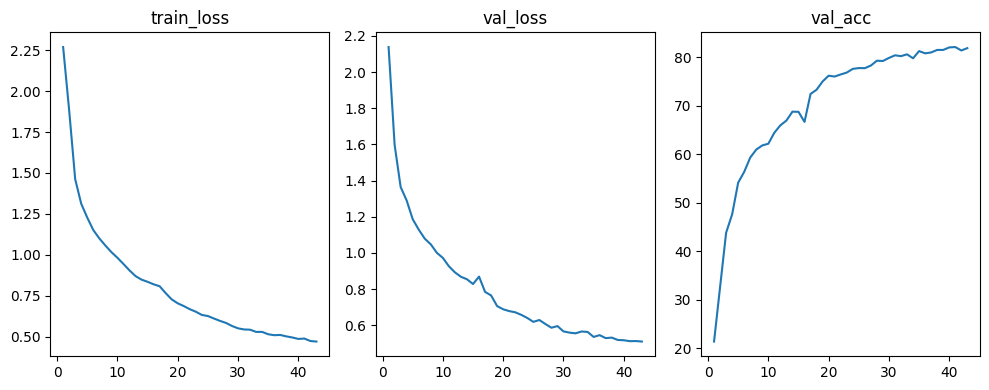

epoch=43/70  train_loss=0.4719  val_loss=0.5101  val_acc=81.83%  lr=0.001000


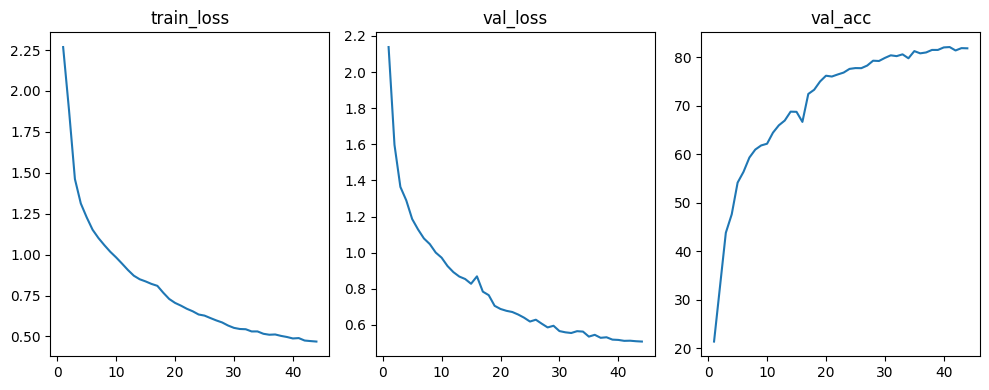

epoch=44/70  train_loss=0.4690  val_loss=0.5082  val_acc=81.80%  lr=0.001000


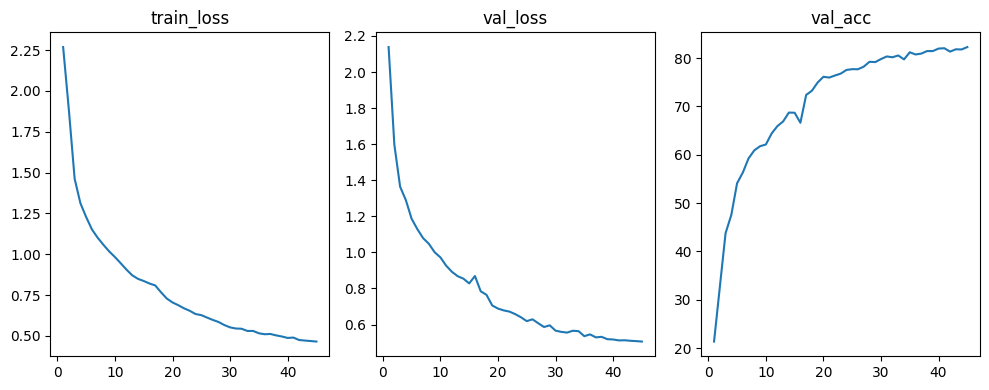

epoch=45/70  train_loss=0.4658  val_loss=0.5058  val_acc=82.30%  lr=0.001000


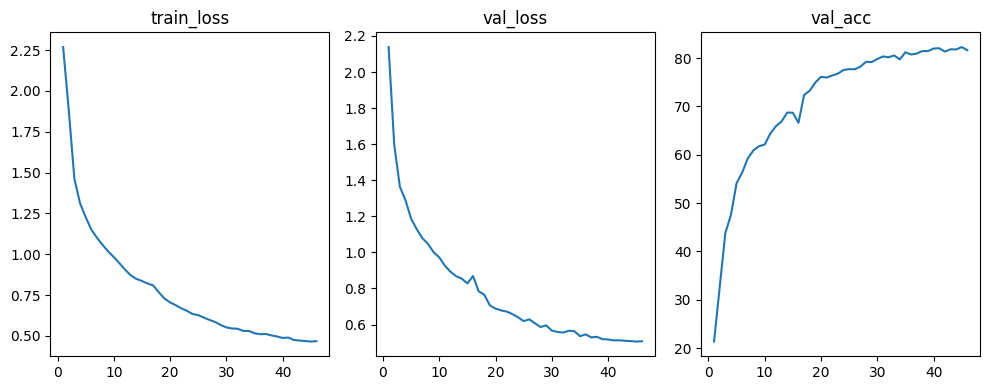

epoch=46/70  train_loss=0.4681  val_loss=0.5074  val_acc=81.65%  lr=0.001000


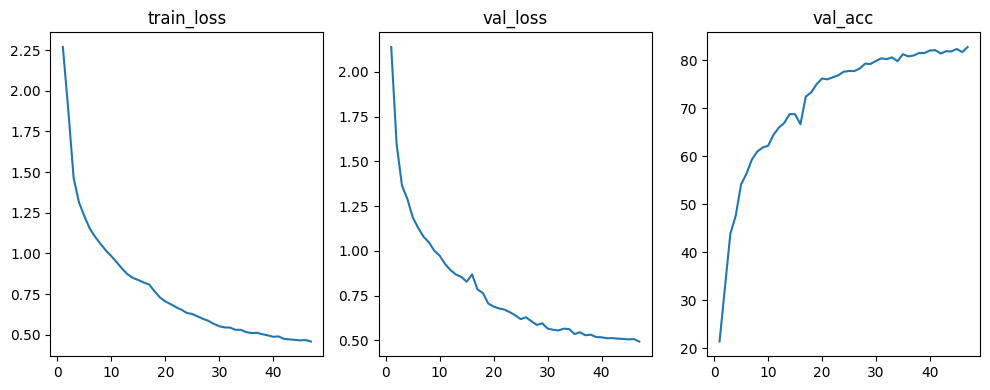

epoch=47/70  train_loss=0.4586  val_loss=0.4936  val_acc=82.70%  lr=0.001000


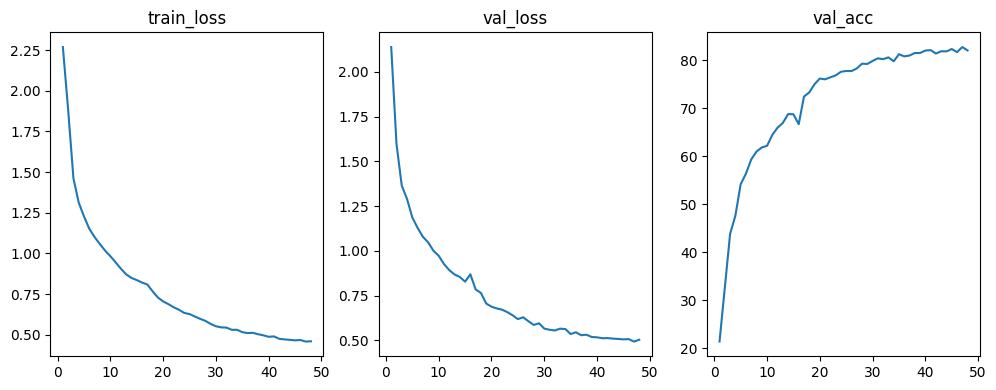

epoch=48/70  train_loss=0.4603  val_loss=0.5039  val_acc=82.00%  lr=0.001000


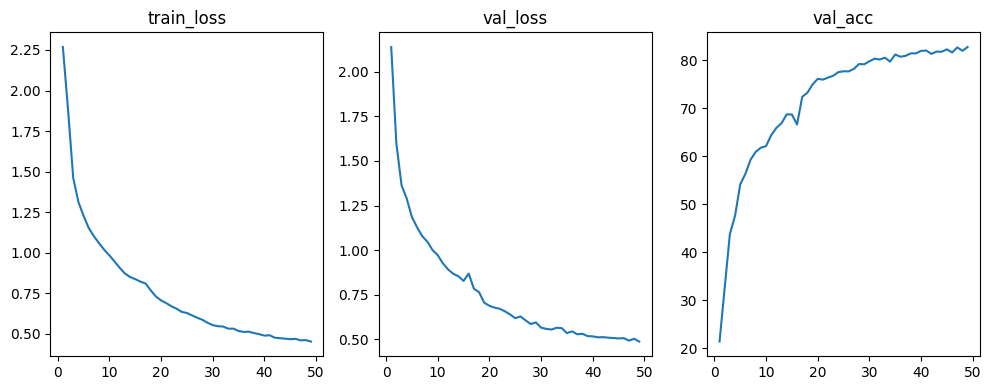

epoch=49/70  train_loss=0.4513  val_loss=0.4883  val_acc=82.78%  lr=0.001000


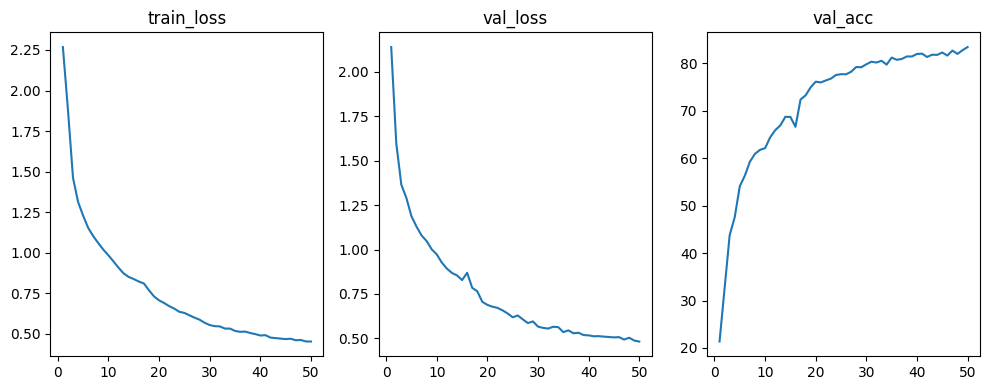

epoch=50/70  train_loss=0.4507  val_loss=0.4825  val_acc=83.44%  lr=0.001000


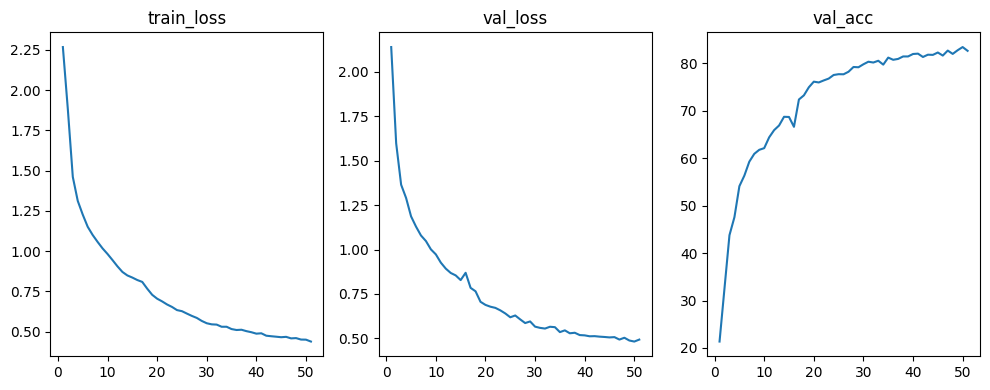

epoch=51/70  train_loss=0.4389  val_loss=0.4935  val_acc=82.65%  lr=0.001000


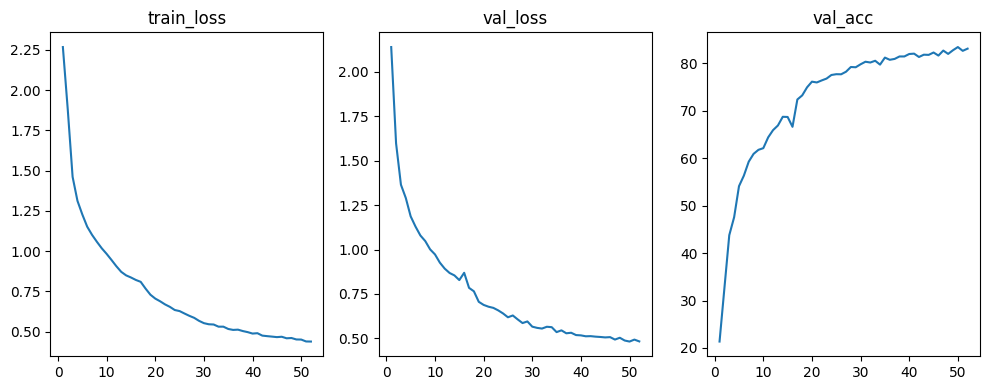

epoch=52/70  train_loss=0.4383  val_loss=0.4834  val_acc=83.11%  lr=0.001000


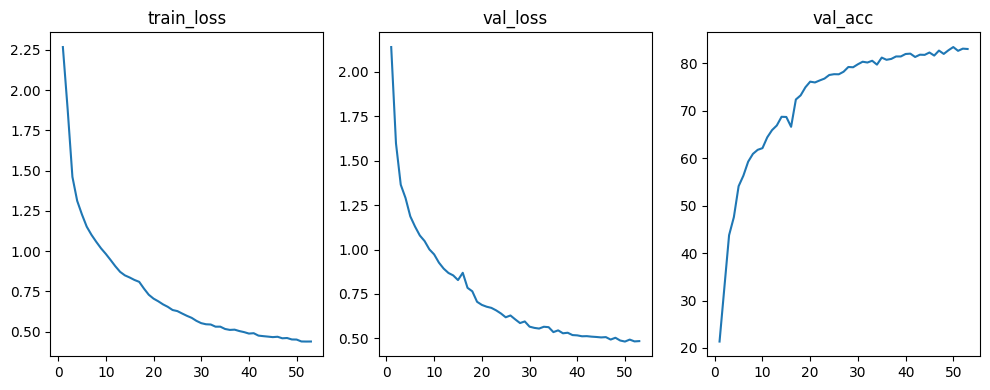

epoch=53/70  train_loss=0.4386  val_loss=0.4850  val_acc=83.04%  lr=0.001000


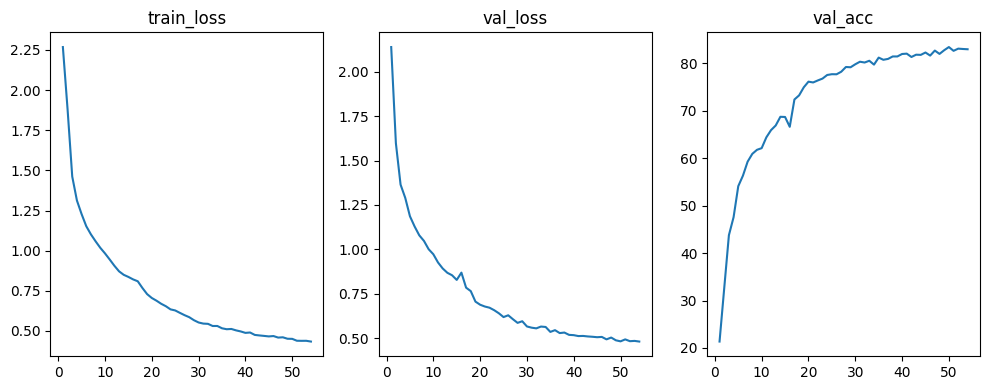

epoch=54/70  train_loss=0.4338  val_loss=0.4813  val_acc=82.98%  lr=0.001000


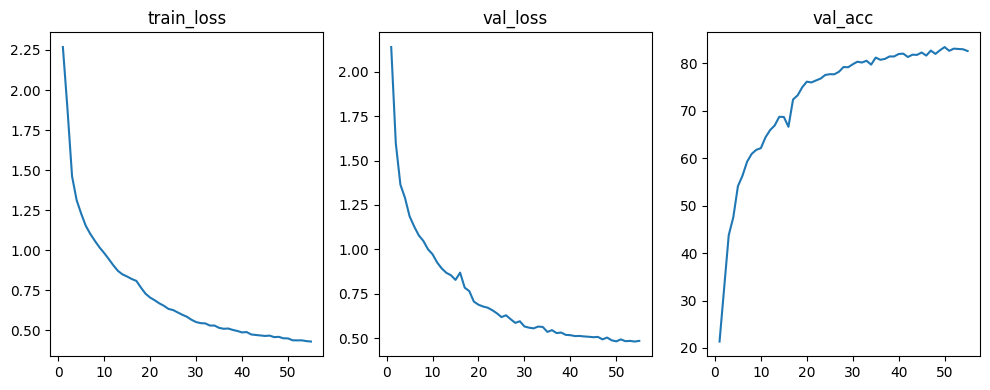

epoch=55/70  train_loss=0.4309  val_loss=0.4851  val_acc=82.61%  lr=0.001000


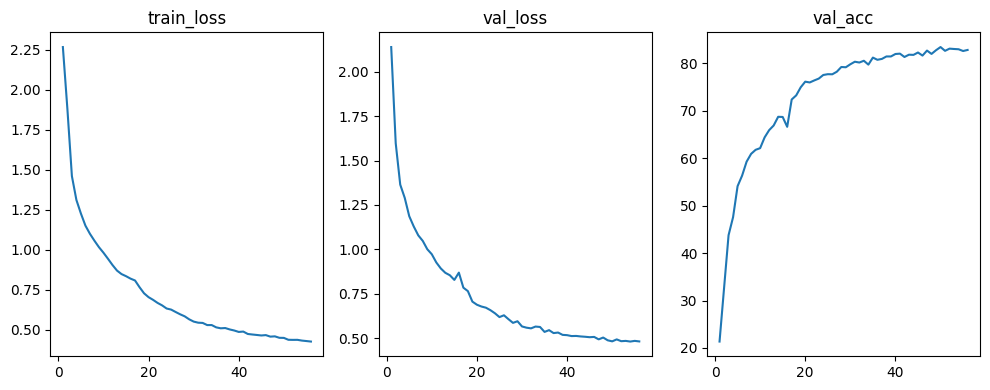

epoch=56/70  train_loss=0.4278  val_loss=0.4820  val_acc=82.83%  lr=0.001000


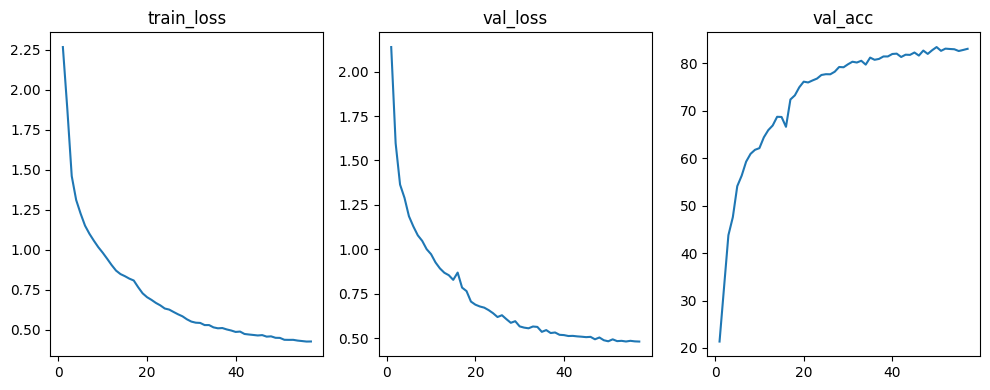

epoch=57/70  train_loss=0.4282  val_loss=0.4810  val_acc=83.07%  lr=0.001000


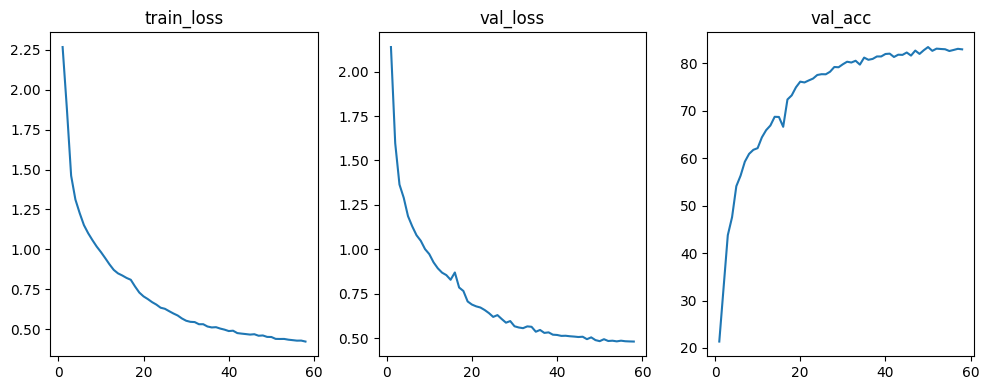

epoch=58/70  train_loss=0.4221  val_loss=0.4802  val_acc=82.96%  lr=0.001000


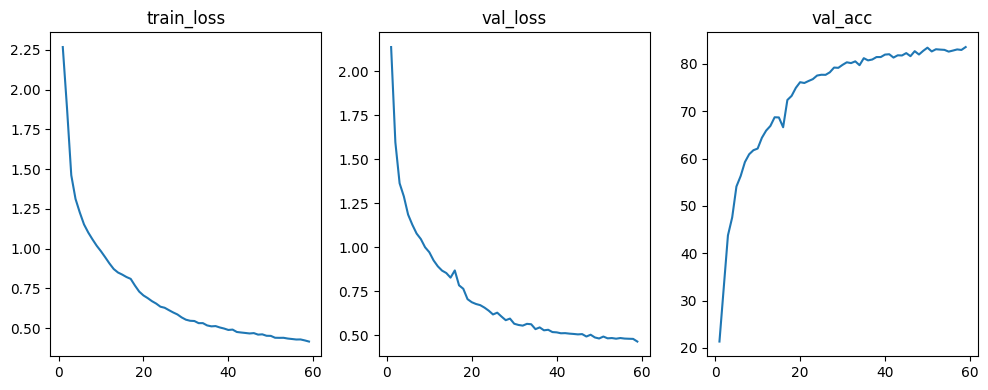

epoch=59/70  train_loss=0.4149  val_loss=0.4651  val_acc=83.57%  lr=0.001000


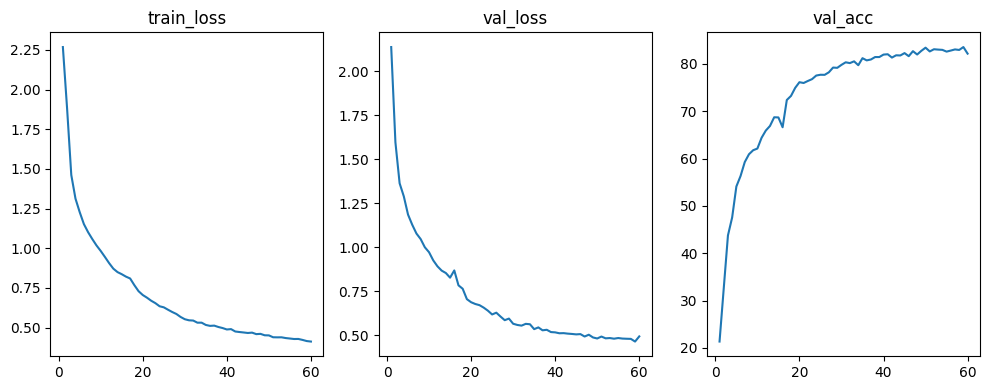

epoch=60/70  train_loss=0.4118  val_loss=0.4943  val_acc=82.19%  lr=0.001000


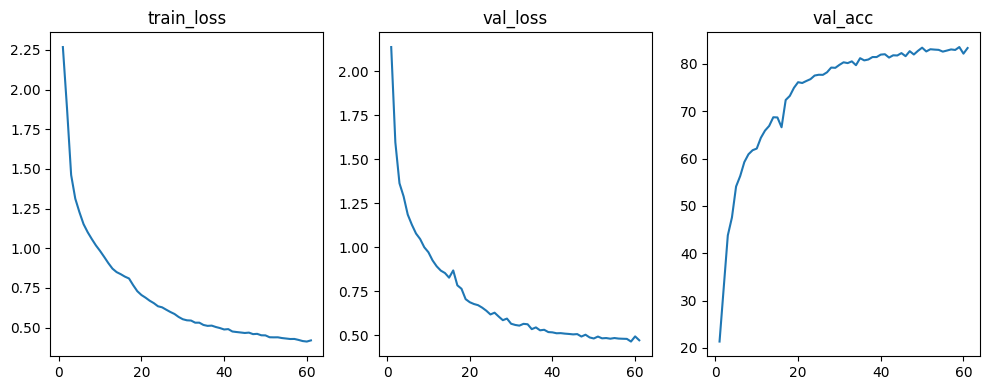

epoch=61/70  train_loss=0.4191  val_loss=0.4722  val_acc=83.37%  lr=0.001000


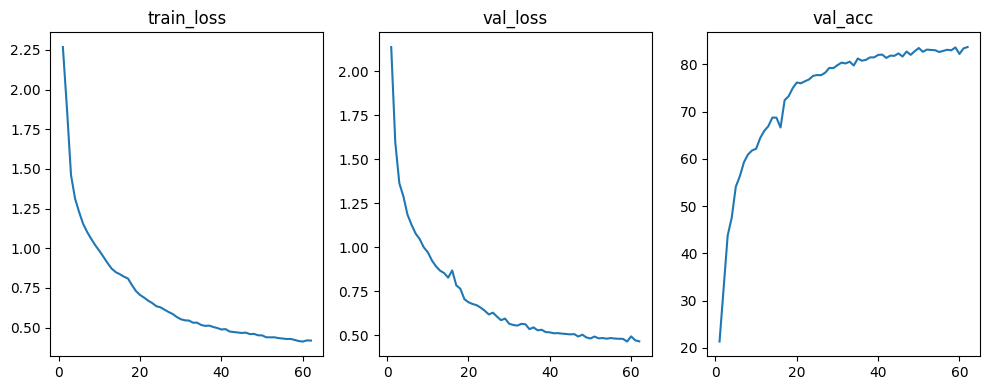

epoch=62/70  train_loss=0.4180  val_loss=0.4661  val_acc=83.65%  lr=0.001000


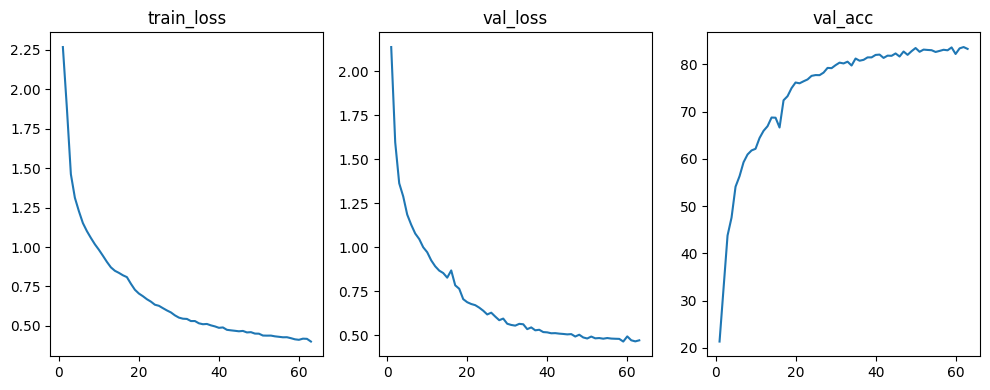

epoch=63/70  train_loss=0.4008  val_loss=0.4720  val_acc=83.26%  lr=0.001000


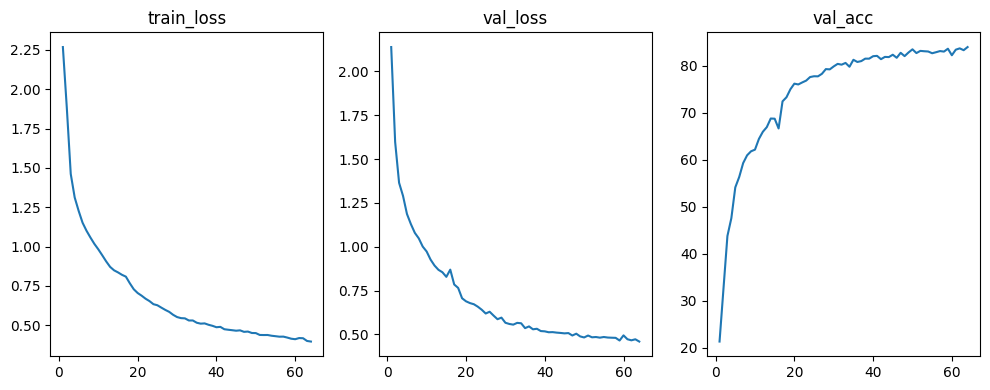

epoch=64/70  train_loss=0.3969  val_loss=0.4591  val_acc=83.93%  lr=0.001000


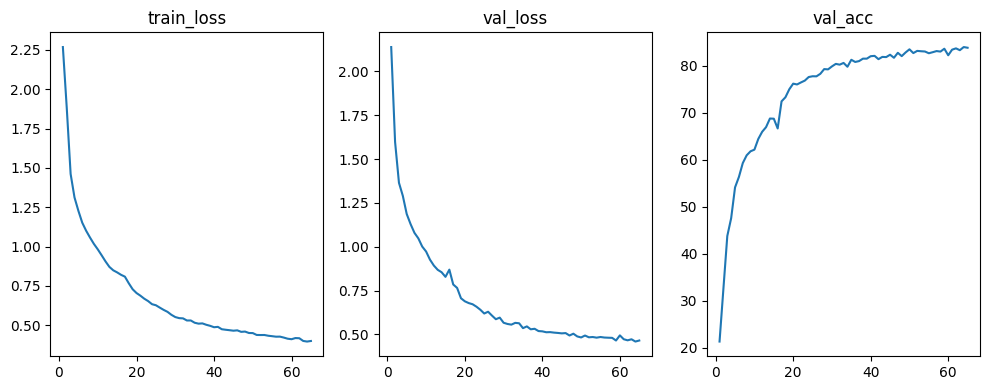

epoch=65/70  train_loss=0.4005  val_loss=0.4650  val_acc=83.78%  lr=0.001000


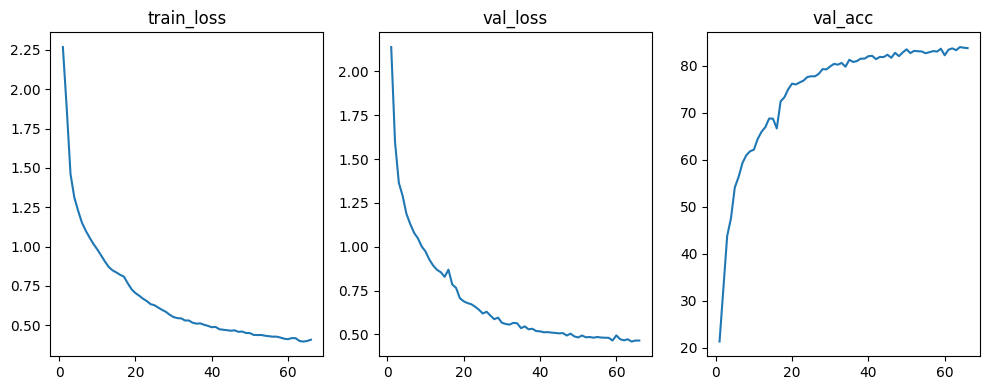

epoch=66/70  train_loss=0.4086  val_loss=0.4647  val_acc=83.70%  lr=0.001000


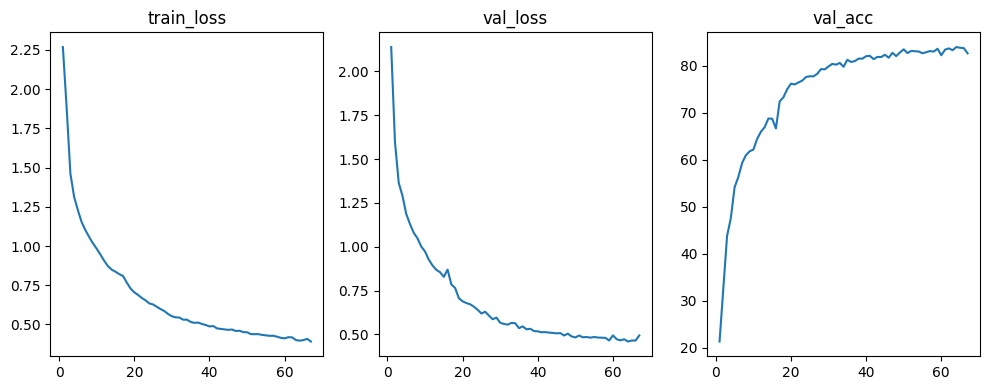

epoch=67/70  train_loss=0.3913  val_loss=0.4939  val_acc=82.59%  lr=0.001000


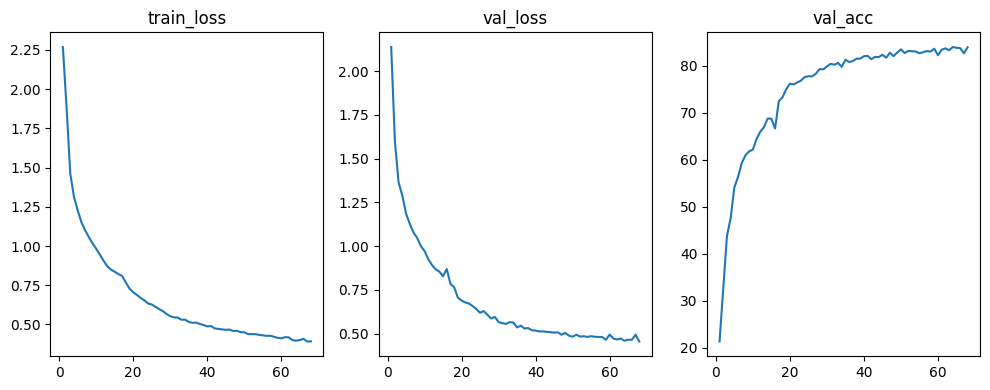

epoch=68/70  train_loss=0.3928  val_loss=0.4546  val_acc=83.87%  lr=0.001000


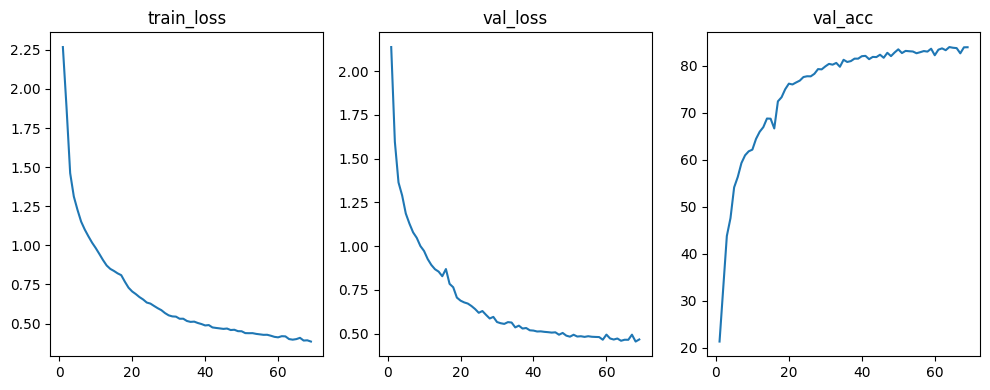

epoch=69/70  train_loss=0.3848  val_loss=0.4665  val_acc=83.89%  lr=0.001000


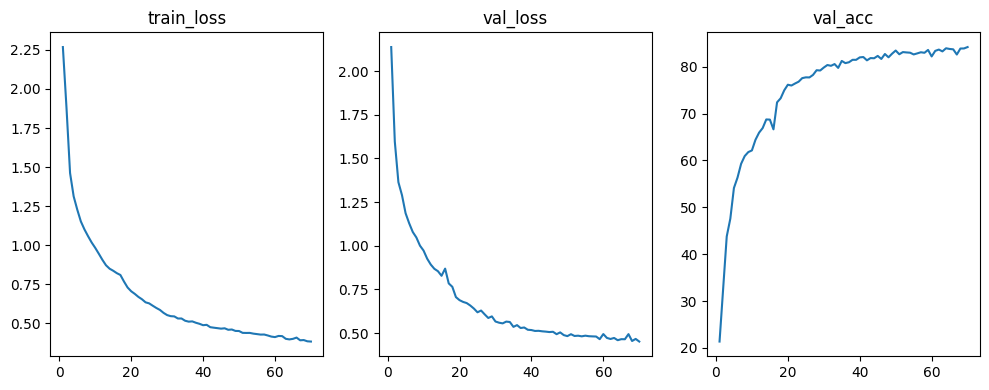

epoch=70/70  train_loss=0.3832  val_loss=0.4514  val_acc=84.19%  lr=0.001000
best_model: C:\Users\Stephen\Code\University\saved_model_eurosat\best_improved_model_eurosat_v3.pkl best_val_acc: 84.18518518518519


In [6]:
best_acc = -1.0
history = {"epoch": [], "train_loss": [], "val_loss": [], "val_acc": [], "lr": []}

for epoch in range(1, EPOCHS+1):
    model.train()
    train_loss_sum = 0.0; n_train = 0
    for xb,yb in train_loader:
        xb,yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        optimizer.zero_grad(set_to_none=True)
        out = model(xb)
        loss = criterion(out,yb)
        loss.backward()
        optimizer.step()
        train_loss_sum += loss.item()*xb.size(0)
        n_train += xb.size(0)

    model.eval()
    val_loss_sum = 0.0; correct = 0; n_val = 0
    with torch.no_grad():
        for xb,yb in val_loader:
            xb,yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
            out = model(xb)
            loss = criterion(out,yb)
            val_loss_sum += loss.item()*xb.size(0)
            pred = out.argmax(dim=1)
            correct += (pred==yb).sum().item()
            n_val += xb.size(0)

    train_loss = train_loss_sum / max(1,n_train)
    val_loss   = val_loss_sum   / max(1,n_val)
    val_acc    = 100.0 * correct / max(1,n_val)
    cur_lr     = optimizer.param_groups[0]['lr']

    history["epoch"].append(epoch); history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss); history["val_acc"].append(val_acc); history["lr"].append(cur_lr)

    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(model.state_dict(), BEST_MODEL_PATH)

    plt.figure(figsize=(10,4))
    plt.subplot(1,3,1); plt.plot(history["epoch"], history["train_loss"]); plt.title("train_loss")
    plt.subplot(1,3,2); plt.plot(history["epoch"], history["val_loss"]);  plt.title("val_loss")
    plt.subplot(1,3,3); plt.plot(history["epoch"], history["val_acc"]);   plt.title("val_acc")
    plt.tight_layout(); plt.show()
    print(f"epoch={epoch}/{EPOCHS}  train_loss={train_loss:.4f}  val_loss={val_loss:.4f}  val_acc={val_acc:.2f}%  lr={cur_lr:.6f}")

print("best_model:", BEST_MODEL_PATH, "best_val_acc:", best_acc)

C:\Users\Stephen\AppData\Local\Temp\ipykernel_19872\783618653.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(BEST_MODEL_PATH, map_locat

Final Test Accuracy: 84.19%
Precision: 0.8354
Recall: 0.8353
F1-Score: 0.8346


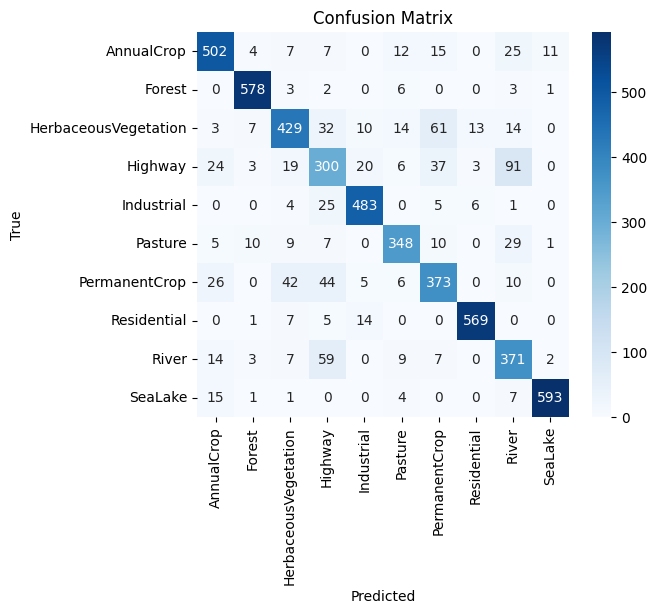

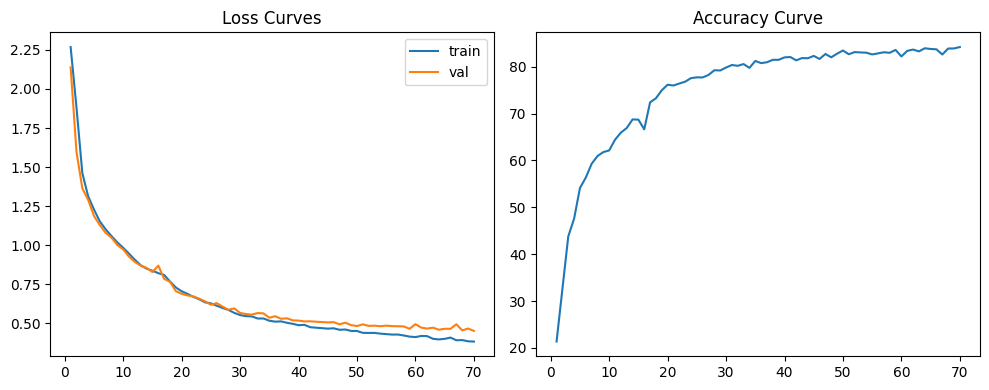

In [7]:
model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=device))
model.eval()
all_preds, all_labels = [], []
val_loss_sum = 0.0; n_val = 0
with torch.no_grad():
    for xb,yb in val_loader:
        xb,yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        out = model(xb)
        val_loss_sum += criterion(out,yb).item()*xb.size(0)
        pred = out.argmax(1)
        all_preds.extend(pred.detach().cpu().numpy().tolist())
        all_labels.extend(yb.detach().cpu().numpy().tolist())
        n_val += xb.size(0)

final_acc = 100.0 * (np.sum(np.array(all_preds)==np.array(all_labels)) / max(1,n_val))
prec = precision_score(all_labels, all_preds, average='macro', zero_division=0)
rec  = recall_score(all_labels, all_preds, average='macro', zero_division=0)
f1   = f1_score(all_labels, all_preds, average='macro', zero_division=0)
cm   = confusion_matrix(all_labels, all_preds)

print(f"Final Test Accuracy: {final_acc:.2f}%")
print(f"Precision: {prec:.4f}")
print(f"Recall: {rec:.4f}")
print(f"F1-Score: {f1:.4f}")

import seaborn as sns
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=full_dataset.classes, yticklabels=full_dataset.classes)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Confusion Matrix"); plt.show()

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.plot(history["epoch"], history["train_loss"], label="train"); plt.plot(history["epoch"], history["val_loss"], label="val"); plt.legend(); plt.title("Loss Curves")
plt.subplot(1,2,2); plt.plot(history["epoch"], history["val_acc"]); plt.title("Accuracy Curve")
plt.tight_layout(); plt.show()

#### Live Run

In [1]:
import os, random, numpy as np, torch, cv2
from PIL import Image
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split
from torch import nn
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns

SEED=13
np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
os.environ["OMP_NUM_THREADS"]="1"; os.environ["MKL_NUM_THREADS"]="1"; cv2.setNumThreads(0); torch.set_num_threads(1)
device=torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATA_ROOT= "../Dataset/EuroSAT"
SAVE_DIR=  "./saved_model_eurosat"
WEIGHT_NAME = "best_improved_model_eurosat_v3.pkl"
IMAGE_SIZE = 64
BATCH_SIZE = 500
N_SHOW = 6

class LaplacianSharpenCLAHE:
    def __init__(self, alpha=0.25, clip_limit=2.0, tile_grid_size=(8,8)):
        self.alpha=float(alpha); self.clip_limit=float(clip_limit); self.tile_grid_size=tile_grid_size
    def __call__(self, img_pil: Image.Image) -> Image.Image:
        img = np.array(img_pil)
        lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        l,a,b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
        l_eq = clahe.apply(l)
        lab_eq = cv2.merge([l_eq,a,b])
        img_eq = cv2.cvtColor(lab_eq, cv2.COLOR_LAB2RGB)
        lap = cv2.Laplacian(img_eq, ddepth=cv2.CV_16S, ksize=3)
        lap = cv2.convertScaleAbs(lap)
        sharp = cv2.addWeighted(img_eq, 1.0, lap, self.alpha, 0)
        return Image.fromarray(sharp)

def build_train_tf(sz=64):
    return transforms.Compose([
        transforms.Resize((sz,sz)),
        LaplacianSharpenCLAHE(alpha=0.25, clip_limit=2.0, tile_grid_size=(8,8)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=10),
        transforms.RandomResizedCrop(sz, scale=(0.95,1.0), ratio=(0.95,1.05)),
        transforms.ToTensor(),
    ])

def build_val_tf(sz=64):
    return transforms.Compose([
        transforms.Resize((sz,sz)),
        LaplacianSharpenCLAHE(alpha=0.25, clip_limit=2.0, tile_grid_size=(8,8)),
        transforms.ToTensor(),
    ])

full_dataset = datasets.ImageFolder(DATA_ROOT)
TOTAL = len(full_dataset)
train_len = int(0.8*TOTAL); val_len = TOTAL-train_len
g = torch.Generator().manual_seed(SEED)
train_subset, val_subset = random_split(full_dataset, [train_len, val_len], generator=g)

train_subset.dataset.transform = build_train_tf(IMAGE_SIZE)
val_subset.dataset.transform   = build_val_tf(IMAGE_SIZE)

tmp_loader = DataLoader(train_subset, batch_size=256, shuffle=False, num_workers=0, pin_memory=True)
def compute_stats(loader):
    n=0; mean=torch.zeros(3,dtype=torch.double); M2=torch.zeros(3,dtype=torch.double)
    for x,_ in loader:
        x=x.double()
        b,c,h,w=x.shape; p=b*h*w; n+=p
        m=x.mean(dim=[0,2,3]); d=m-mean; mean+=d*(p/n)
        var=((x-m[None,:,None,None])**2).sum(dim=[0,2,3])/p
        M2+=var*p
    std=torch.sqrt(M2/max(1,n))
    return mean.float(), std.float()
train_mean, train_std = compute_stats(tmp_loader)
norm_tf = transforms.Normalize(mean=train_mean.tolist(), std=train_std.tolist())

train_subset.dataset.transform = transforms.Compose([build_train_tf(IMAGE_SIZE), norm_tf])
val_subset.dataset.transform   = transforms.Compose([build_val_tf(IMAGE_SIZE),   norm_tf])

class DWConv(nn.Module):
    def __init__(self, cin, cout, k=3, s=1, p=0):
        super().__init__()
        self.dw = nn.Conv2d(cin, cin, k, s, p, groups=cin, bias=False)
        self.pw = nn.Conv2d(cin, cout, 1, 1, 0, bias=False)
        self.act = nn.ReLU(inplace=True)
    def forward(self,x):
        x=self.dw(x); x=self.pw(x); x=self.act(x); return x

class SE(nn.Module):
    def __init__(self, c, r=8):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(nn.Linear(c, c//r), nn.ReLU(inplace=True), nn.Linear(c//r, c), nn.Sigmoid())
    def forward(self,x):
        b,c,_,_=x.shape
        w=self.pool(x).view(b,c)
        w=self.fc(w).view(b,c,1,1)
        return x*w

class LitePlusBiGRU(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.b1 = nn.Sequential(DWConv(3,16,k=3,s=1,p=0), nn.MaxPool2d(2))
        self.b2 = nn.Sequential(DWConv(16,32,k=3,s=1,p=0), nn.MaxPool2d(2))
        self.b3 = nn.Sequential(DWConv(32,32,k=3,s=1,p=0))
        self.se = SE(32, r=8)
        self.flat = nn.Flatten()
        self.T = 32
        self.gru = nn.GRU(input_size=144, hidden_size=48, num_layers=1, batch_first=True, bidirectional=True)
        self.head = nn.Sequential(nn.Linear(96,64), nn.ReLU(inplace=True), nn.Linear(64,num_classes))
    def forward(self,x):
        x=self.b1(x); x=self.b2(x); x=self.b3(x); x=self.se(x)
        x=self.flat(x)
        x=x.view(x.size(0), self.T, 4608//self.T)
        y,_=self.gru(x)
        h=y[:,-1,:]
        z=self.head(h)
        return z

num_classes = len(full_dataset.classes)
model = LitePlusBiGRU(num_classes=num_classes).to(device)
state = torch.load(os.path.join(SAVE_DIR, WEIGHT_NAME), map_location=device)
model.load_state_dict(state, strict=True)
model.eval()


C:\Users\Stephen\AppData\Local\Temp\ipykernel_23348\1790860680.py:123: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(os.path.join(SAVE_DIR, WEIGHT_NAME), 

LitePlusBiGRU(
  (b1): Sequential(
    (0): DWConv(
      (dw): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1), groups=3, bias=False)
      (pw): Conv2d(3, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (act): ReLU(inplace=True)
    )
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (b2): Sequential(
    (0): DWConv(
      (dw): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), groups=16, bias=False)
      (pw): Conv2d(16, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (act): ReLU(inplace=True)
    )
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (b3): Sequential(
    (0): DWConv(
      (dw): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), groups=32, bias=False)
      (pw): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (act): ReLU(inplace=True)
    )
  )
  (se): SE(
    (pool): AdaptiveAvgPool2d(output_size=1)
    (fc): Sequential(
      (0): Linear(in_feature

Subset Accuracy: 100.00%
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000


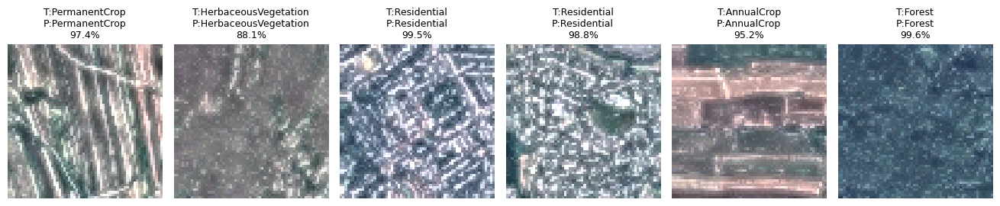

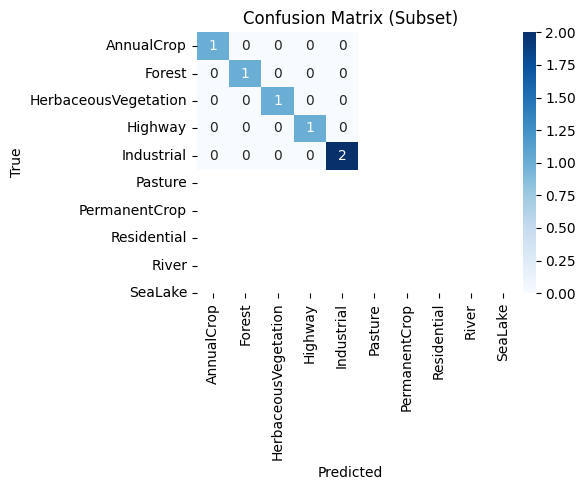

In [3]:
idx = random.sample(val_subset.indices, k=min(N_SHOW, len(val_subset)))
imgs = [(Image.open(full_dataset.samples[i][0]).convert("RGB"), full_dataset.samples[i][1]) for i in idx]
xf = transforms.Compose([build_val_tf(IMAGE_SIZE), norm_tf])
xb = torch.stack([xf(img) for img,_ in imgs]).to(device)
yb = torch.tensor([y for _,y in imgs], device=device)

with torch.no_grad():
    logits = model(xb)
    probs = torch.softmax(logits, dim=1)
    pred = probs.argmax(1)

acc = 100.0*(pred==yb).float().mean().item()
prec = precision_score(yb.cpu().numpy(), pred.cpu().numpy(), average='macro', zero_division=0)
rec  = recall_score(yb.cpu().numpy(), pred.cpu().numpy(), average='macro', zero_division=0)
f1   = f1_score(yb.cpu().numpy(), pred.cpu().numpy(), average='macro', zero_division=0)
cm   = confusion_matrix(yb.cpu().numpy(), pred.cpu().numpy())
classes = full_dataset.classes

print(f"Subset Accuracy: {acc:.2f}%")
print(f"Precision: {prec:.4f}")
print(f"Recall: {rec:.4f}")
print(f"F1-Score: {f1:.4f}")

plt.figure(figsize=(N_SHOW*2.2, 3))
for i,(img,y) in enumerate(imgs):
    x = xb[i].detach().cpu()
    x = x*train_std.view(3,1,1) + train_mean.view(3,1,1)
    x = x.clamp(0,1).permute(1,2,0).numpy()
    p = int(pred[i].item()); conf = float(probs[i,p].item())
    ax = plt.subplot(1, N_SHOW, i+1); ax.imshow(x); ax.set_title(f"T:{classes[y]}\nP:{classes[p]}\n{conf*100:.1f}%", fontsize=9); ax.axis("off")
plt.tight_layout(); plt.show()

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Confusion Matrix (Subset)"); plt.tight_layout(); plt.show()

### Type-3 ()

In [1]:
import os, json, random, time, numpy as np, cv2
from PIL import Image
import torch
from torch import nn
import torch.backends.cudnn as cudnn
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
SEED = 13
DATA_ROOT = r"C:\Users\Stephen\Code\University"
EUROSAT_DIR = DATA_ROOT + r"\EuroSAT"
SAVE_DIR = DATA_ROOT + r"\saved_model_eurosat"
BEST_MODEL_PATH = SAVE_DIR + r"\best_improved_model_eurosat_v4.pkl"

BATCH_SIZE = 500
IMAGE_SIZE = 64
EPOCHS = 70
BASE_LR = 1e-3

LABEL_SMOOTH = 0.05
DROPOUT_P = 0.1
EMA_DECAY = 0.999
TTA_HFLIP = True
TTA_VFLIP = False

os.makedirs(SAVE_DIR, exist_ok=True)
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
cudnn.deterministic = True; cudnn.benchmark = False
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
os.environ["OMP_NUM_THREADS"] = "1"; os.environ["MKL_NUM_THREADS"] = "1"; cv2.setNumThreads(0); torch.set_num_threads(1)
print("device:", device)


device: cuda


In [3]:
class DWConv(nn.Module):
    def __init__(self, cin, cout, k=3, s=1, p=0):
        super().__init__()
        self.dw = nn.Conv2d(cin, cin, k, s, p, groups=cin, bias=False)
        self.pw = nn.Conv2d(cin, cout, 1, 1, 0, bias=False)
        self.act = nn.ReLU(inplace=True)
    def forward(self,x):
        x=self.dw(x); x=self.pw(x); x=self.act(x); return x

class SE(nn.Module):
    def __init__(self, c, r=8):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(nn.Linear(c, c//r), nn.ReLU(inplace=True), nn.Linear(c//r, c), nn.Sigmoid())
    def forward(self,x):
        b,c,_,_=x.shape
        w=self.pool(x).view(b,c)
        w=self.fc(w).view(b,c,1,1)
        return x*w

class LitePlusBiGRU_F2(nn.Module):
    def __init__(self, num_classes, drop_p=0.1):
        super().__init__()
        self.b1 = nn.Sequential(DWConv(3,16,k=3,s=1,p=0), nn.MaxPool2d(2))
        self.b2 = nn.Sequential(DWConv(16,32,k=3,s=1,p=0), nn.MaxPool2d(2))
        self.b3 = nn.Sequential(DWConv(32,32,k=3,s=1,p=0))
        self.se = SE(32, r=8)
        self.flat = nn.Flatten()
        self.T = 32
        self.gru = nn.GRU(input_size=144, hidden_size=48, num_layers=1, batch_first=True, bidirectional=True)
        self.norm = nn.LayerNorm(96)
        self.drop = nn.Dropout(drop_p)
        self.head = nn.Sequential(nn.Linear(96,64), nn.ReLU(inplace=True), nn.Linear(64,num_classes))
    def forward(self,x):
        x=self.b1(x); x=self.b2(x); x=self.b3(x); x=self.se(x)
        x=self.flat(x)
        x=x.view(x.size(0), self.T, 4608//self.T)
        y,_=self.gru(x)
        h=y[:,-1,:]
        h=self.norm(h)
        h=self.drop(h)
        z=self.head(h)
        return z

def build_model(num_classes, drop_p):
    m = LitePlusBiGRU_F2(num_classes, drop_p)
    return m

def get_num_classes():
    if 'full_dataset' in globals():
        return len(full_dataset.classes)
    path = EUROSAT_DIR
    ds = datasets.ImageFolder(path)
    return len(ds.classes)

num_classes = get_num_classes()
model = build_model(num_classes, DROPOUT_P).to(device)
criterion = nn.CrossEntropyLoss(label_smoothing=LABEL_SMOOTH)
optimizer = torch.optim.Adam(model.parameters(), lr=BASE_LR)
print("params(M):", sum(p.numel() for p in model.parameters())/1e6)


params(M): 0.065257


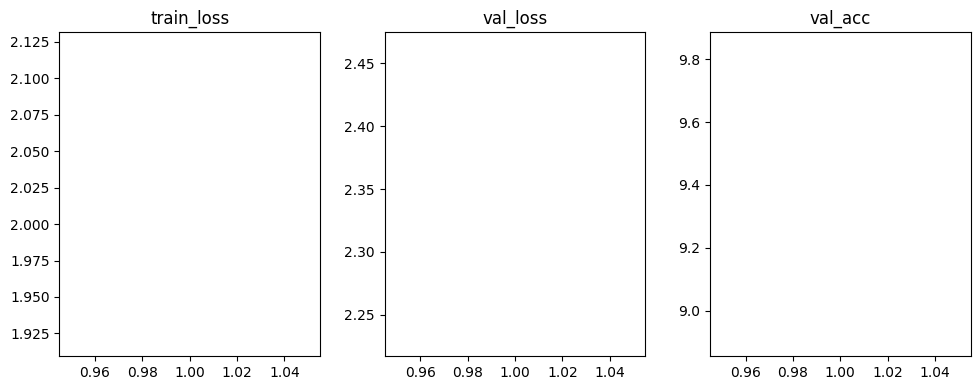

epoch=1/70  train_loss=2.0204  val_loss=2.3458  val_acc=9.37%


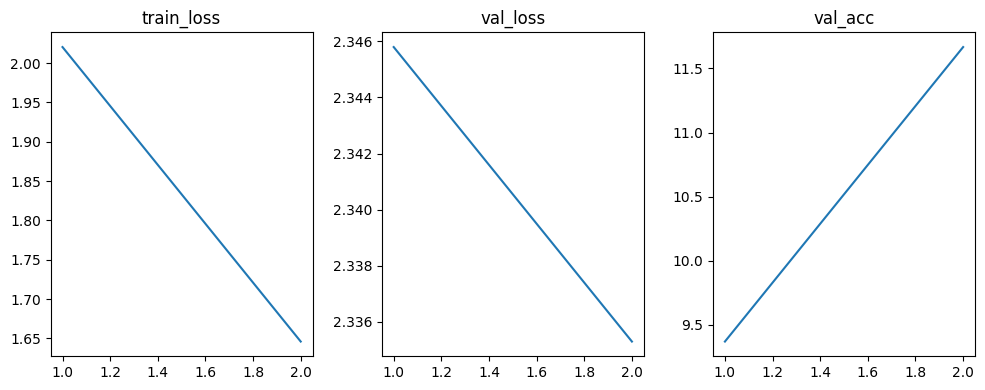

epoch=2/70  train_loss=1.6460  val_loss=2.3353  val_acc=11.67%


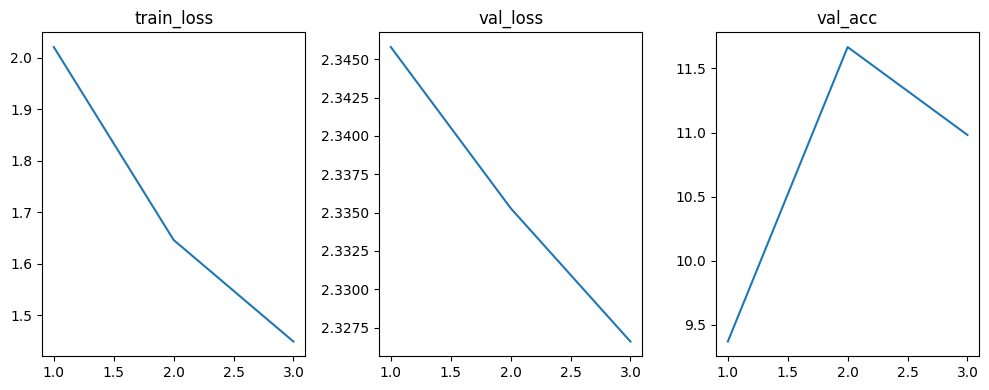

epoch=3/70  train_loss=1.4488  val_loss=2.3266  val_acc=10.98%


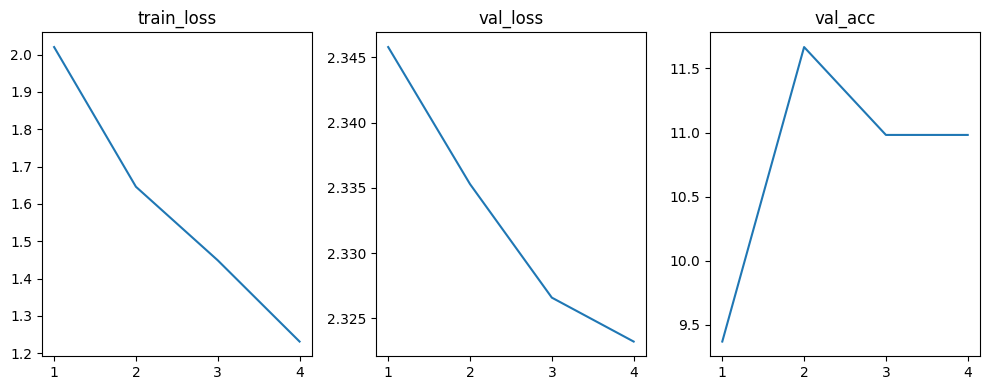

epoch=4/70  train_loss=1.2310  val_loss=2.3232  val_acc=10.98%


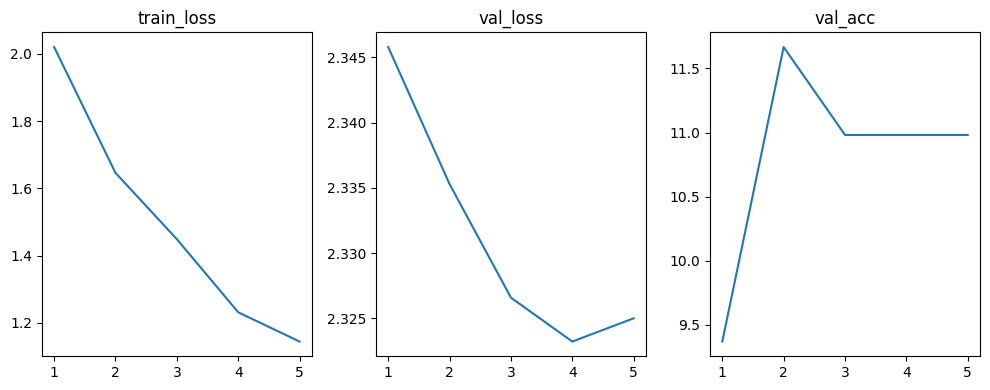

epoch=5/70  train_loss=1.1440  val_loss=2.3250  val_acc=10.98%


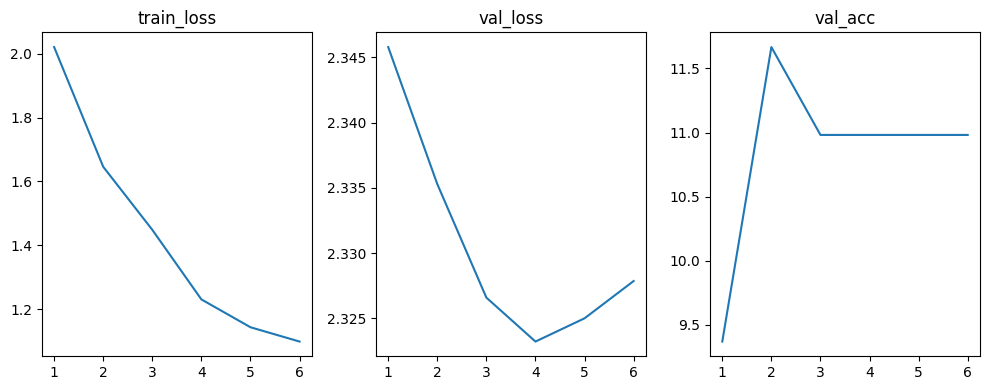

epoch=6/70  train_loss=1.0992  val_loss=2.3279  val_acc=10.98%


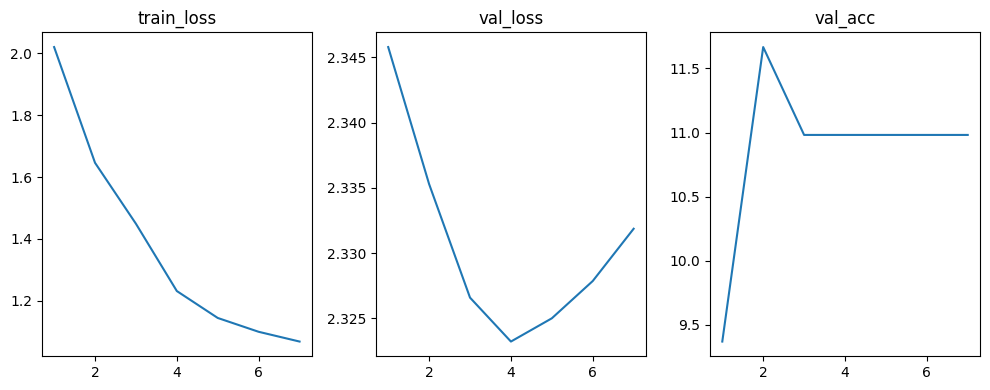

epoch=7/70  train_loss=1.0677  val_loss=2.3319  val_acc=10.98%


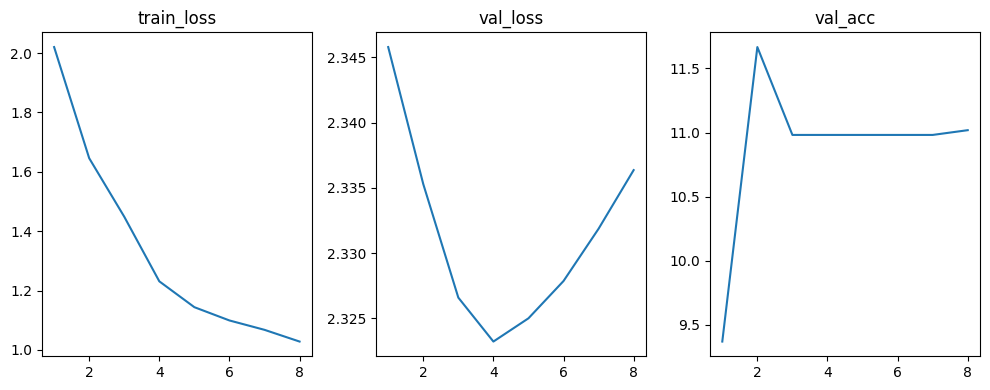

epoch=8/70  train_loss=1.0281  val_loss=2.3364  val_acc=11.02%


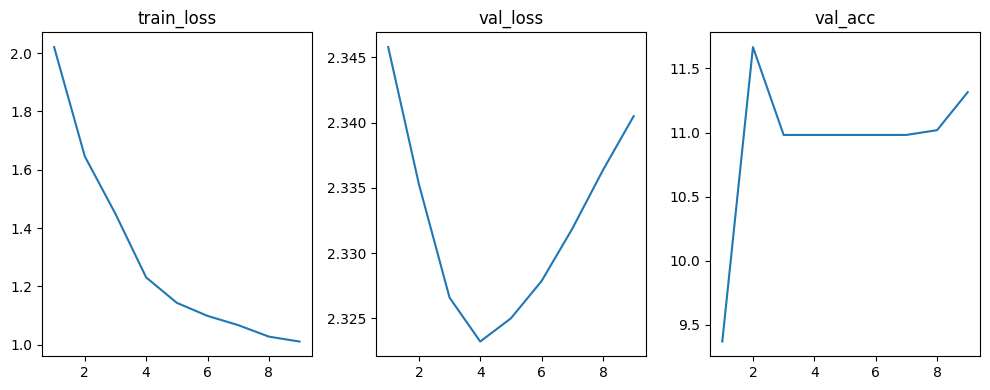

epoch=9/70  train_loss=1.0113  val_loss=2.3405  val_acc=11.31%


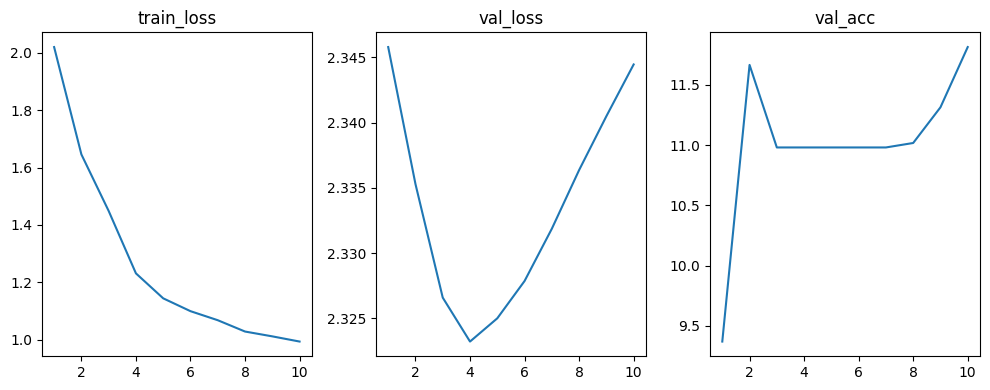

epoch=10/70  train_loss=0.9932  val_loss=2.3445  val_acc=11.81%


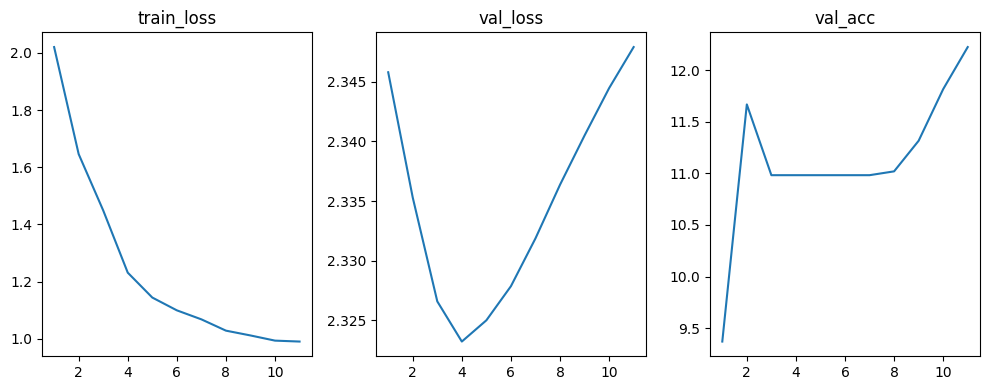

epoch=11/70  train_loss=0.9900  val_loss=2.3479  val_acc=12.22%


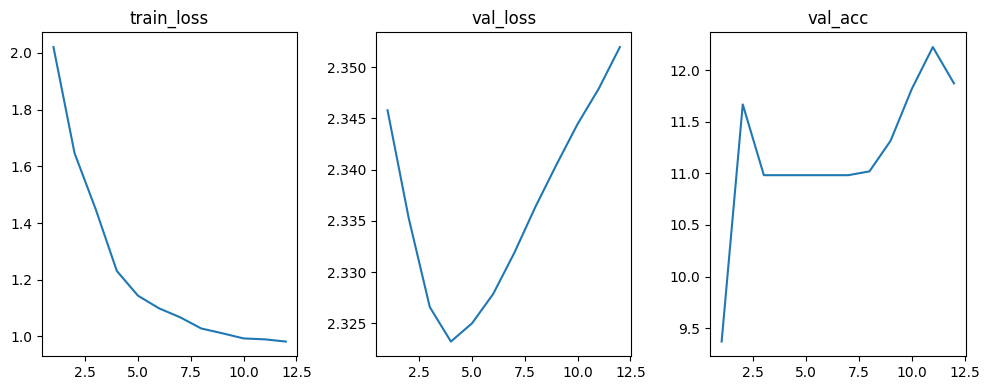

epoch=12/70  train_loss=0.9822  val_loss=2.3520  val_acc=11.87%


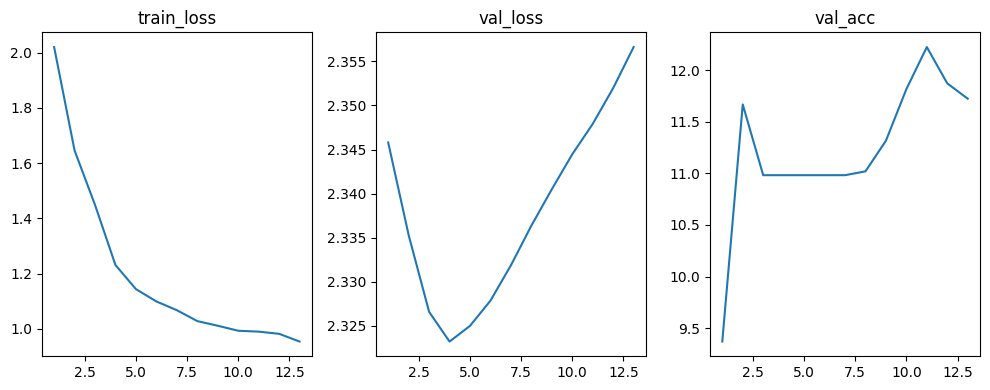

epoch=13/70  train_loss=0.9541  val_loss=2.3566  val_acc=11.72%


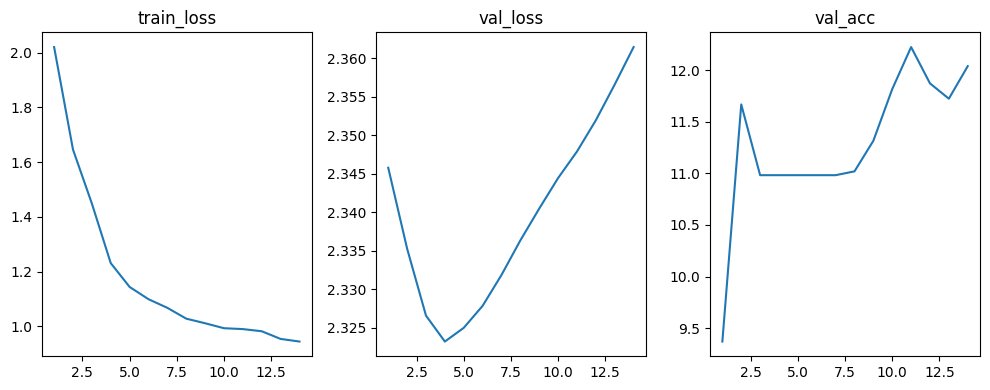

epoch=14/70  train_loss=0.9445  val_loss=2.3615  val_acc=12.04%


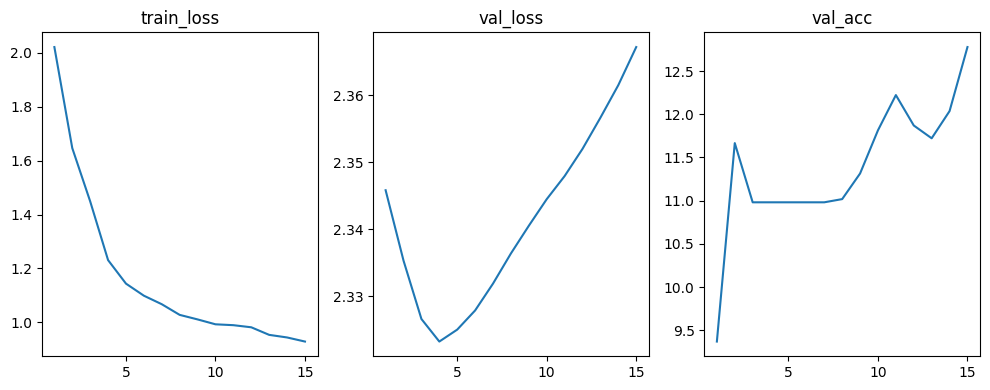

epoch=15/70  train_loss=0.9293  val_loss=2.3672  val_acc=12.78%


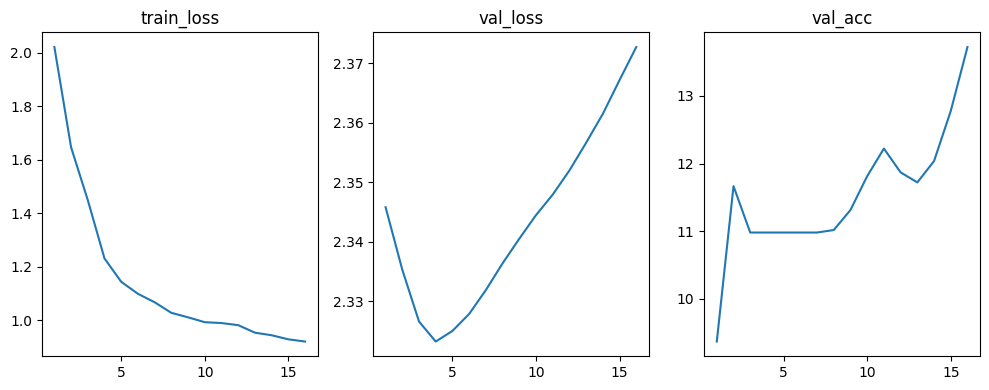

epoch=16/70  train_loss=0.9209  val_loss=2.3727  val_acc=13.72%


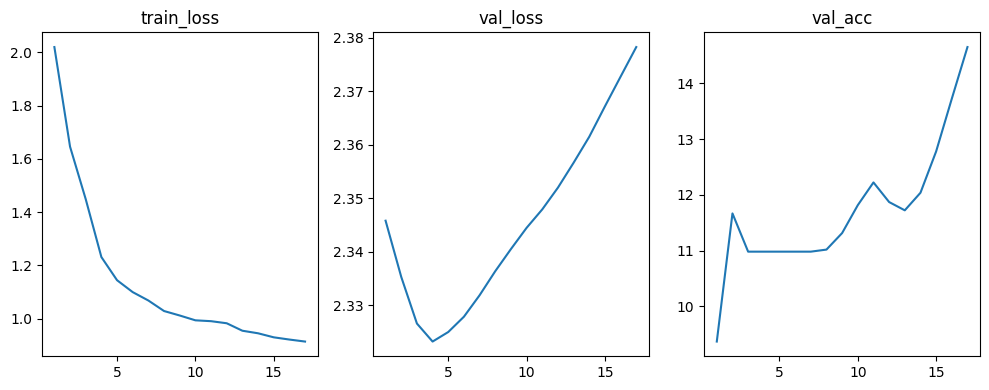

epoch=17/70  train_loss=0.9134  val_loss=2.3782  val_acc=14.65%


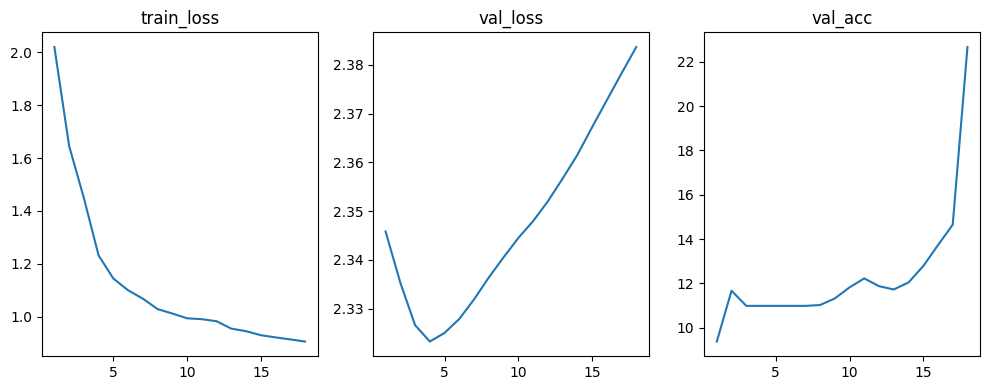

epoch=18/70  train_loss=0.9052  val_loss=2.3836  val_acc=22.67%


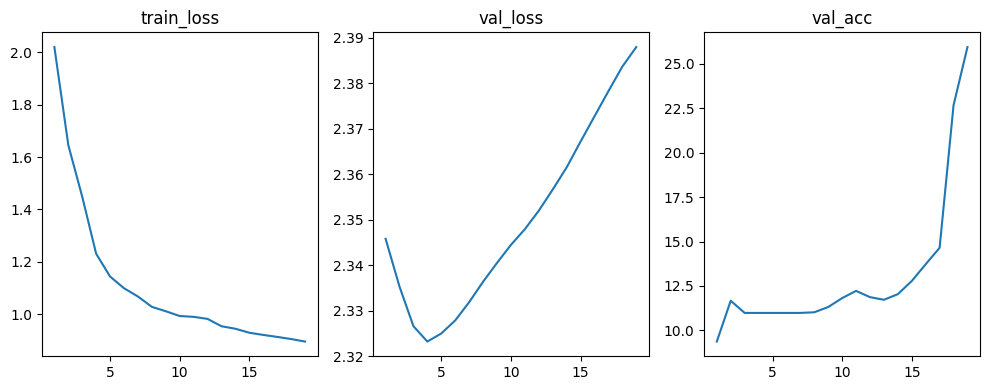

epoch=19/70  train_loss=0.8956  val_loss=2.3879  val_acc=25.94%


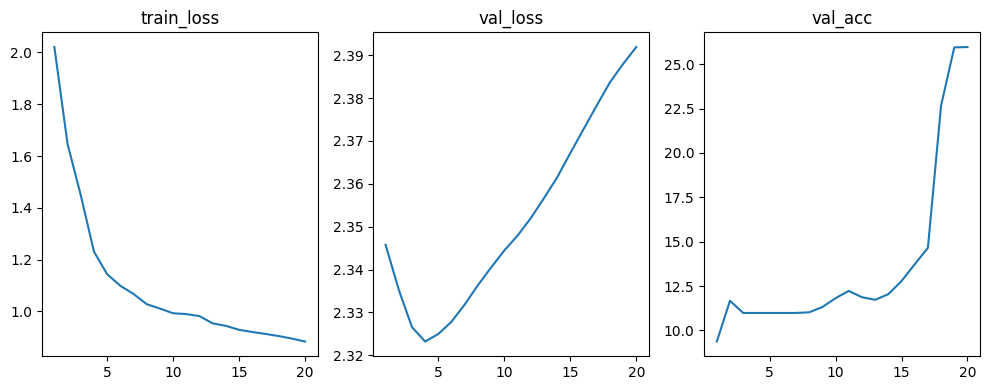

epoch=20/70  train_loss=0.8840  val_loss=2.3919  val_acc=25.96%


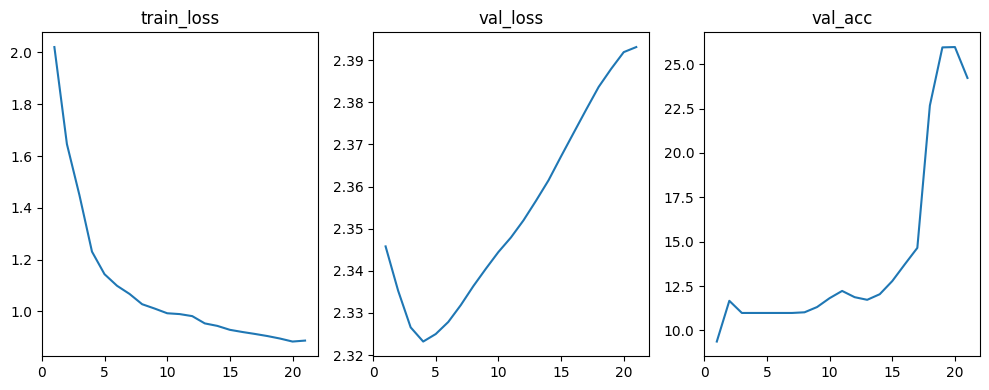

epoch=21/70  train_loss=0.8877  val_loss=2.3931  val_acc=24.22%


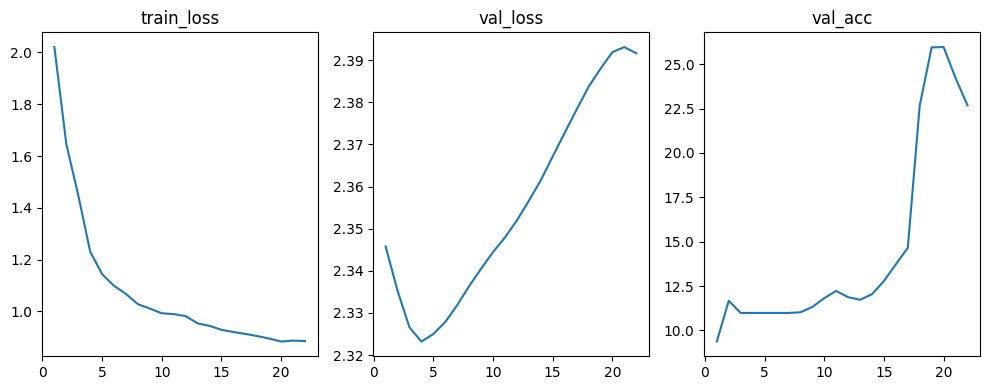

epoch=22/70  train_loss=0.8861  val_loss=2.3916  val_acc=22.69%


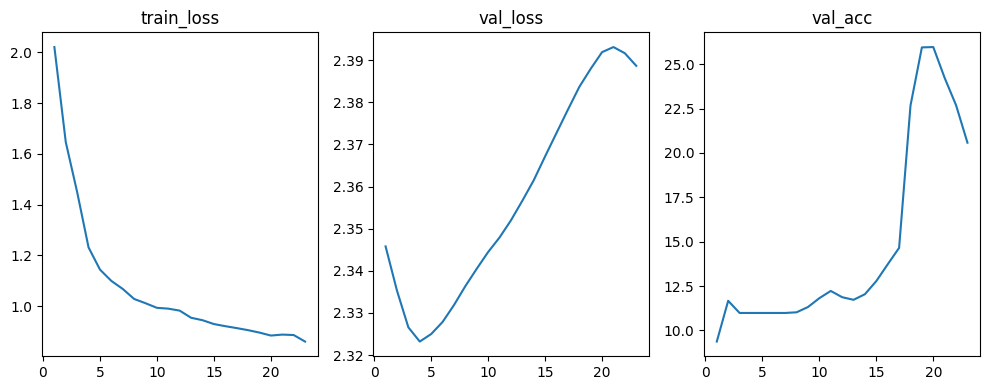

epoch=23/70  train_loss=0.8604  val_loss=2.3886  val_acc=20.57%


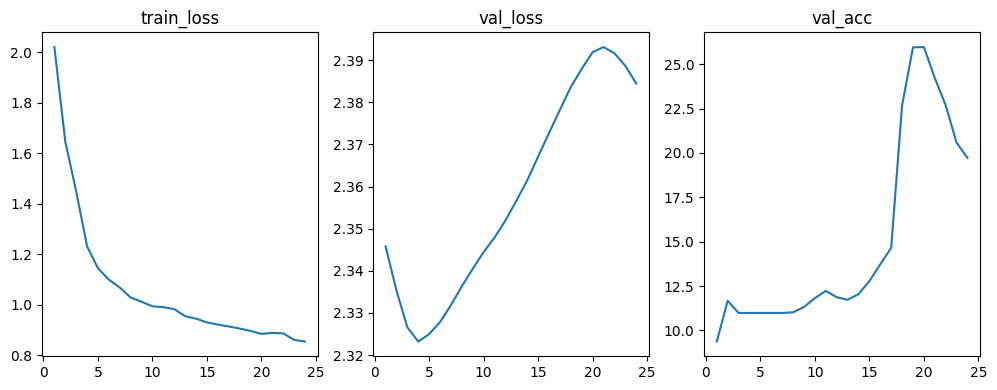

epoch=24/70  train_loss=0.8537  val_loss=2.3845  val_acc=19.72%


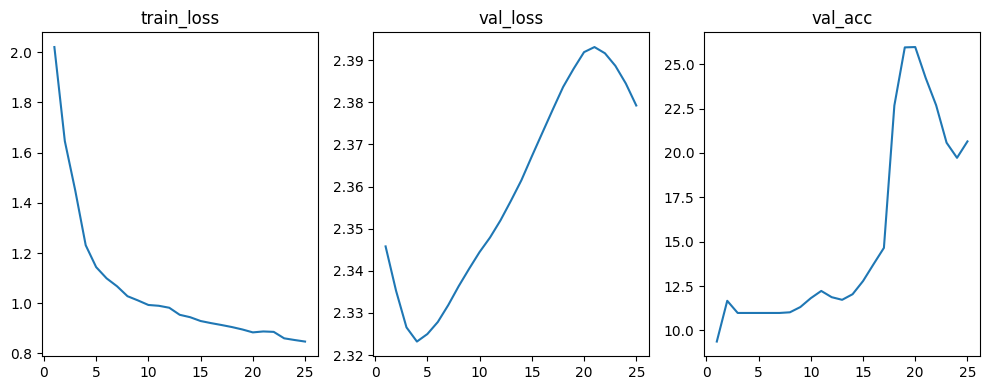

epoch=25/70  train_loss=0.8475  val_loss=2.3792  val_acc=20.65%


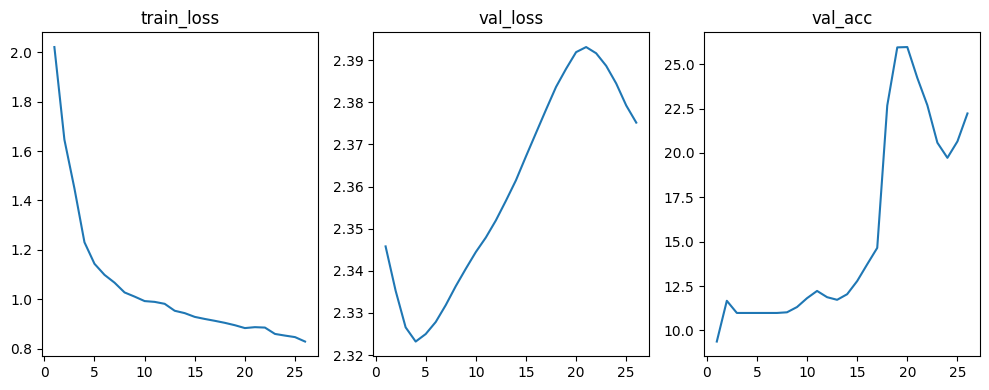

epoch=26/70  train_loss=0.8296  val_loss=2.3752  val_acc=22.22%


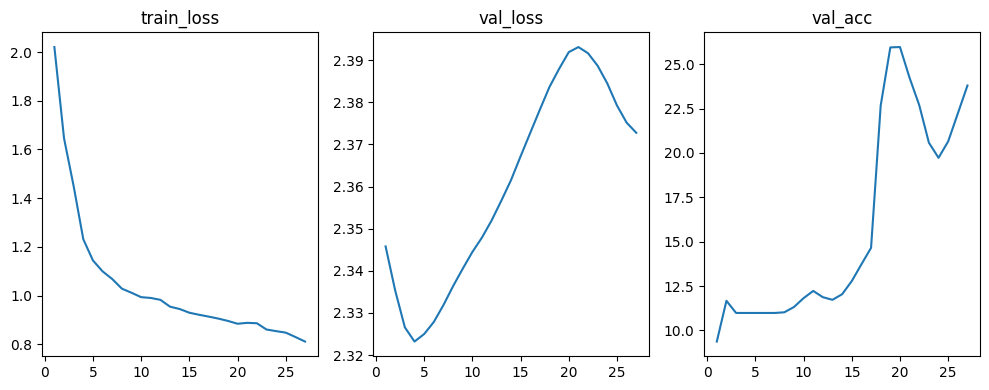

epoch=27/70  train_loss=0.8109  val_loss=2.3728  val_acc=23.80%


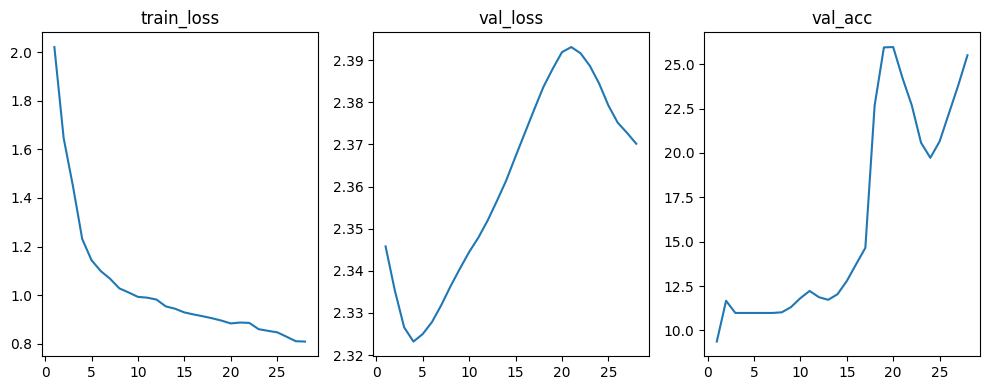

epoch=28/70  train_loss=0.8095  val_loss=2.3702  val_acc=25.50%


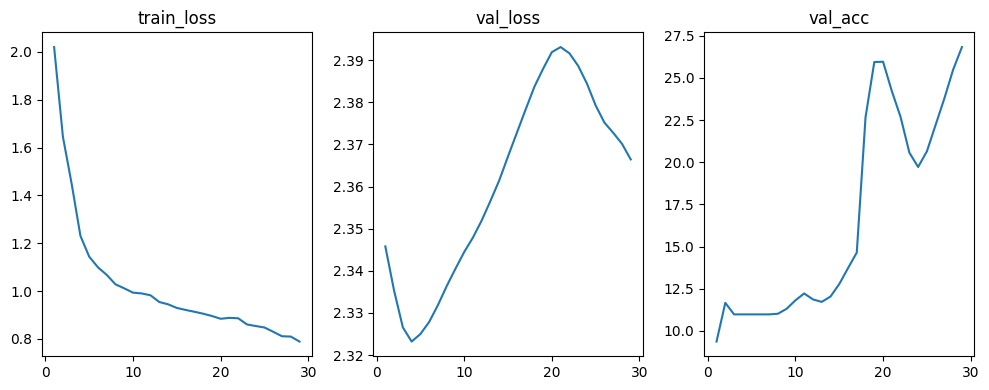

epoch=29/70  train_loss=0.7887  val_loss=2.3664  val_acc=26.83%


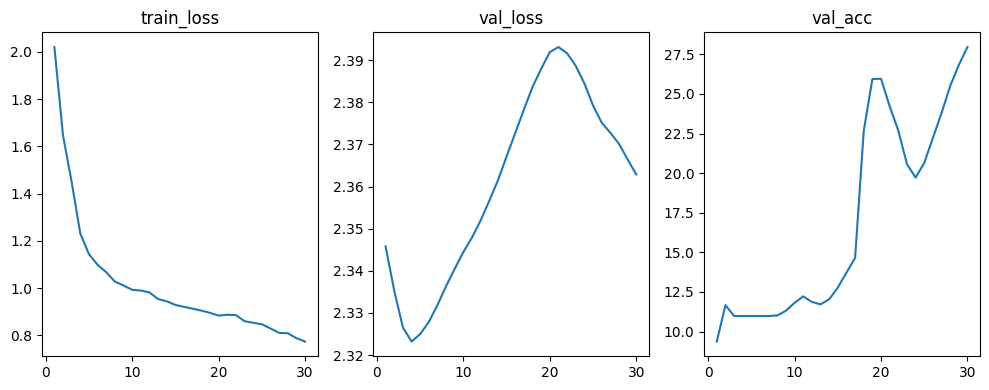

epoch=30/70  train_loss=0.7742  val_loss=2.3629  val_acc=27.96%


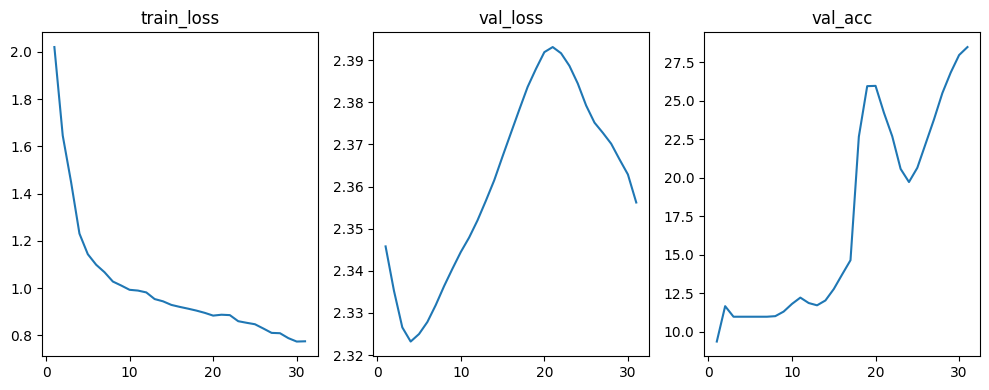

epoch=31/70  train_loss=0.7753  val_loss=2.3562  val_acc=28.48%


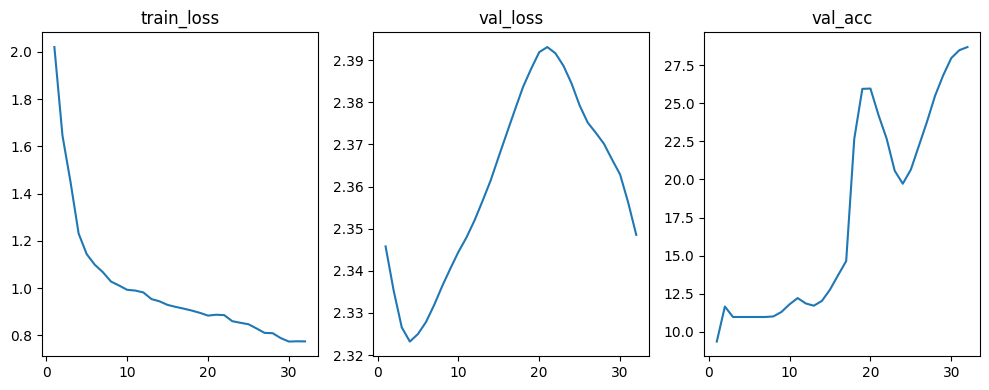

epoch=32/70  train_loss=0.7749  val_loss=2.3485  val_acc=28.69%


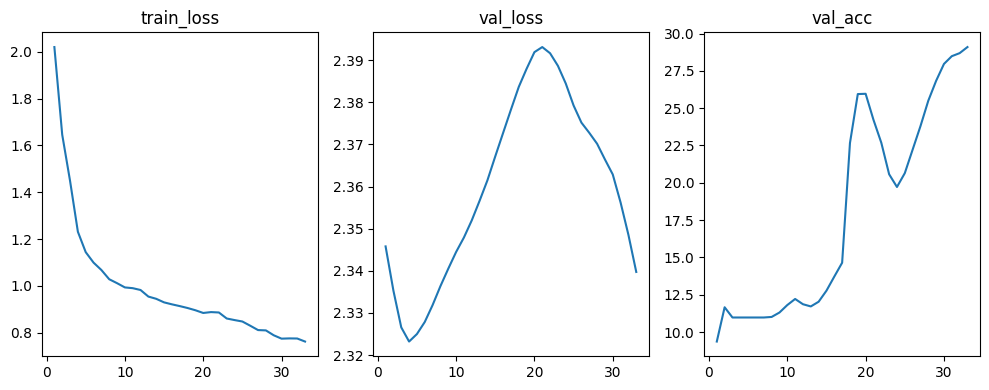

epoch=33/70  train_loss=0.7619  val_loss=2.3397  val_acc=29.09%


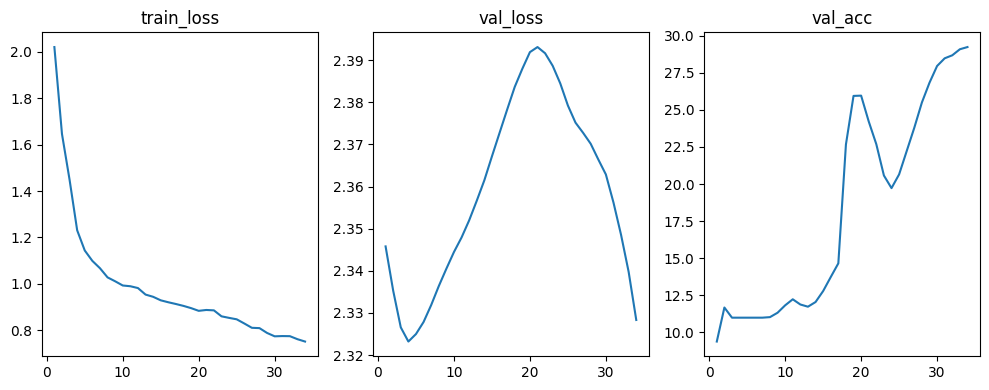

epoch=34/70  train_loss=0.7517  val_loss=2.3283  val_acc=29.24%


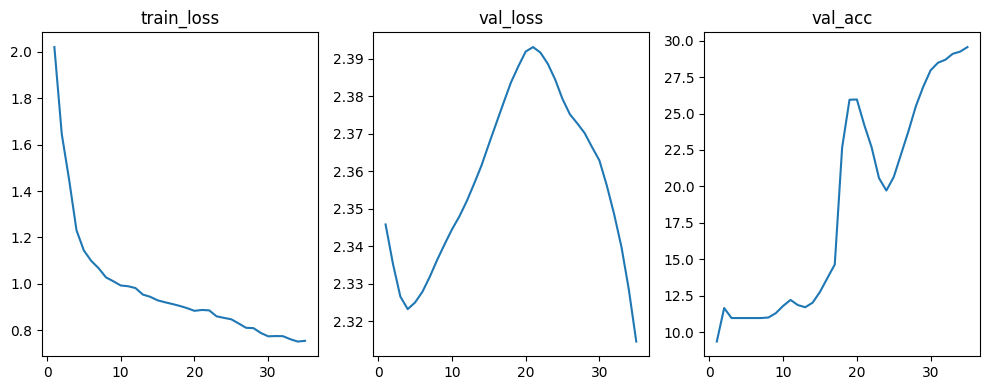

epoch=35/70  train_loss=0.7548  val_loss=2.3146  val_acc=29.56%


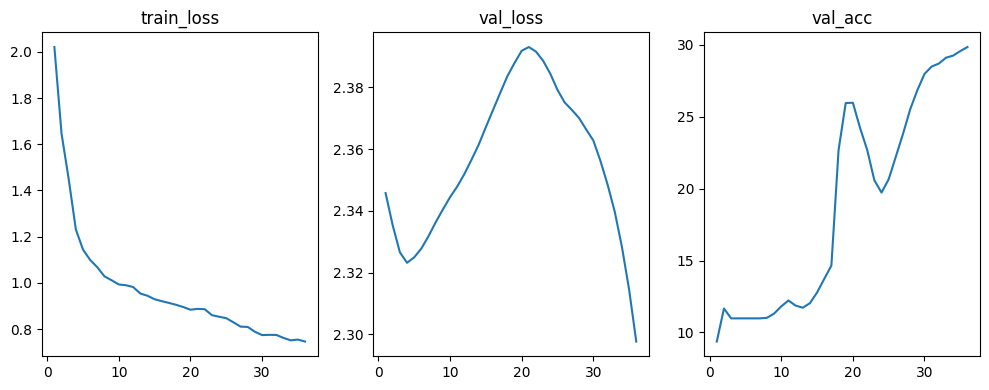

epoch=36/70  train_loss=0.7463  val_loss=2.2977  val_acc=29.83%


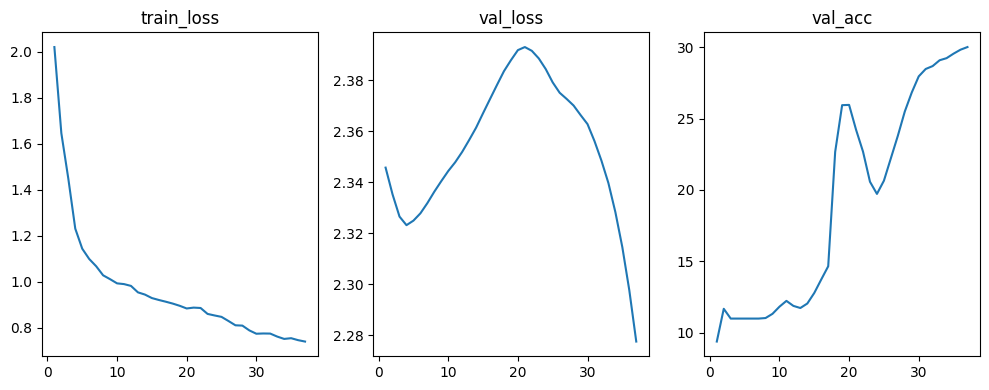

epoch=37/70  train_loss=0.7402  val_loss=2.2776  val_acc=30.02%


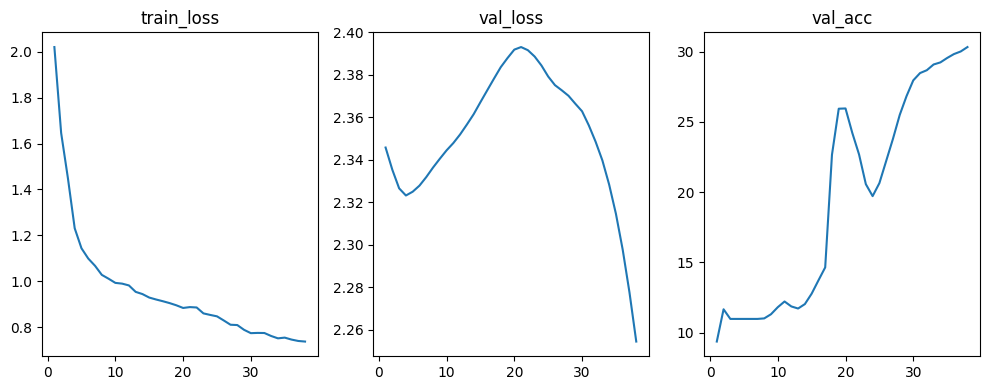

epoch=38/70  train_loss=0.7377  val_loss=2.2545  val_acc=30.33%


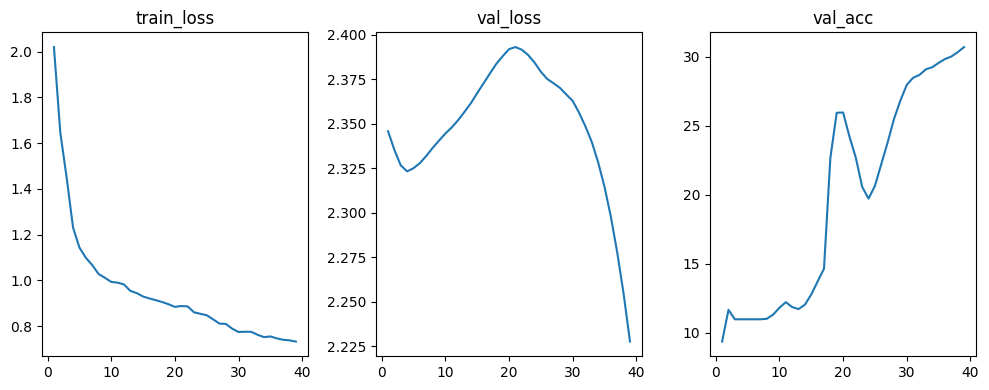

epoch=39/70  train_loss=0.7324  val_loss=2.2276  val_acc=30.70%


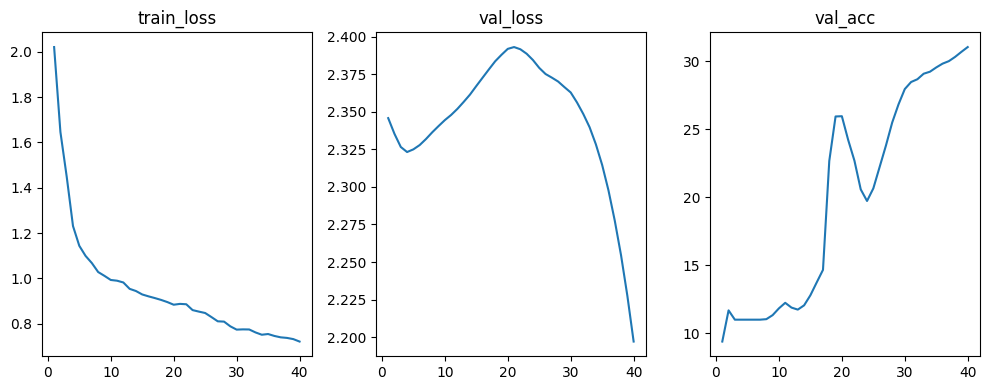

epoch=40/70  train_loss=0.7216  val_loss=2.1971  val_acc=31.06%


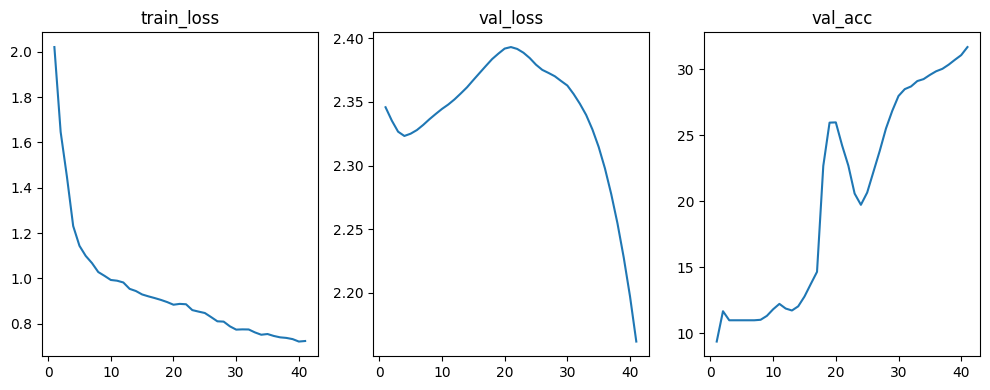

epoch=41/70  train_loss=0.7240  val_loss=2.1616  val_acc=31.67%


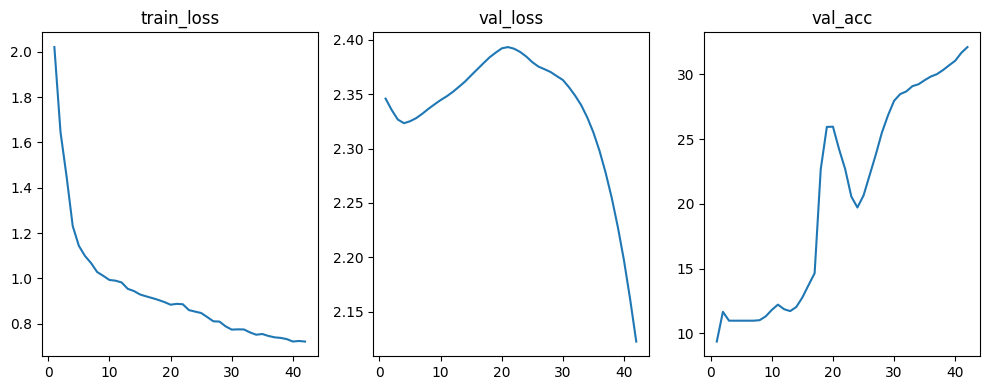

epoch=42/70  train_loss=0.7215  val_loss=2.1228  val_acc=32.11%


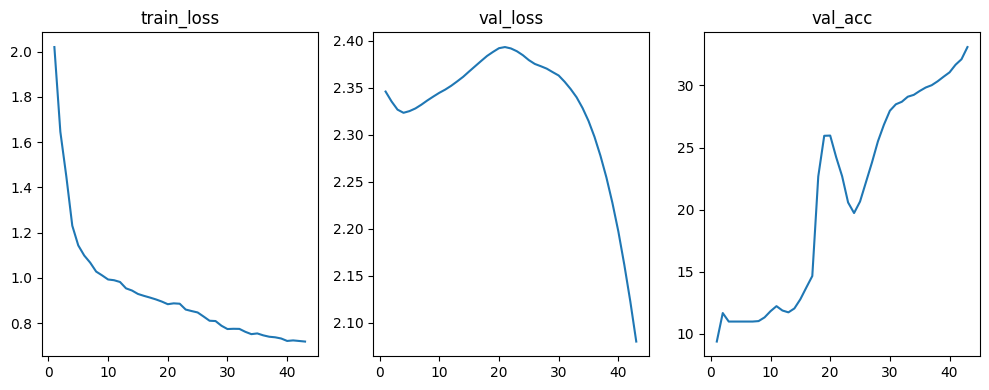

epoch=43/70  train_loss=0.7189  val_loss=2.0801  val_acc=33.09%


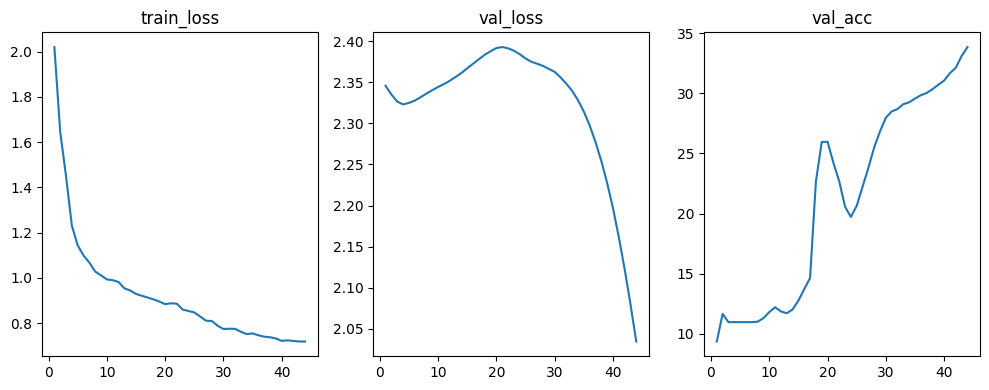

epoch=44/70  train_loss=0.7187  val_loss=2.0342  val_acc=33.83%


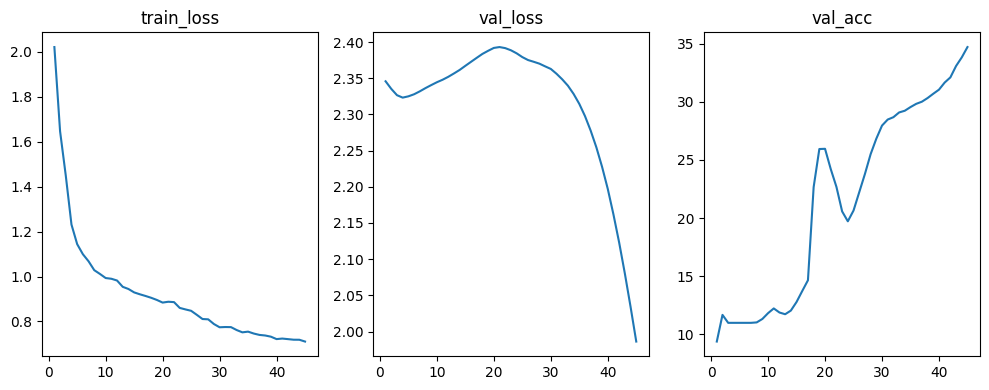

epoch=45/70  train_loss=0.7107  val_loss=1.9861  val_acc=34.72%


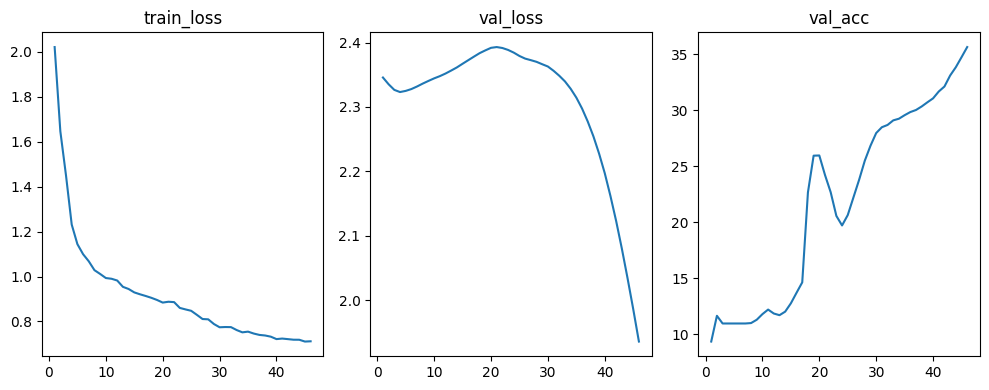

epoch=46/70  train_loss=0.7119  val_loss=1.9357  val_acc=35.63%


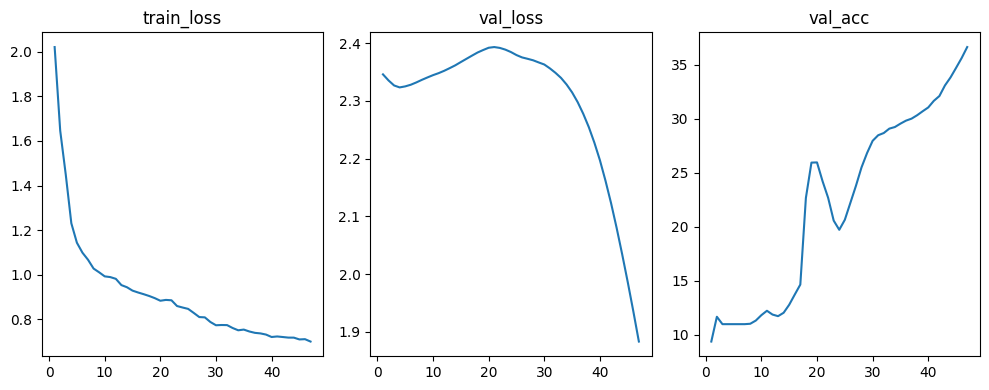

epoch=47/70  train_loss=0.7012  val_loss=1.8832  val_acc=36.65%


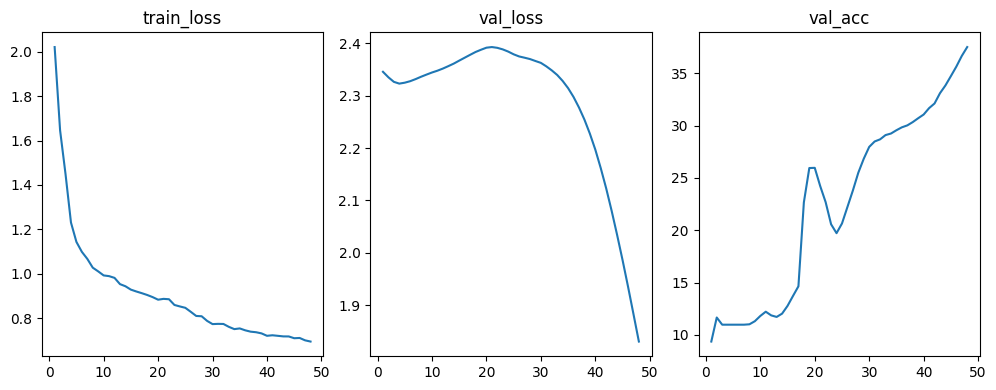

epoch=48/70  train_loss=0.6958  val_loss=1.8302  val_acc=37.50%


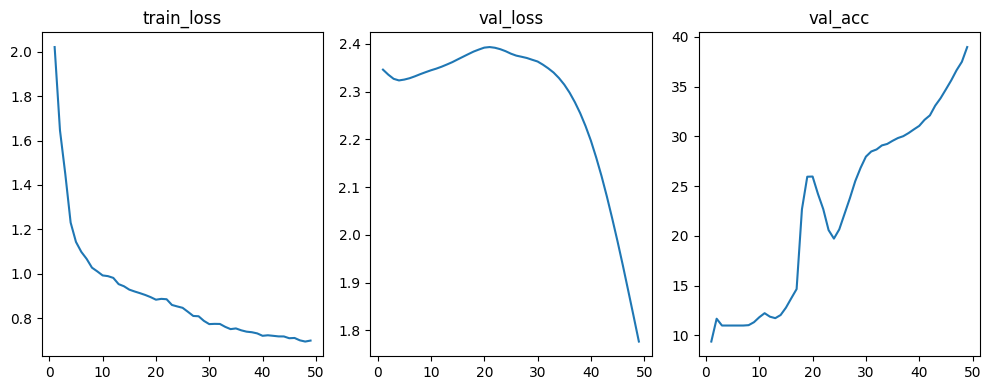

epoch=49/70  train_loss=0.7001  val_loss=1.7765  val_acc=38.98%


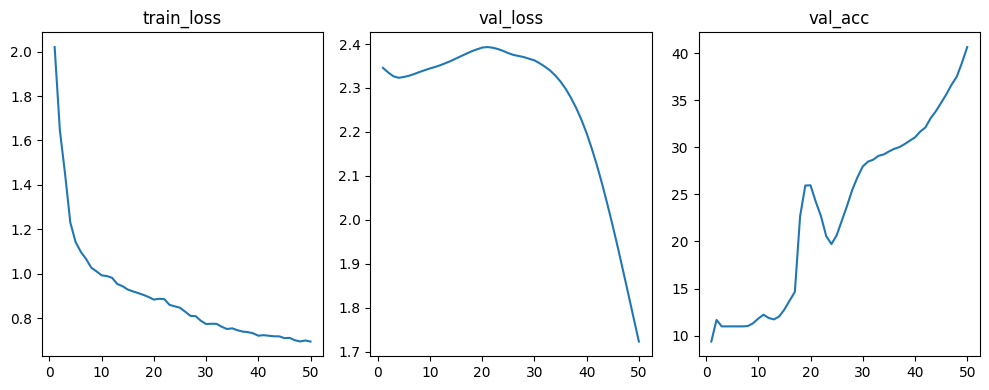

epoch=50/70  train_loss=0.6953  val_loss=1.7232  val_acc=40.65%


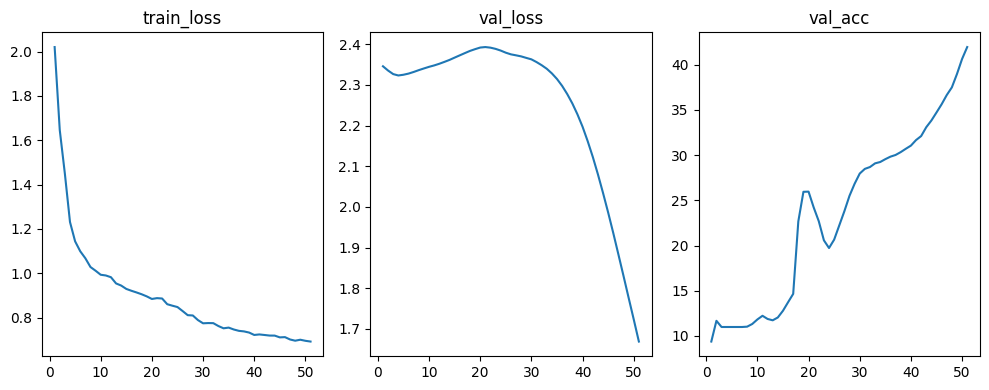

epoch=51/70  train_loss=0.6919  val_loss=1.6689  val_acc=41.96%


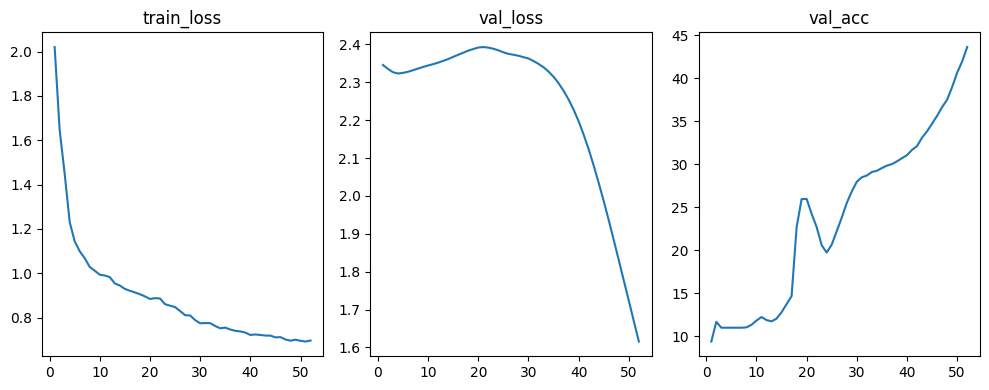

epoch=52/70  train_loss=0.6964  val_loss=1.6156  val_acc=43.63%


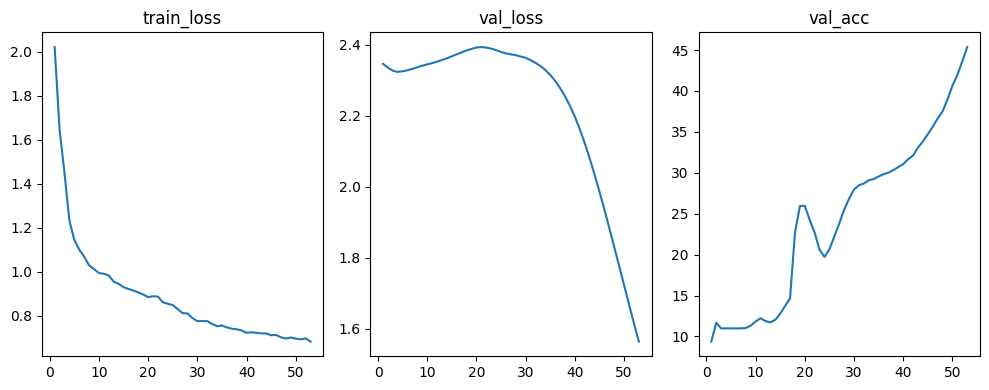

epoch=53/70  train_loss=0.6819  val_loss=1.5646  val_acc=45.37%


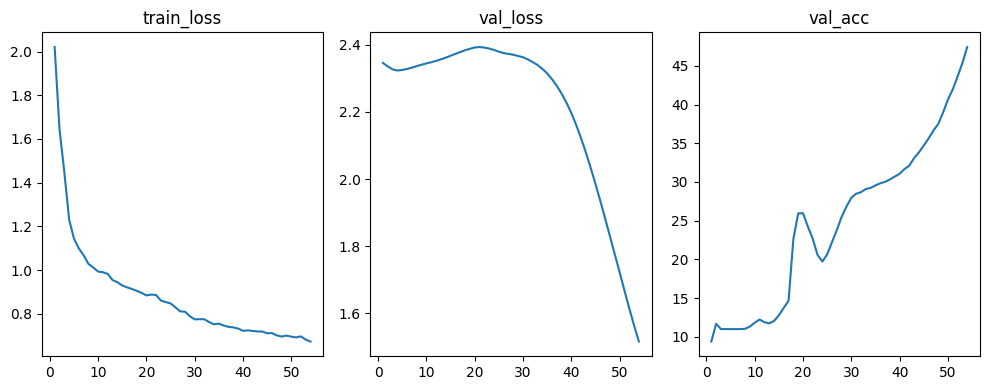

epoch=54/70  train_loss=0.6728  val_loss=1.5164  val_acc=47.44%


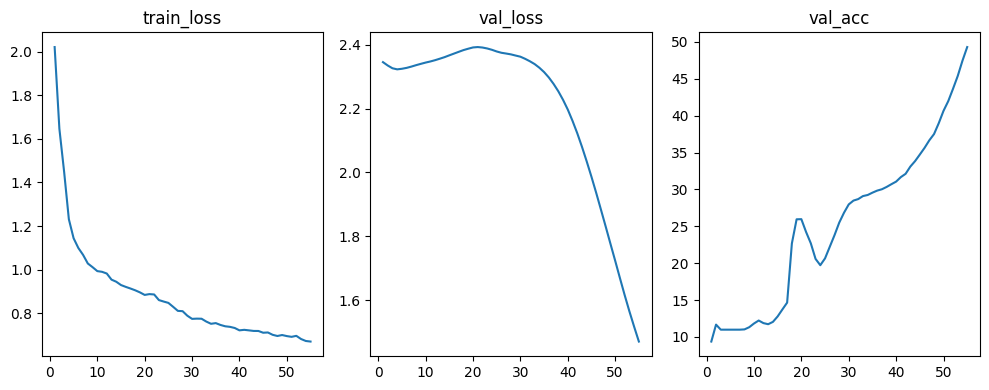

epoch=55/70  train_loss=0.6702  val_loss=1.4698  val_acc=49.30%


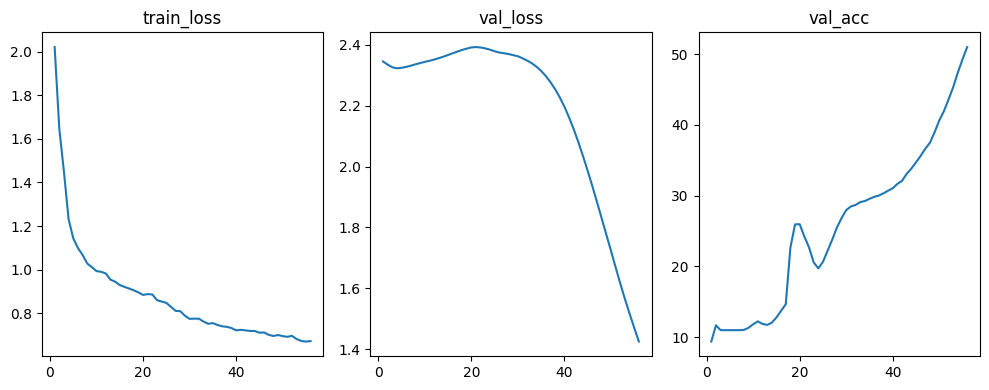

epoch=56/70  train_loss=0.6723  val_loss=1.4245  val_acc=51.02%


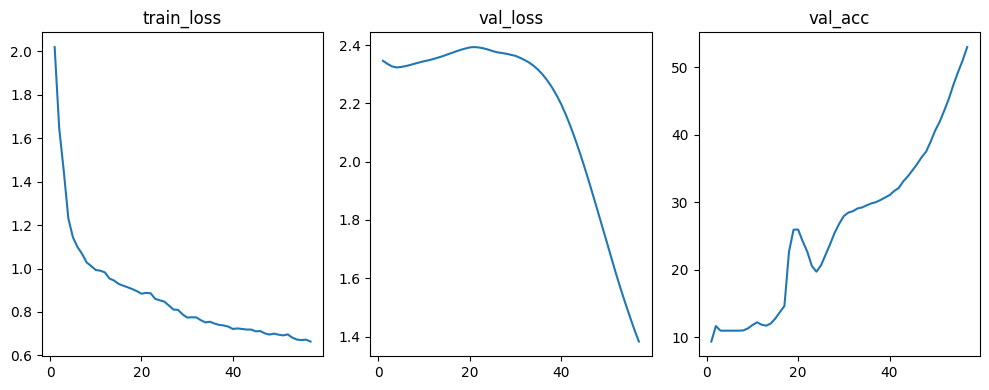

epoch=57/70  train_loss=0.6635  val_loss=1.3829  val_acc=53.00%


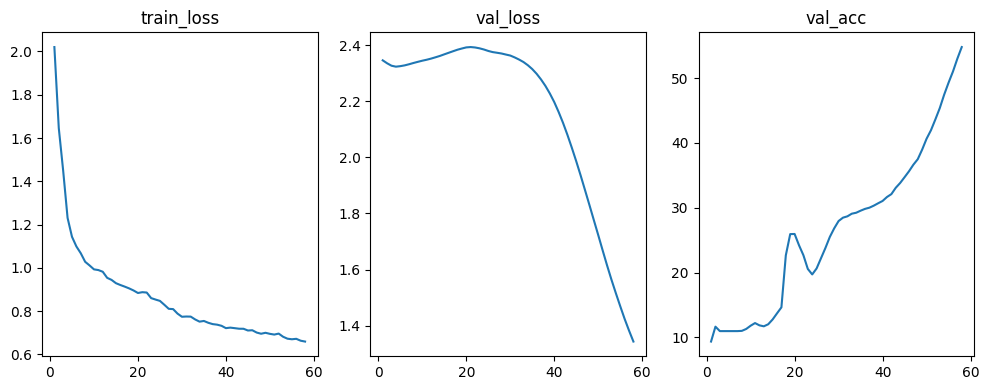

epoch=58/70  train_loss=0.6596  val_loss=1.3436  val_acc=54.80%


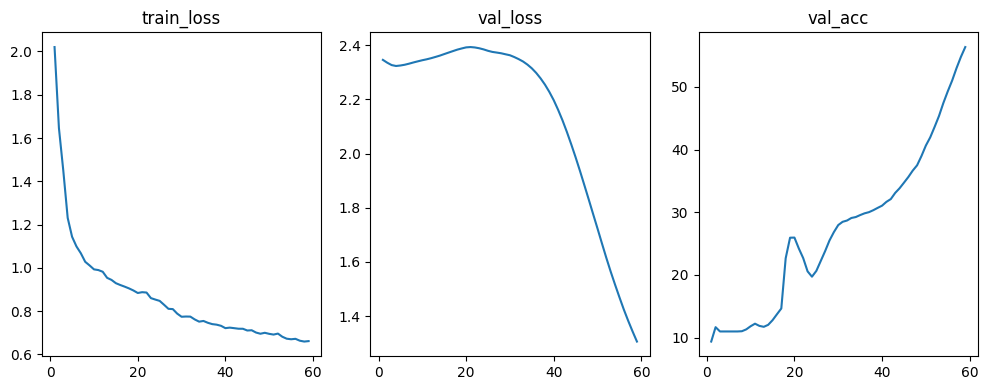

epoch=59/70  train_loss=0.6617  val_loss=1.3061  val_acc=56.37%


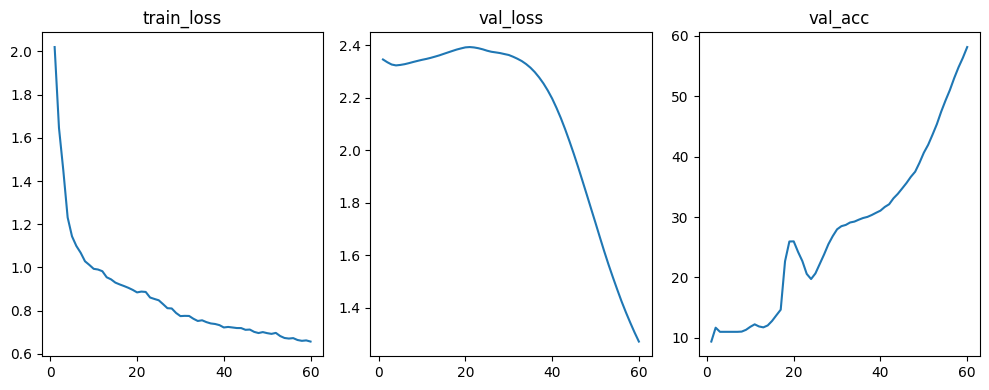

epoch=60/70  train_loss=0.6563  val_loss=1.2711  val_acc=58.15%


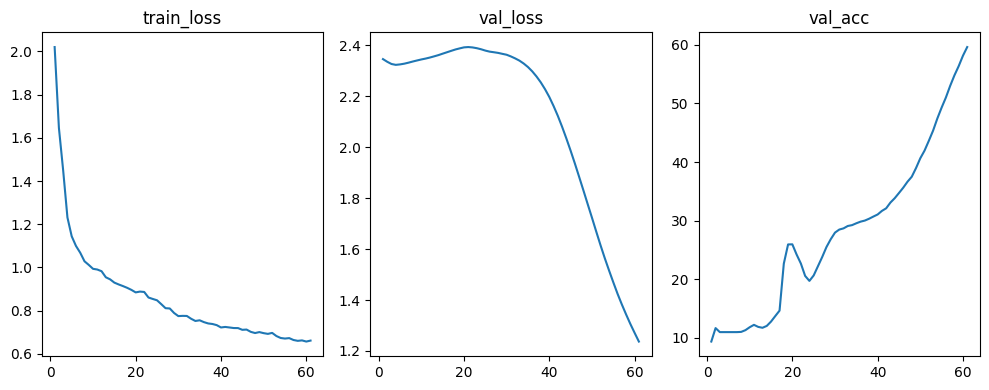

epoch=61/70  train_loss=0.6608  val_loss=1.2369  val_acc=59.63%


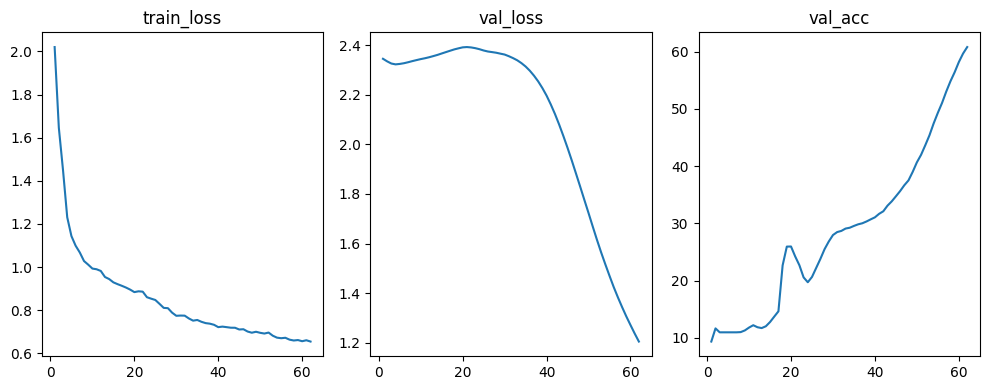

epoch=62/70  train_loss=0.6548  val_loss=1.2044  val_acc=60.78%


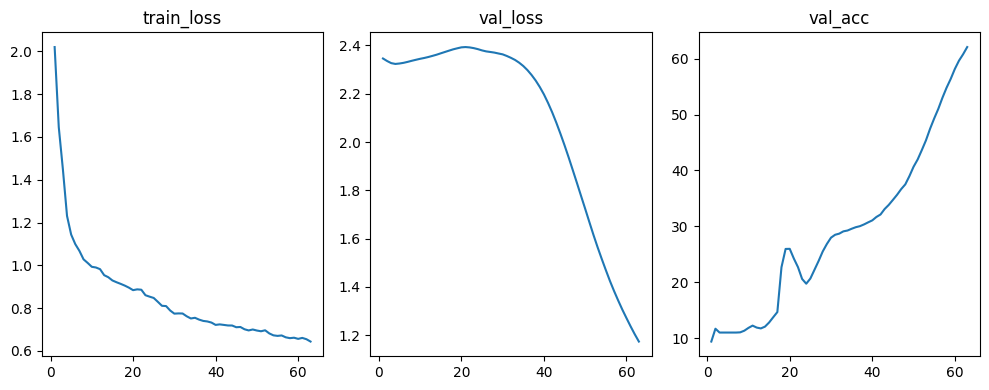

epoch=63/70  train_loss=0.6438  val_loss=1.1741  val_acc=62.07%


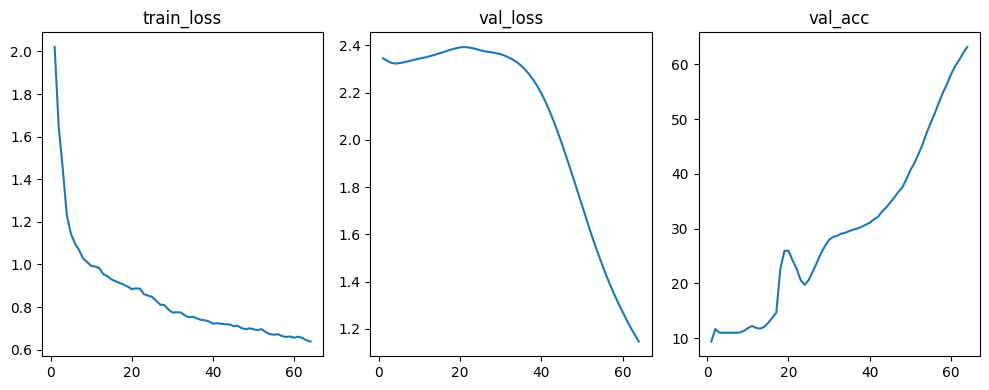

epoch=64/70  train_loss=0.6380  val_loss=1.1457  val_acc=63.17%


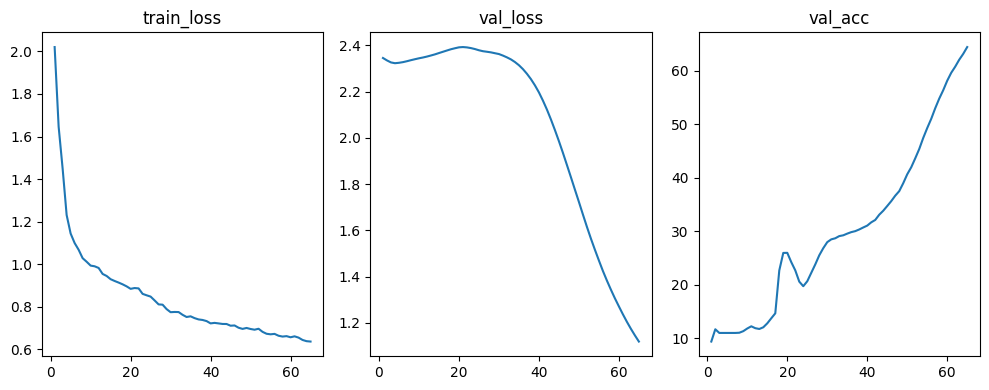

epoch=65/70  train_loss=0.6362  val_loss=1.1188  val_acc=64.44%


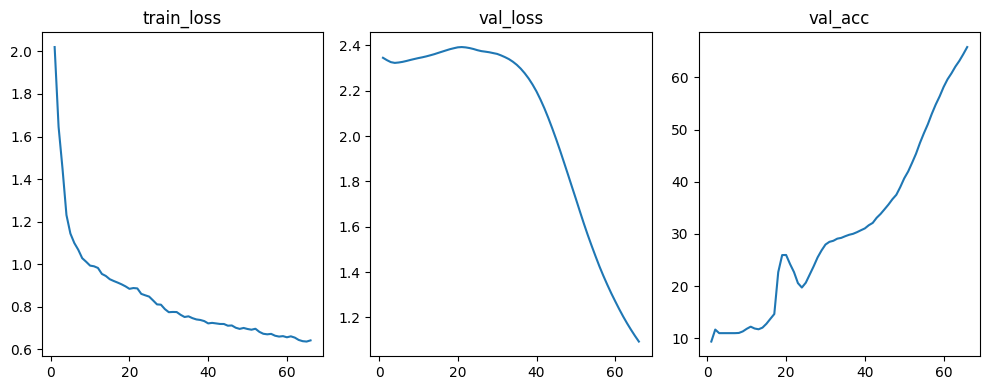

epoch=66/70  train_loss=0.6417  val_loss=1.0935  val_acc=65.81%


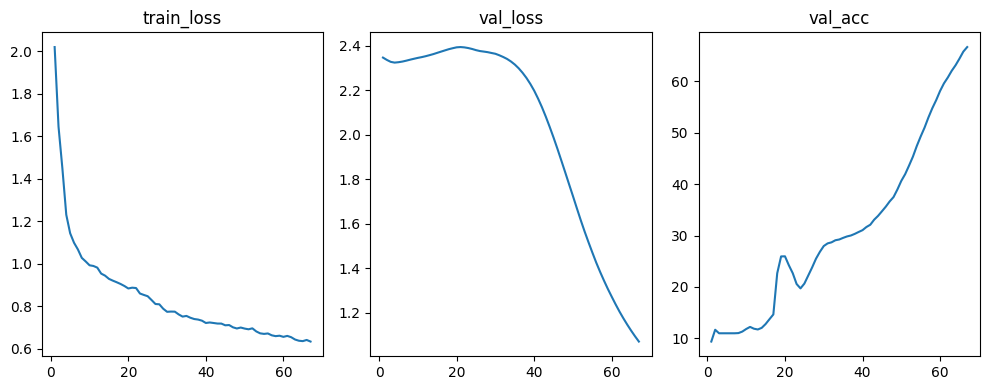

epoch=67/70  train_loss=0.6342  val_loss=1.0696  val_acc=66.70%


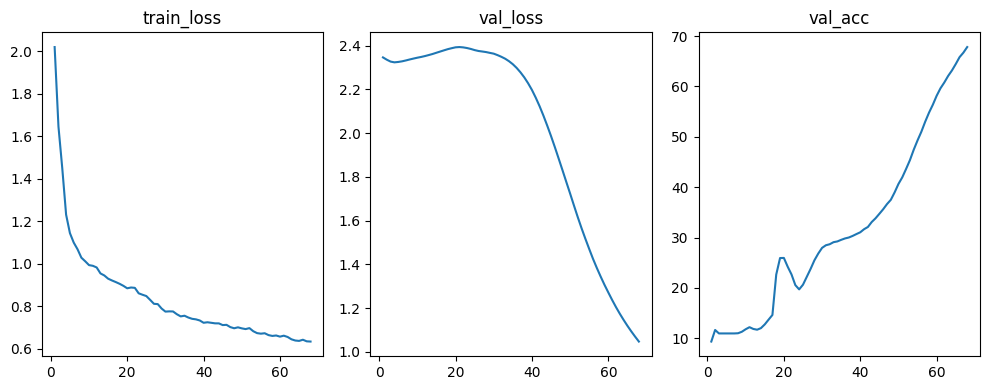

epoch=68/70  train_loss=0.6331  val_loss=1.0467  val_acc=67.81%


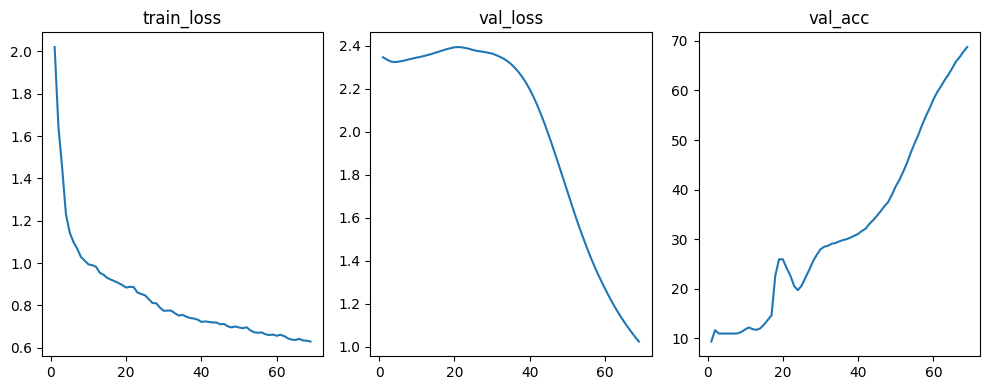

epoch=69/70  train_loss=0.6288  val_loss=1.0251  val_acc=68.74%


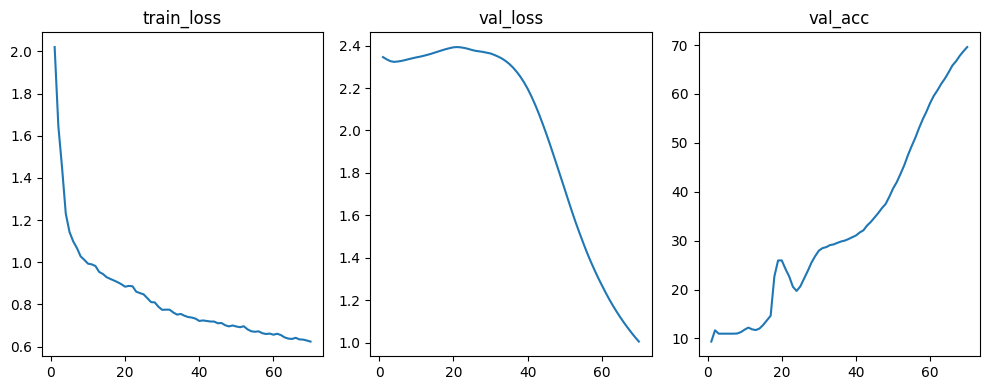

epoch=70/70  train_loss=0.6239  val_loss=1.0048  val_acc=69.59%
best_model: C:\Users\Stephen\Code\University\saved_model_eurosat\best_improved_model_eurosat_v4.pkl best_val_acc: 69.5925925925926


C:\Users\Stephen\AppData\Local\Temp\ipykernel_11232\2702191922.py:146: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(BEST_MODEL_PATH, map_lo

Final Test Accuracy: 69.59%
Precision: 0.7155
Recall: 0.6916
F1-Score: 0.6834


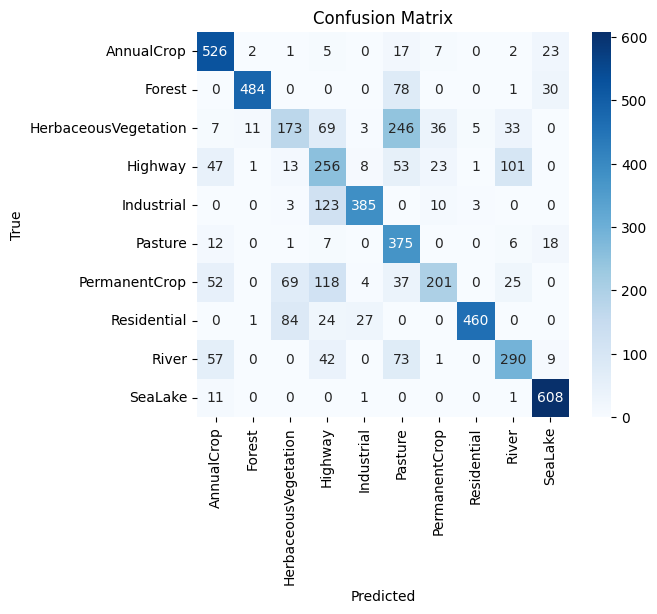

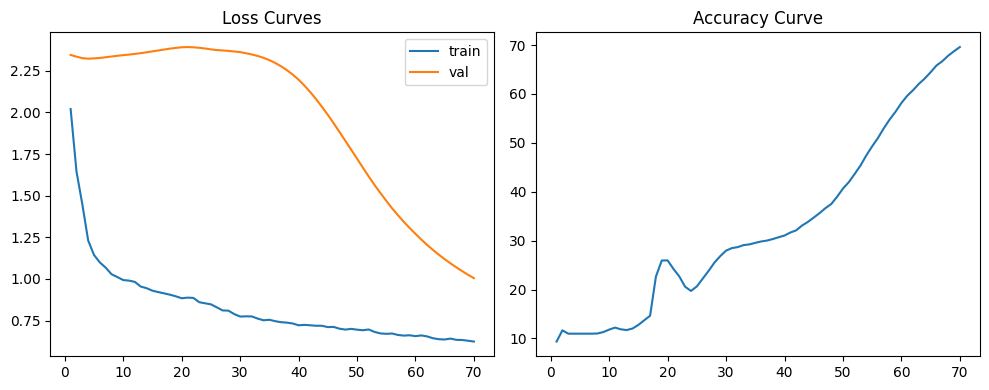

In [4]:
class EMA:
    def __init__(self, model, decay=0.999):
        self.decay = decay
        self.shadow = {}
        for n,p in model.named_parameters():
            if p.requires_grad:
                self.shadow[n] = p.detach().clone()
    def update(self, model):
        for n,p in model.named_parameters():
            if p.requires_grad:
                self.shadow[n].data.mul_(self.decay).add_(p.data, alpha=1.0-self.decay)
    def apply_to(self, model):
        self.backup = {}
        for n,p in model.named_parameters():
            if p.requires_grad:
                self.backup[n] = p.data.clone()
                p.data.copy_(self.shadow[n].data)
    def restore(self, model):
        for n,p in model.named_parameters():
            if p.requires_grad:
                p.data.copy_(self.backup[n])

def ensure_loaders():
    global train_loader, val_loader, full_dataset, train_subset, val_subset, train_mean, train_std
    if 'train_loader' in globals() and 'val_loader' in globals():
        return
    class LaplacianSharpenCLAHE:
        def __init__(self, alpha=0.25, clip_limit=2.0, tile_grid_size=(8,8)):
            self.alpha=float(alpha); self.clip_limit=float(clip_limit); self.tile_grid_size=tile_grid_size
        def __call__(self, img_pil: Image.Image) -> Image.Image:
            img = np.array(img_pil)
            lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
            l,a,b = cv2.split(lab)
            clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
            l_eq = clahe.apply(l)
            lab_eq = cv2.merge([l_eq,a,b])
            img_eq = cv2.cvtColor(lab_eq, cv2.COLOR_LAB2RGB)
            lap = cv2.Laplacian(img_eq, ddepth=cv2.CV_16S, ksize=3)
            lap = cv2.convertScaleAbs(lap)
            sharp = cv2.addWeighted(img_eq, 1.0, lap, self.alpha, 0)
            return Image.fromarray(sharp)
    def build_train_tf(sz=64):
        return transforms.Compose([
            transforms.Resize((sz,sz)),
            LaplacianSharpenCLAHE(alpha=0.25, clip_limit=2.0, tile_grid_size=(8,8)),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomRotation(degrees=10),
            transforms.RandomResizedCrop(sz, scale=(0.95,1.0), ratio=(0.95,1.05)),
            transforms.ToTensor(),
        ])
    def build_val_tf(sz=64):
        return transforms.Compose([
            transforms.Resize((sz,sz)),
            LaplacianSharpenCLAHE(alpha=0.25, clip_limit=2.0, tile_grid_size=(8,8)),
            transforms.ToTensor(),
        ])
    full_dataset = datasets.ImageFolder(EUROSAT_DIR)
    TOTAL = len(full_dataset)
    train_len = int(0.8*TOTAL); val_len = TOTAL-train_len
    g = torch.Generator().manual_seed(SEED)
    train_subset, val_subset = random_split(full_dataset, [train_len, val_len], generator=g)
    train_subset.dataset.transform = build_train_tf(IMAGE_SIZE)
    val_subset.dataset.transform   = build_val_tf(IMAGE_SIZE)
    tmp_loader = DataLoader(train_subset, batch_size=256, shuffle=False, num_workers=0, pin_memory=True)
    def compute_stats(loader):
        n=0; mean=torch.zeros(3,dtype=torch.double); M2=torch.zeros(3,dtype=torch.double)
        for x,_ in loader:
            x=x.double()
            b,c,h,w=x.shape; p=b*h*w; n+=p
            m=x.mean(dim=[0,2,3]); d=m-mean; mean+=d*(p/n)
            var=((x-m[None,:,None,None])**2).sum(dim=[0,2,3])/p
            M2+=var*p
        std=torch.sqrt(M2/max(1,n))
        return mean.float(), std.float()
    train_mean, train_std = compute_stats(tmp_loader)
    norm_tf = transforms.Normalize(mean=train_mean.tolist(), std=train_std.tolist())
    train_subset.dataset.transform = transforms.Compose([build_train_tf(IMAGE_SIZE), norm_tf])
    val_subset.dataset.transform   = transforms.Compose([build_val_tf(IMAGE_SIZE),   norm_tf])
    train_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=0, pin_memory=True, drop_last=True)
    val_loader   = DataLoader(val_subset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)

ensure_loaders()

ema = EMA(model, decay=EMA_DECAY)
best_acc = -1.0
history = {"epoch": [], "train_loss": [], "val_loss": [], "val_acc": [], "lr": []}

for epoch in range(1, EPOCHS+1):
    model.train()
    train_loss_sum = 0.0; n_train = 0
    for xb,yb in train_loader:
        xb,yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        optimizer.zero_grad(set_to_none=True)
        out = model(xb)
        loss = criterion(out,yb)
        loss.backward()
        optimizer.step()
        ema.update(model)
        train_loss_sum += loss.item()*xb.size(0)
        n_train += xb.size(0)

    model.eval()
    ema.apply_to(model)
    val_loss_sum = 0.0; correct = 0; n_val = 0
    with torch.no_grad():
        for xb,yb in val_loader:
            xb,yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
            logits = model(xb)
            if TTA_HFLIP:
                xb_h = torch.flip(xb, dims=[3])
                logits = logits + model(xb_h)
            if TTA_VFLIP:
                xb_v = torch.flip(xb, dims=[2])
                logits = logits + model(xb_v)
            logits = logits / (1 + int(TTA_HFLIP) + int(TTA_VFLIP))
            loss = criterion(logits,yb)
            val_loss_sum += loss.item()*xb.size(0)
            pred = logits.argmax(dim=1)
            correct += (pred==yb).sum().item()
            n_val += xb.size(0)
    val_acc = 100.0 * correct / max(1,n_val)
    ema.restore(model)

    train_loss = train_loss_sum / max(1,n_train)
    val_loss   = val_loss_sum   / max(1,n_val)
    cur_lr     = optimizer.param_groups[0]['lr']

    history["epoch"].append(epoch); history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss); history["val_acc"].append(val_acc); history["lr"].append(cur_lr)

    if val_acc > best_acc:
        best_acc = val_acc
        ema.apply_to(model)
        torch.save(model.state_dict(), BEST_MODEL_PATH)
        ema.restore(model)

    plt.figure(figsize=(10,4))
    plt.subplot(1,3,1); plt.plot(history["epoch"], history["train_loss"]); plt.title("train_loss")
    plt.subplot(1,3,2); plt.plot(history["epoch"], history["val_loss"]);  plt.title("val_loss")
    plt.subplot(1,3,3); plt.plot(history["epoch"], history["val_acc"]);   plt.title("val_acc")
    plt.tight_layout(); plt.show()
    print(f"epoch={epoch}/{EPOCHS}  train_loss={train_loss:.4f}  val_loss={val_loss:.4f}  val_acc={val_acc:.2f}%")

print("best_model:", BEST_MODEL_PATH, "best_val_acc:", best_acc)

model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=device))
model.eval()
all_preds, all_labels = [], []
val_loss_sum = 0.0; n_val = 0
with torch.no_grad():
    for xb,yb in val_loader:
        xb,yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        logits = model(xb)
        if TTA_HFLIP:
            xb_h = torch.flip(xb, dims=[3]); logits = logits + model(xb_h)
        if TTA_VFLIP:
            xb_v = torch.flip(xb, dims=[2]); logits = logits + model(xb_v)
        logits = logits / (1 + int(TTA_HFLIP) + int(TTA_VFLIP))
        val_loss_sum += criterion(logits,yb).item()*xb.size(0)
        pred = logits.argmax(1)
        all_preds.extend(pred.detach().cpu().numpy().tolist())
        all_labels.extend(yb.detach().cpu().numpy().tolist())
        n_val += xb.size(0)

final_acc = 100.0 * (np.sum(np.array(all_preds)==np.array(all_labels)) / max(1,n_val))
prec = precision_score(all_labels, all_preds, average='macro', zero_division=0)
rec  = recall_score(all_labels, all_preds, average='macro', zero_division=0)
f1   = f1_score(all_labels, all_preds, average='macro', zero_division=0)
cm   = confusion_matrix(all_labels, all_preds)

print(f"Final Test Accuracy: {final_acc:.2f}%")
print(f"Precision: {prec:.4f}")
print(f"Recall: {rec:.4f}")
print(f"F1-Score: {f1:.4f}")

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=full_dataset.classes, yticklabels=full_dataset.classes)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Confusion Matrix"); plt.show()

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.plot(history["epoch"], history["train_loss"], label="train"); plt.plot(history["epoch"], history["val_loss"], label="val"); plt.legend(); plt.title("Loss Curves")
plt.subplot(1,2,2); plt.plot(history["epoch"], history["val_acc"]); plt.title("Accuracy Curve")
plt.tight_layout(); plt.show()


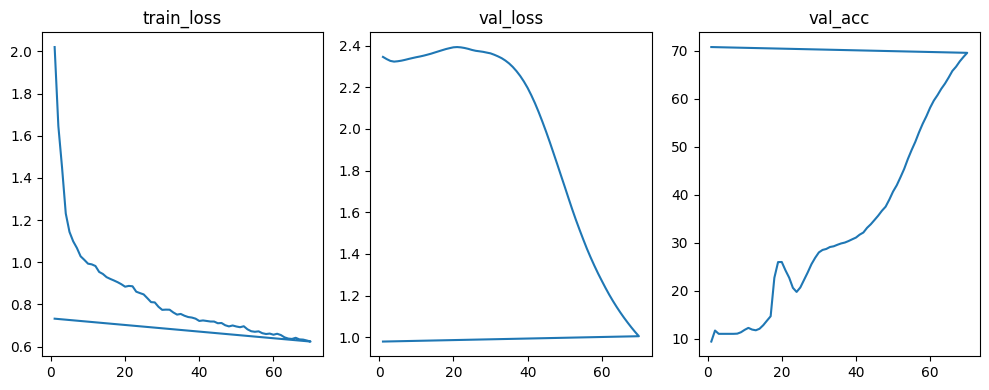

epoch=1/70  train_loss=0.7323  val_loss=0.9792  val_acc=70.80%


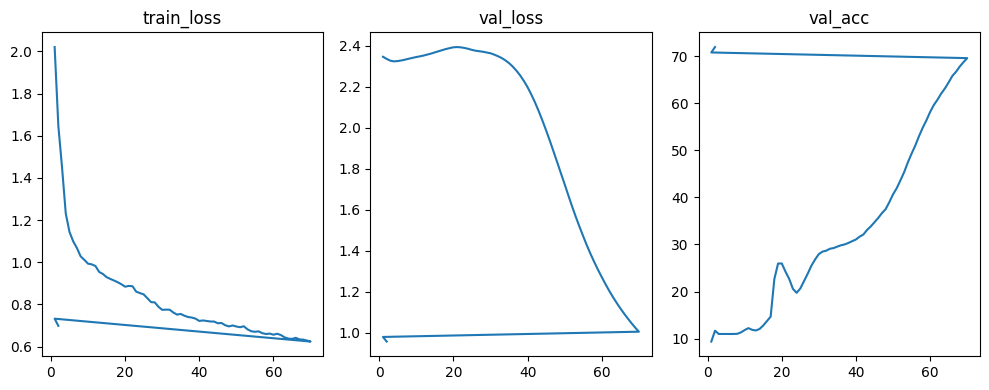

epoch=2/70  train_loss=0.6984  val_loss=0.9568  val_acc=71.94%


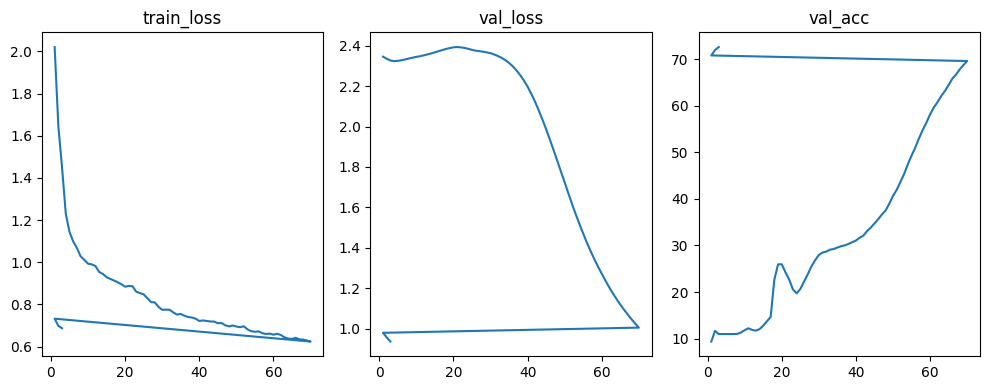

epoch=3/70  train_loss=0.6870  val_loss=0.9359  val_acc=72.59%


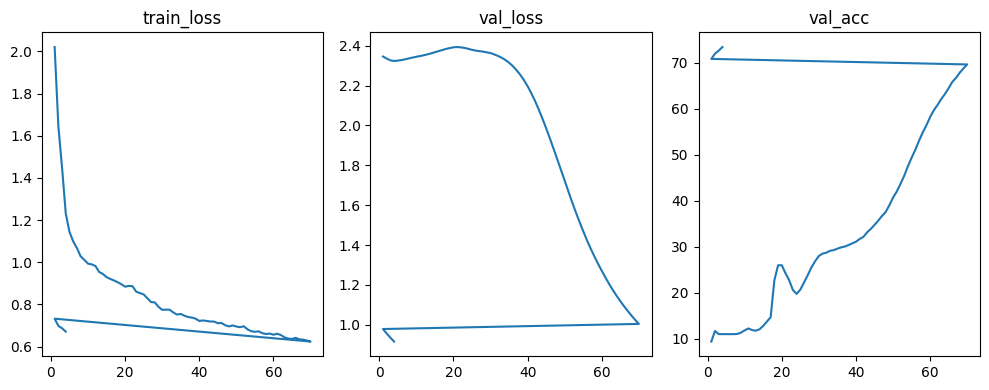

epoch=4/70  train_loss=0.6709  val_loss=0.9163  val_acc=73.37%


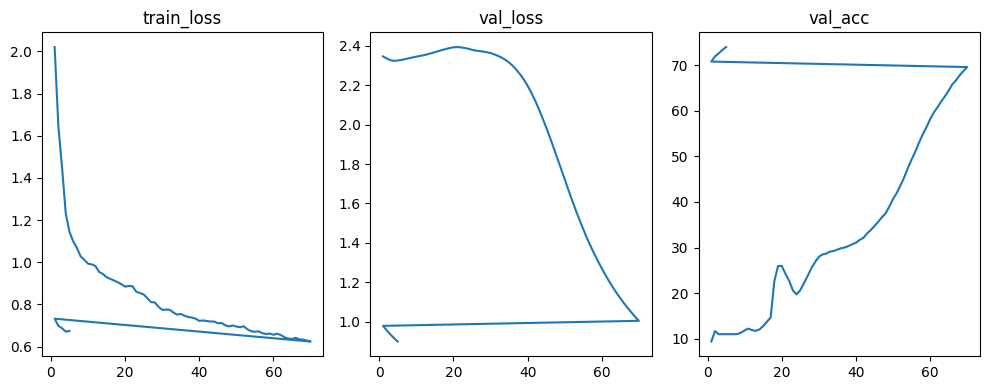

epoch=5/70  train_loss=0.6744  val_loss=0.8996  val_acc=73.98%


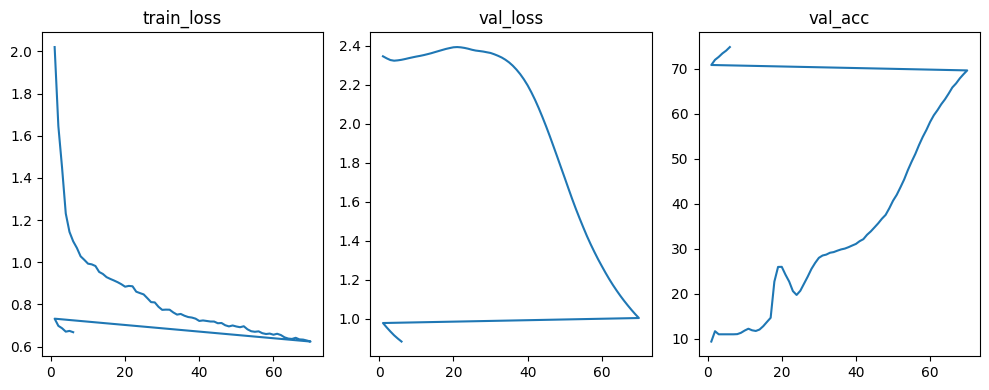

epoch=6/70  train_loss=0.6682  val_loss=0.8843  val_acc=74.78%


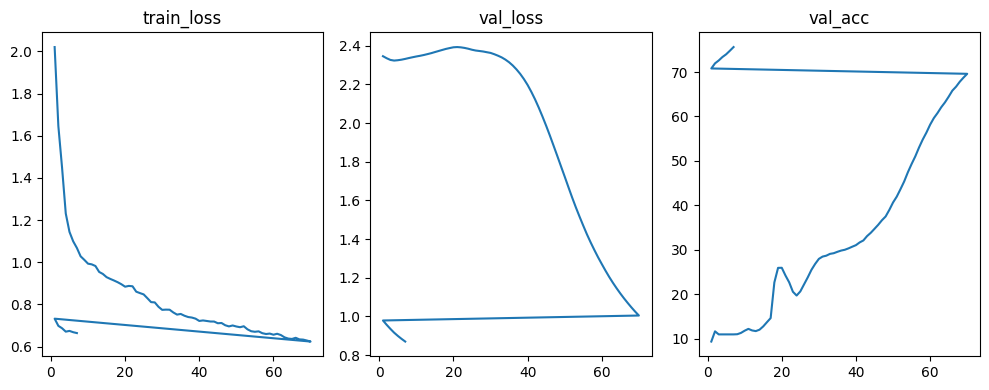

epoch=7/70  train_loss=0.6641  val_loss=0.8703  val_acc=75.61%


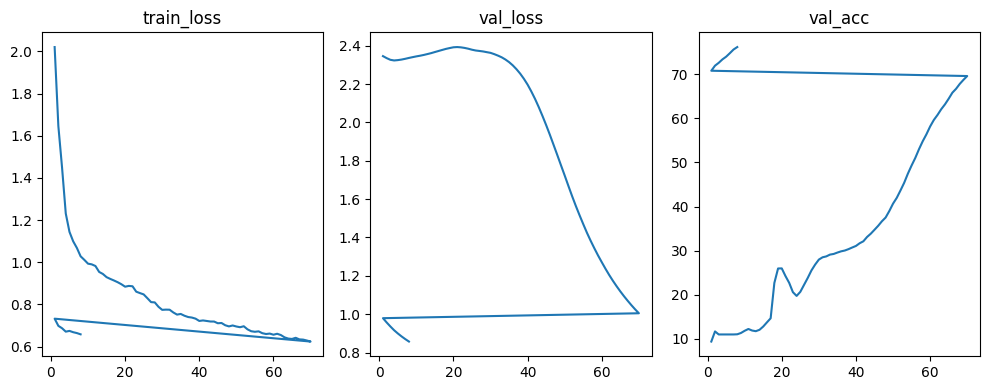

epoch=8/70  train_loss=0.6582  val_loss=0.8573  val_acc=76.17%


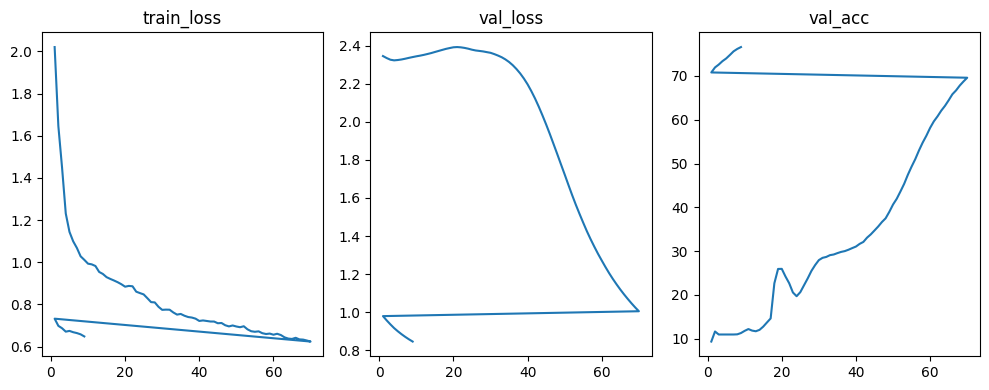

epoch=9/70  train_loss=0.6482  val_loss=0.8456  val_acc=76.59%


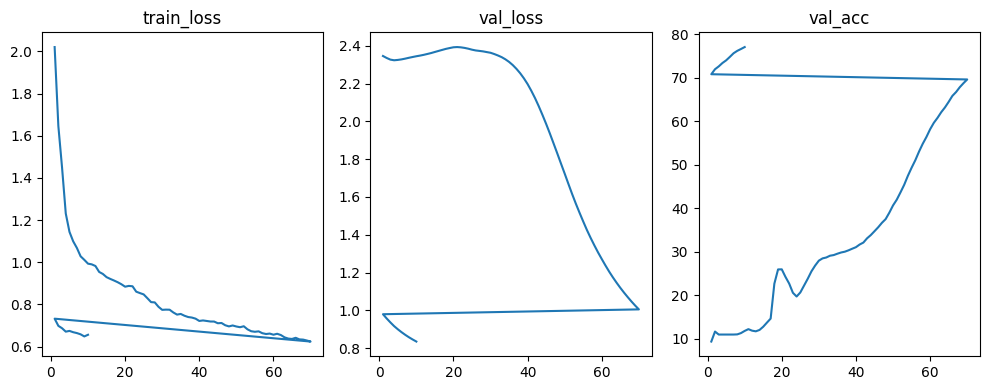

epoch=10/70  train_loss=0.6561  val_loss=0.8346  val_acc=77.04%


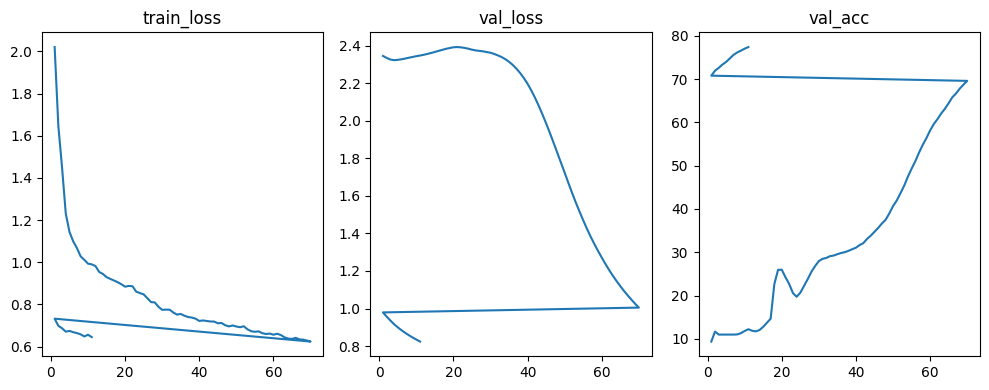

epoch=11/70  train_loss=0.6450  val_loss=0.8239  val_acc=77.41%


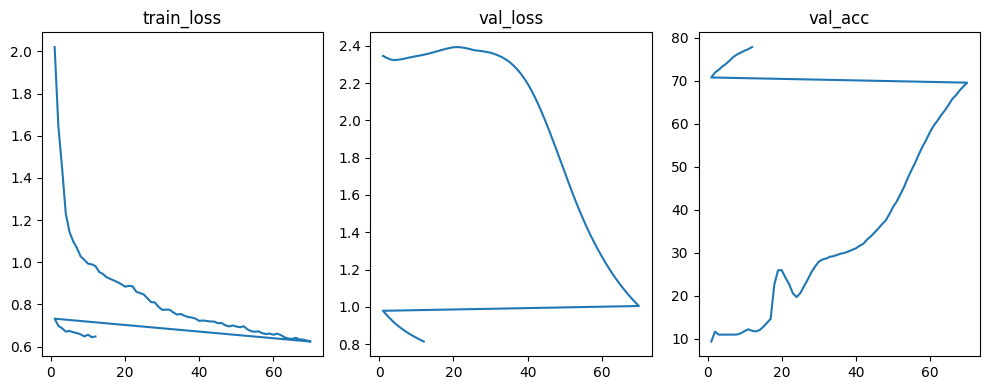

epoch=12/70  train_loss=0.6478  val_loss=0.8143  val_acc=77.87%


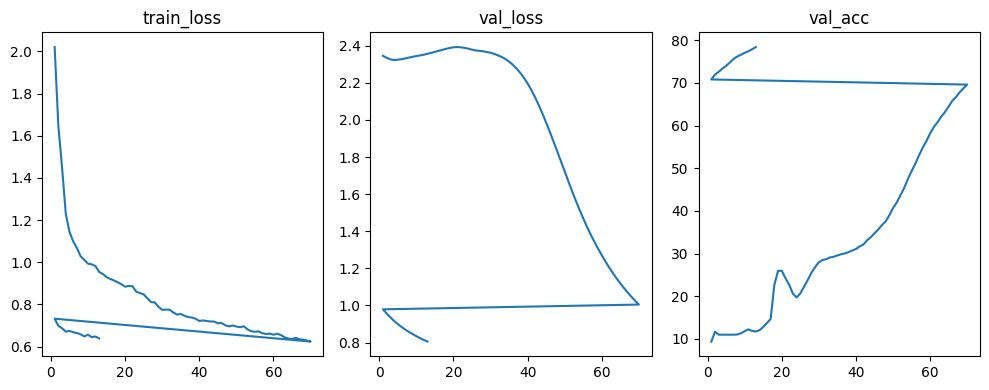

epoch=13/70  train_loss=0.6388  val_loss=0.8055  val_acc=78.39%


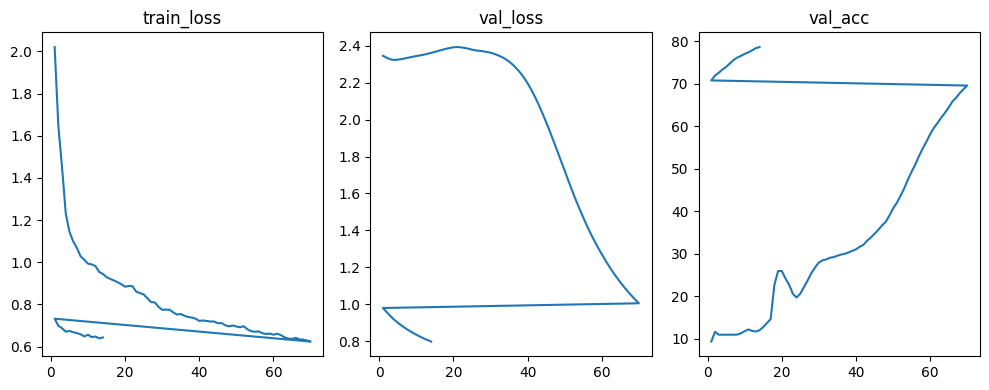

epoch=14/70  train_loss=0.6432  val_loss=0.7975  val_acc=78.65%


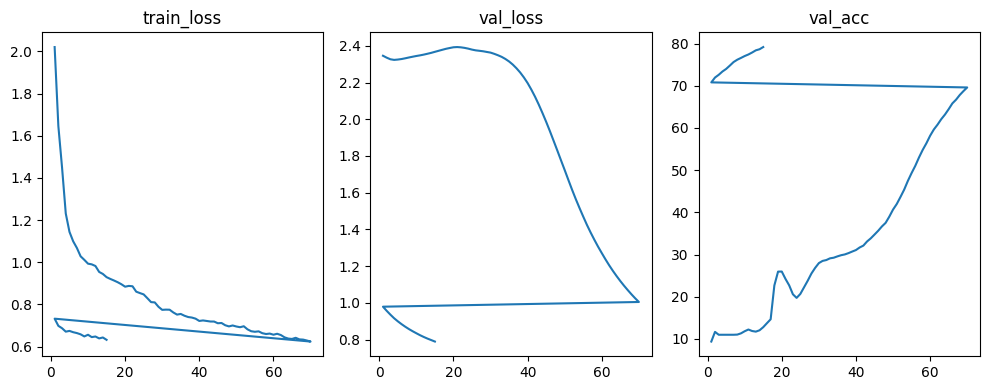

epoch=15/70  train_loss=0.6321  val_loss=0.7894  val_acc=79.17%


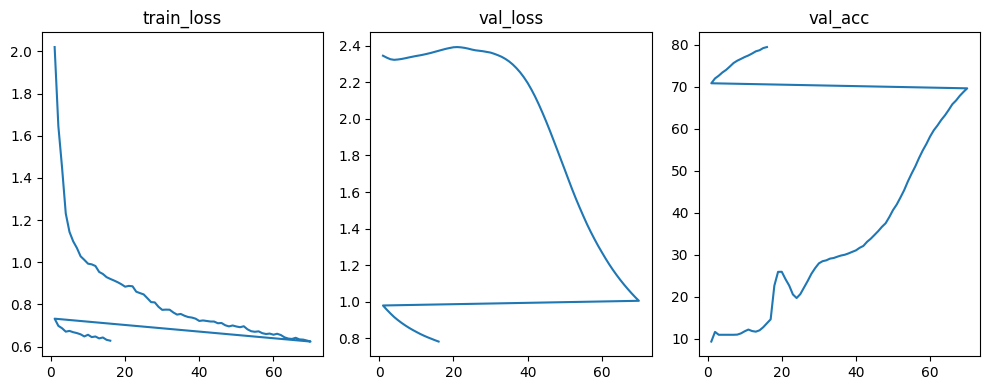

epoch=16/70  train_loss=0.6280  val_loss=0.7819  val_acc=79.41%


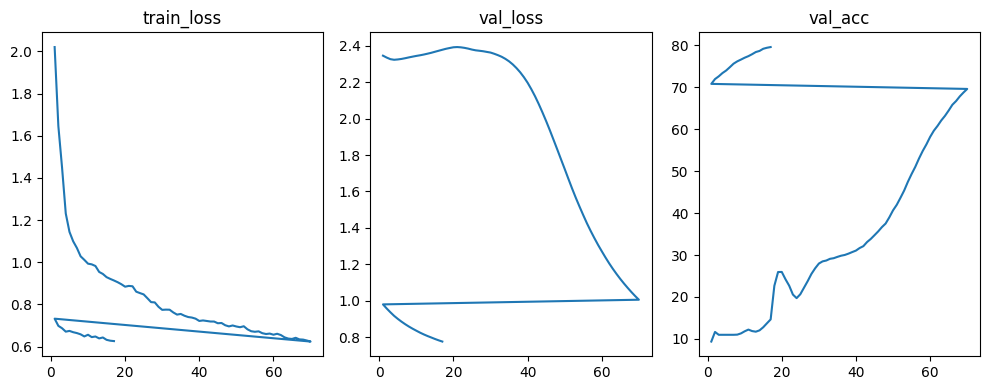

epoch=17/70  train_loss=0.6261  val_loss=0.7750  val_acc=79.57%


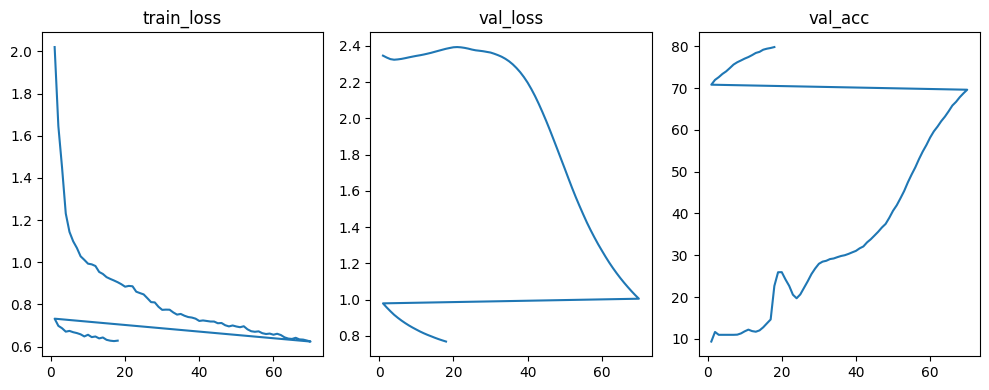

epoch=18/70  train_loss=0.6282  val_loss=0.7685  val_acc=79.80%


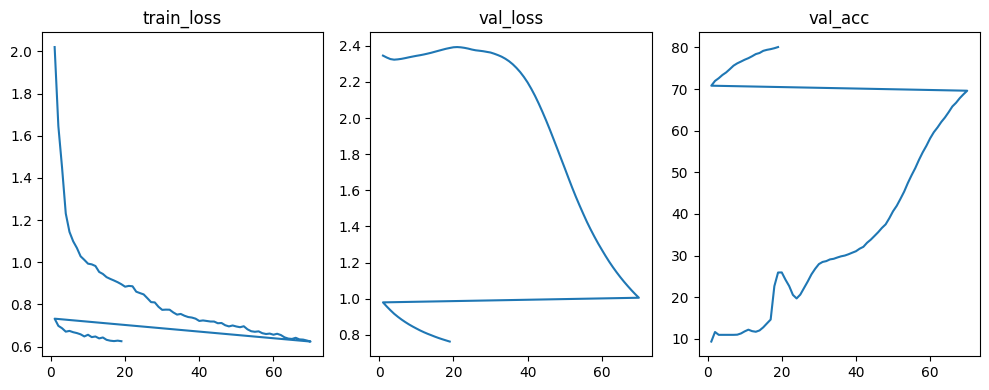

epoch=19/70  train_loss=0.6255  val_loss=0.7622  val_acc=80.07%


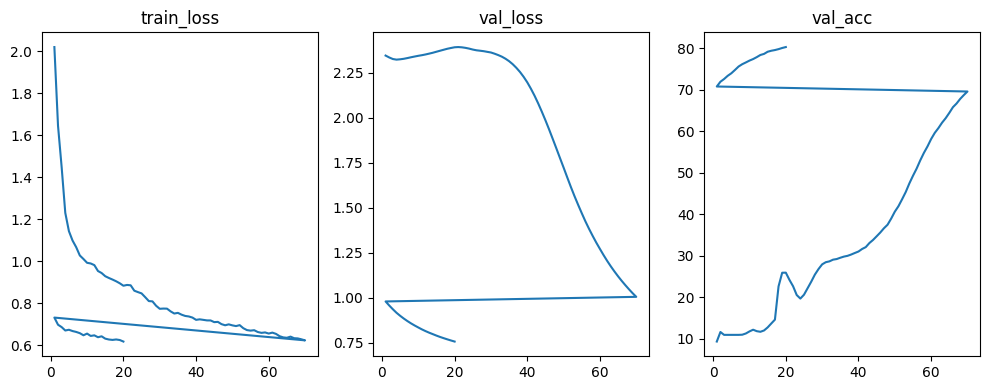

epoch=20/70  train_loss=0.6182  val_loss=0.7563  val_acc=80.30%


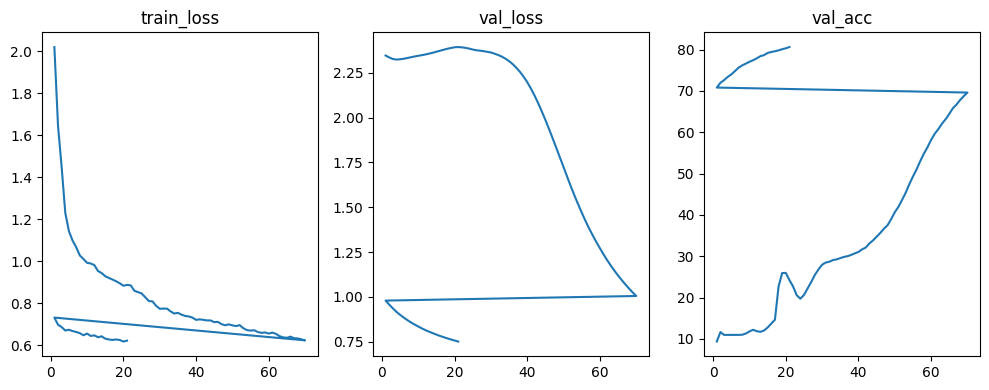

epoch=21/70  train_loss=0.6224  val_loss=0.7508  val_acc=80.59%


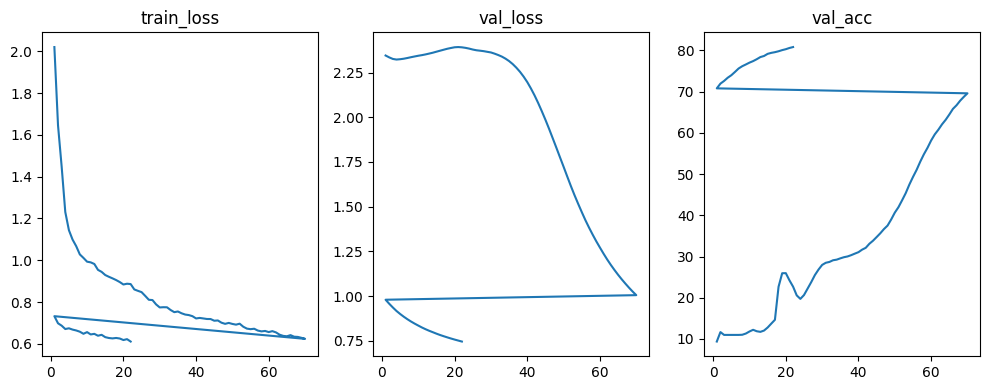

epoch=22/70  train_loss=0.6110  val_loss=0.7452  val_acc=80.81%


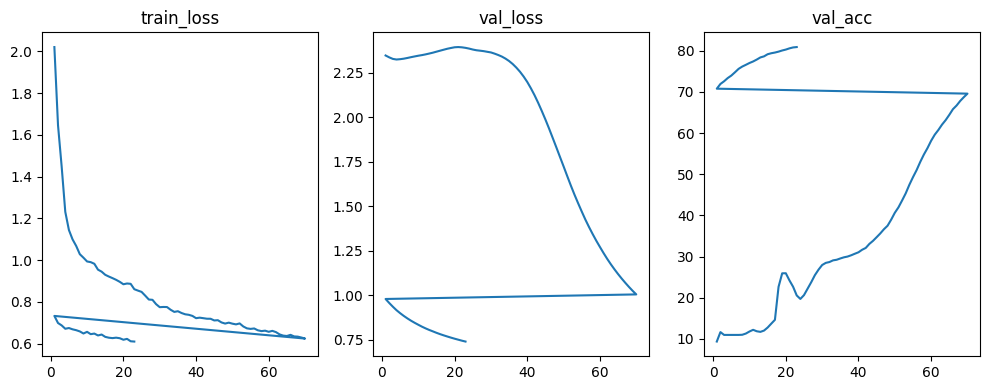

epoch=23/70  train_loss=0.6096  val_loss=0.7403  val_acc=80.91%


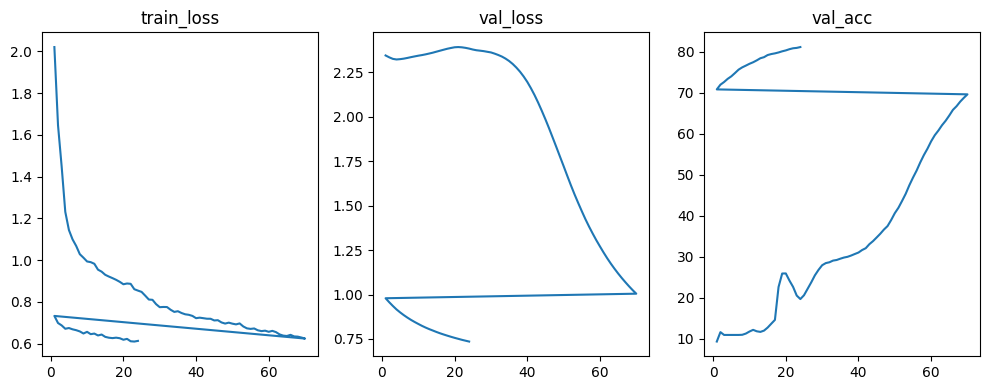

epoch=24/70  train_loss=0.6127  val_loss=0.7354  val_acc=81.11%


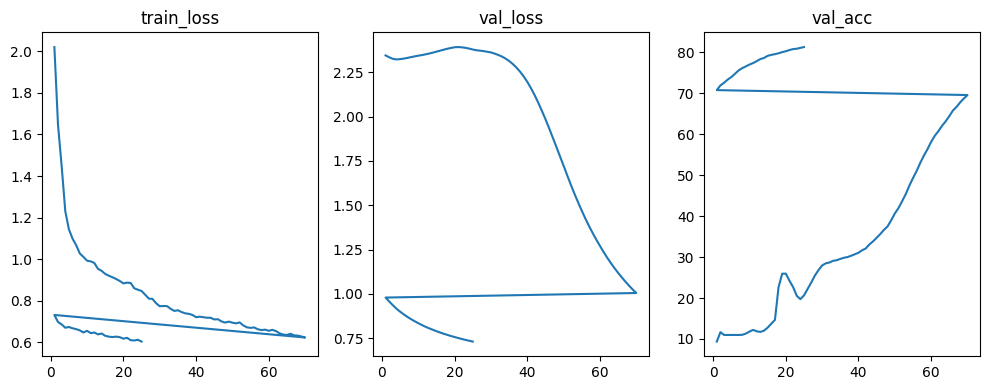

epoch=25/70  train_loss=0.6044  val_loss=0.7309  val_acc=81.31%


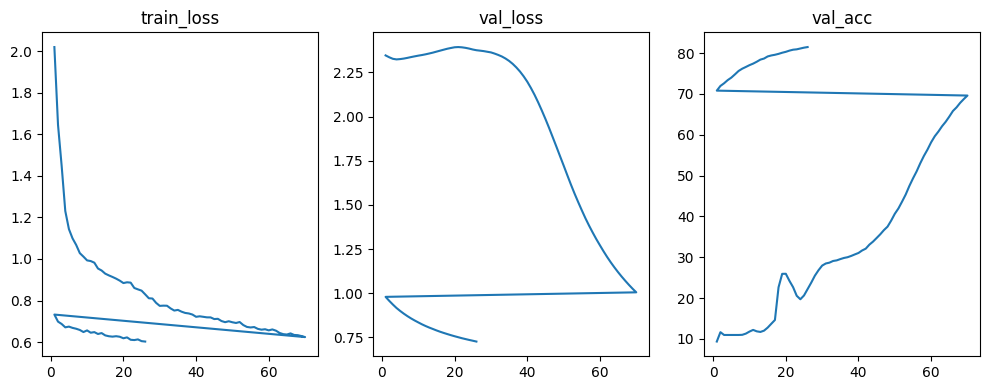

epoch=26/70  train_loss=0.6024  val_loss=0.7262  val_acc=81.46%


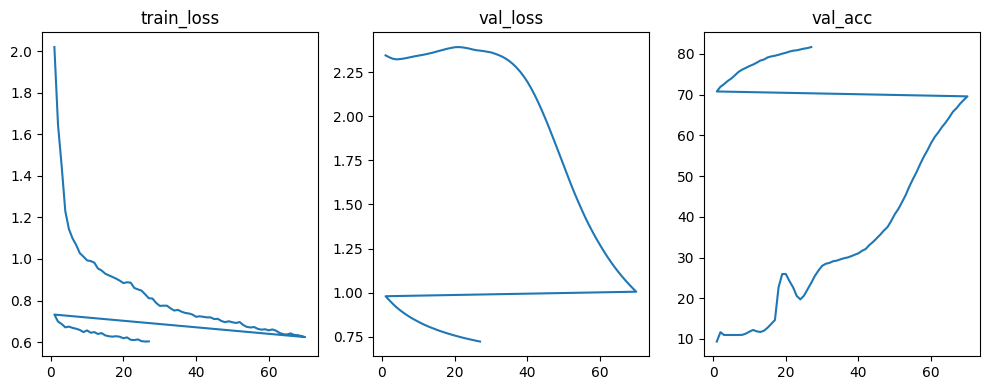

epoch=27/70  train_loss=0.6032  val_loss=0.7220  val_acc=81.70%


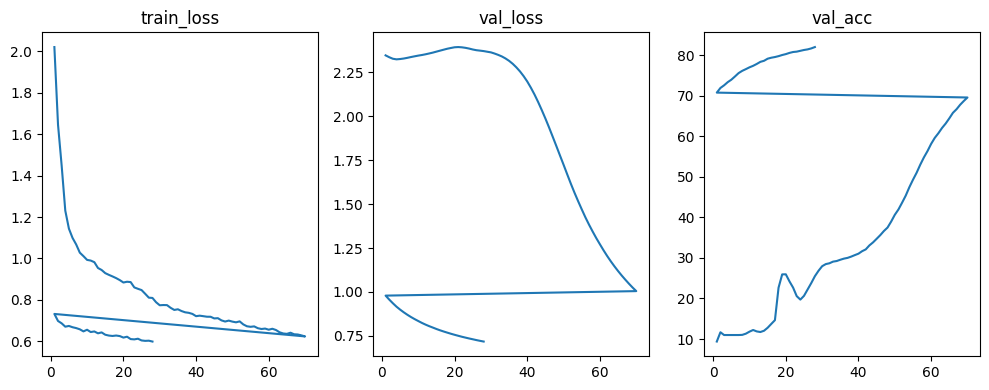

epoch=28/70  train_loss=0.5991  val_loss=0.7179  val_acc=82.04%


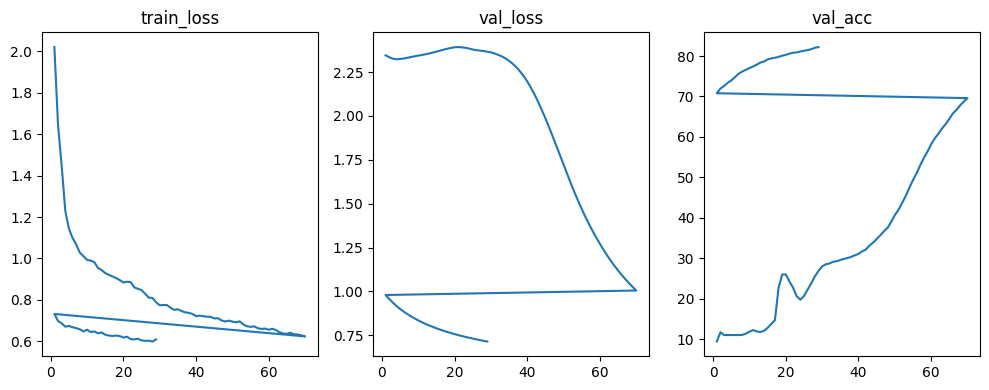

epoch=29/70  train_loss=0.6094  val_loss=0.7138  val_acc=82.22%


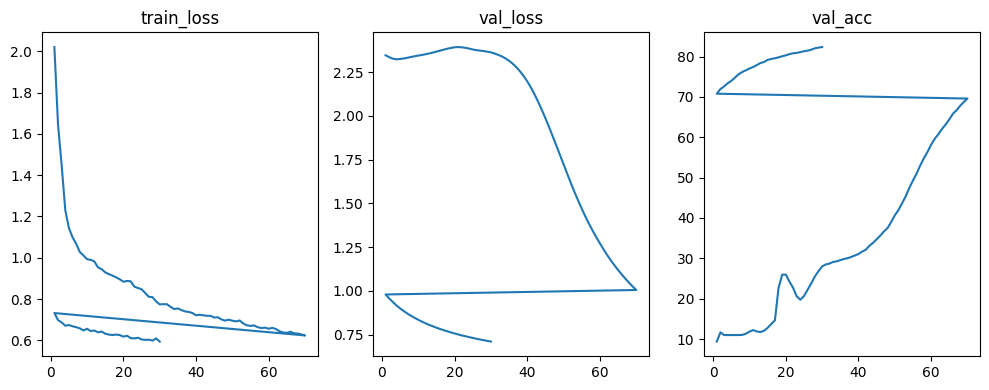

epoch=30/70  train_loss=0.5943  val_loss=0.7102  val_acc=82.35%


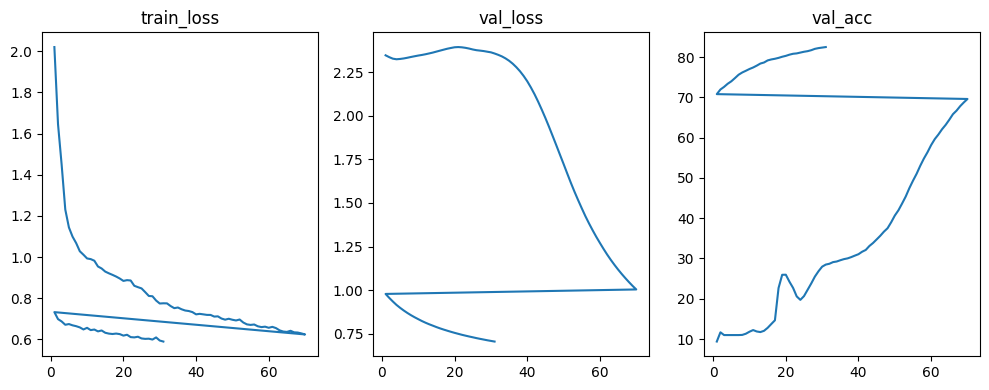

epoch=31/70  train_loss=0.5894  val_loss=0.7065  val_acc=82.48%


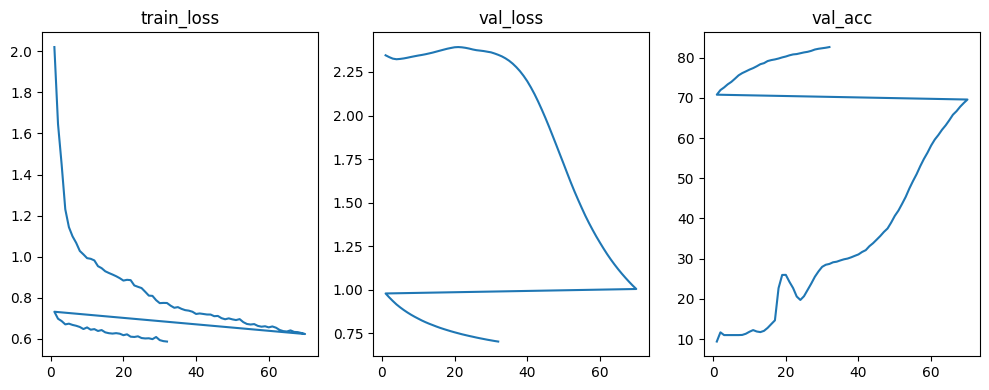

epoch=32/70  train_loss=0.5873  val_loss=0.7033  val_acc=82.65%


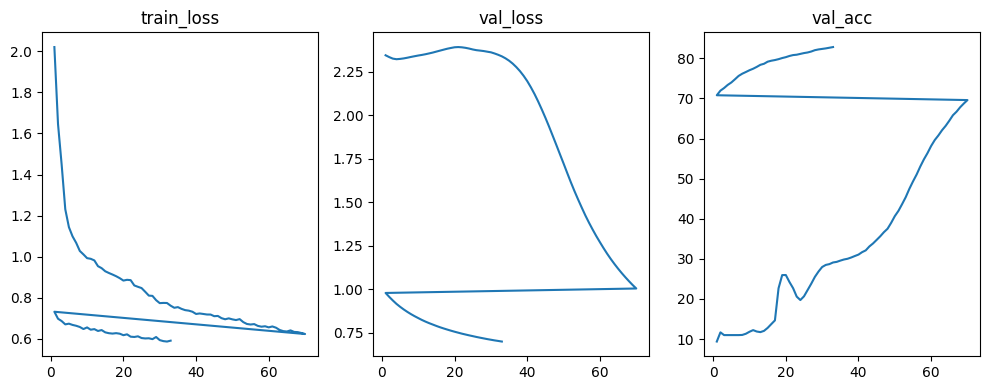

epoch=33/70  train_loss=0.5916  val_loss=0.6998  val_acc=82.81%


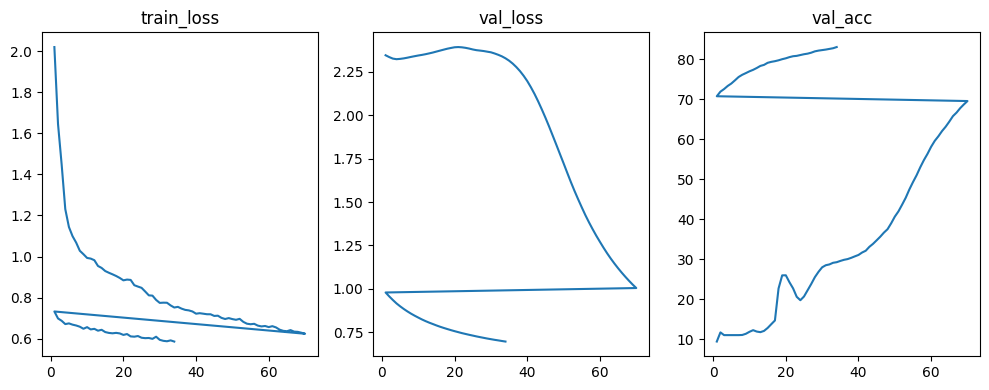

epoch=34/70  train_loss=0.5859  val_loss=0.6965  val_acc=83.11%


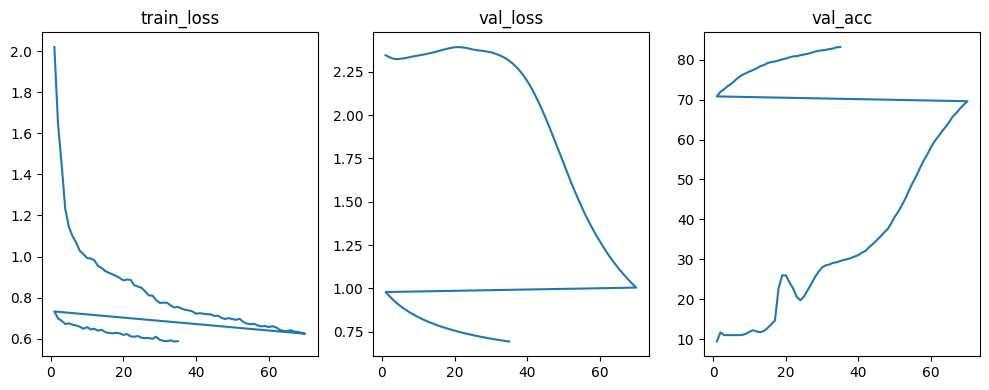

epoch=35/70  train_loss=0.5877  val_loss=0.6934  val_acc=83.17%


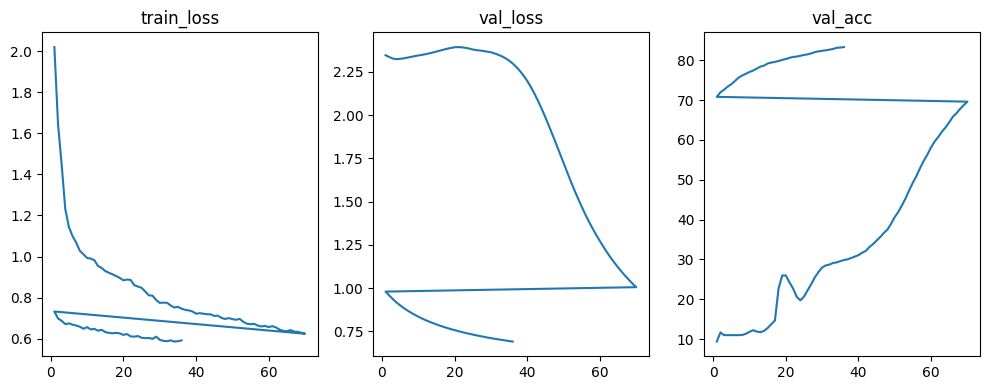

epoch=36/70  train_loss=0.5915  val_loss=0.6904  val_acc=83.30%


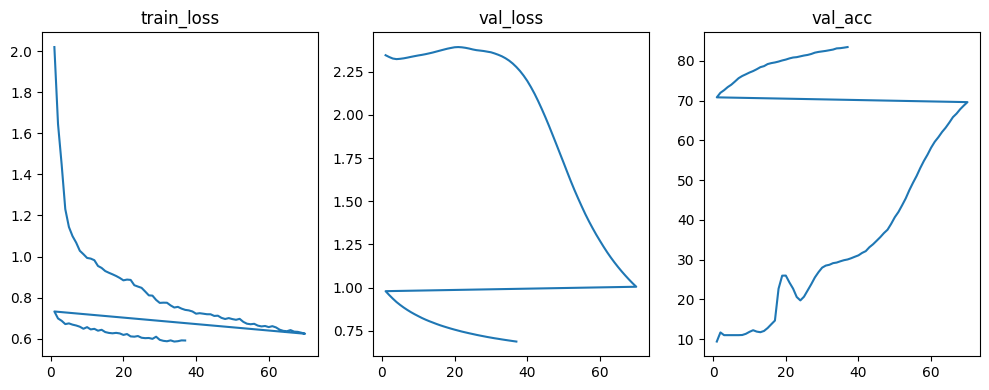

epoch=37/70  train_loss=0.5910  val_loss=0.6874  val_acc=83.44%


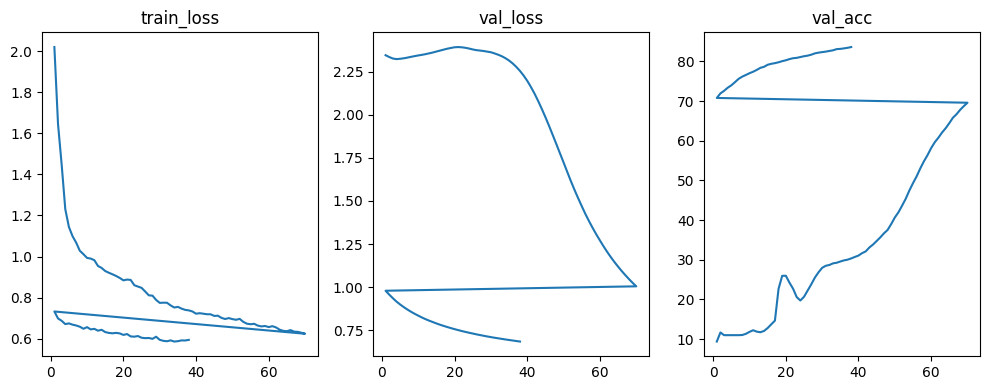

epoch=38/70  train_loss=0.5941  val_loss=0.6844  val_acc=83.63%


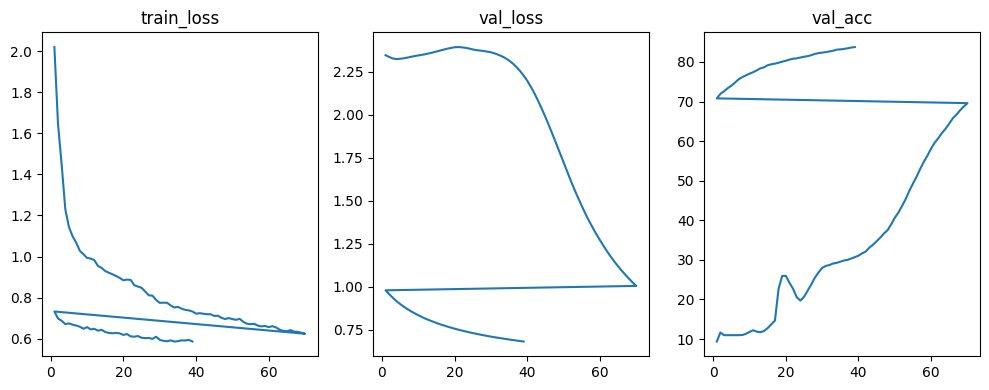

epoch=39/70  train_loss=0.5862  val_loss=0.6814  val_acc=83.76%


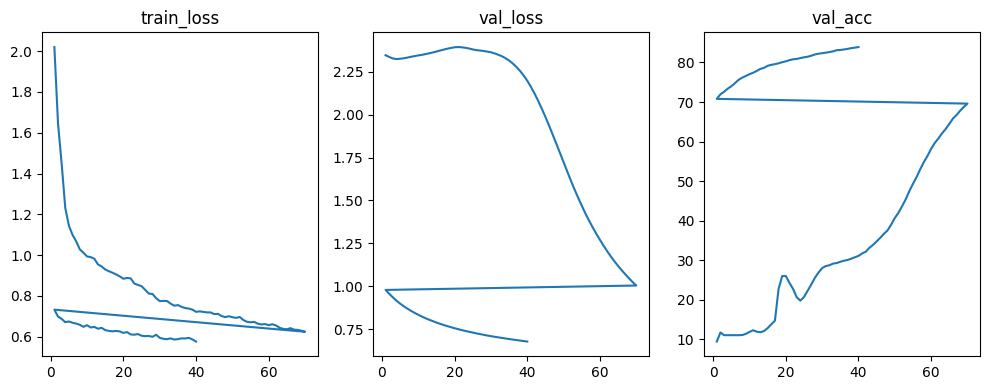

epoch=40/70  train_loss=0.5759  val_loss=0.6787  val_acc=83.91%


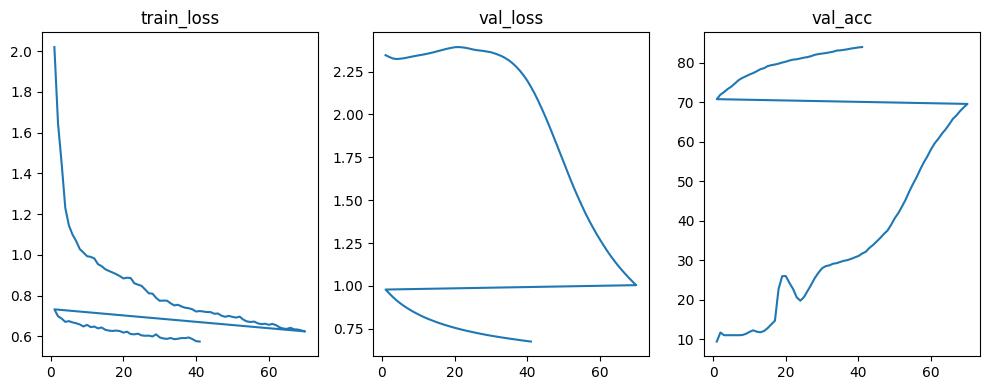

epoch=41/70  train_loss=0.5741  val_loss=0.6760  val_acc=84.00%


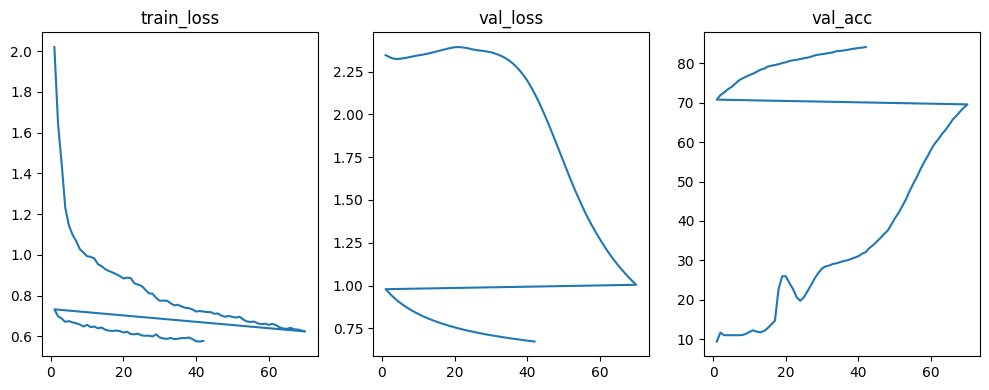

epoch=42/70  train_loss=0.5777  val_loss=0.6733  val_acc=84.15%


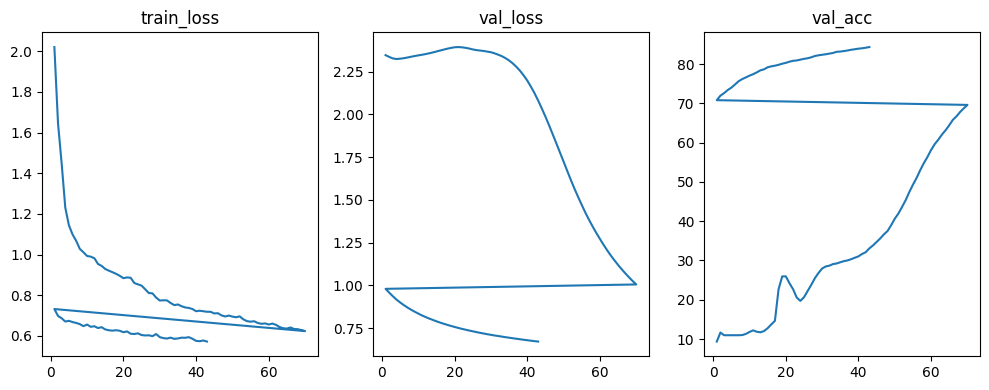

epoch=43/70  train_loss=0.5725  val_loss=0.6709  val_acc=84.31%


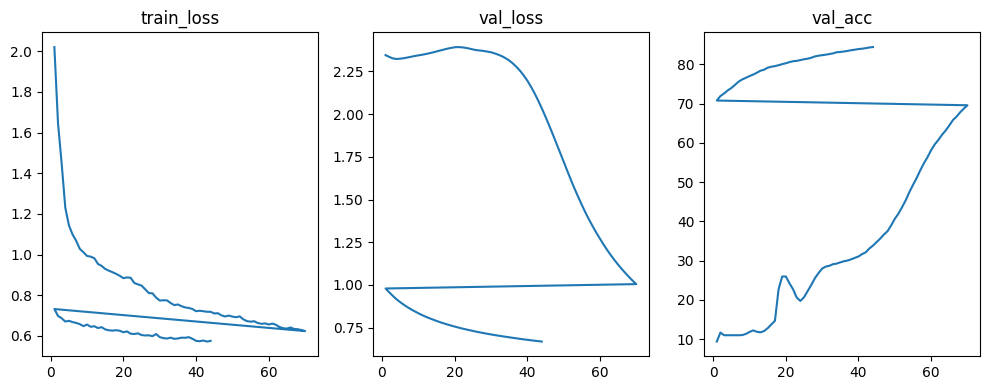

epoch=44/70  train_loss=0.5758  val_loss=0.6685  val_acc=84.43%


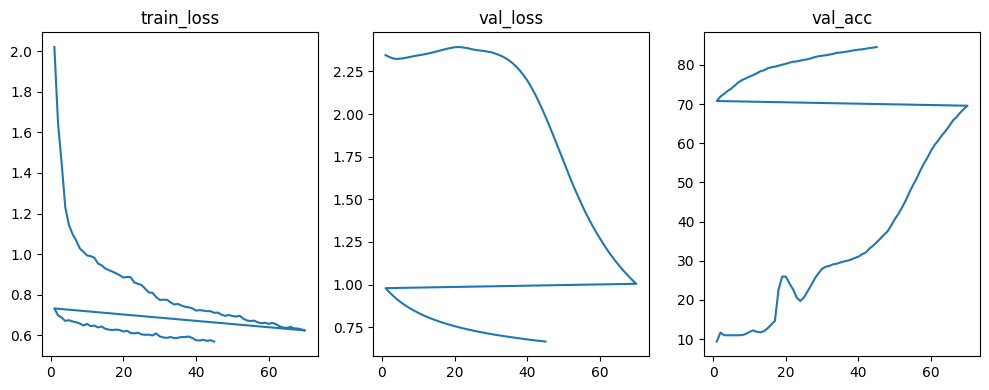

epoch=45/70  train_loss=0.5691  val_loss=0.6661  val_acc=84.57%


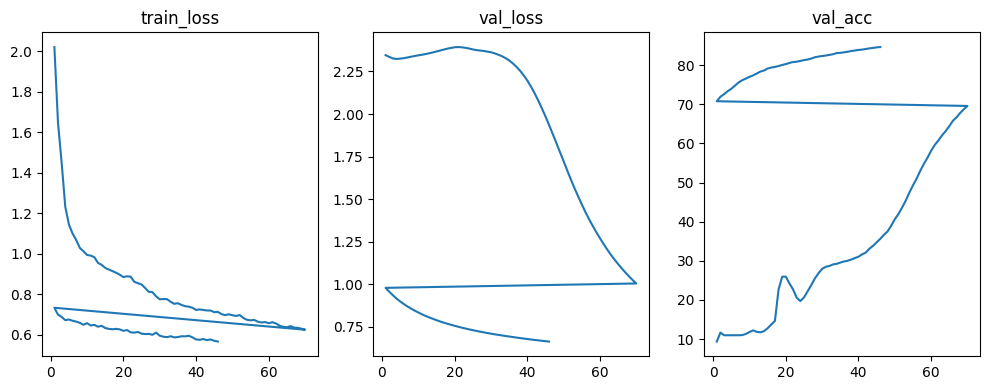

epoch=46/70  train_loss=0.5654  val_loss=0.6638  val_acc=84.65%


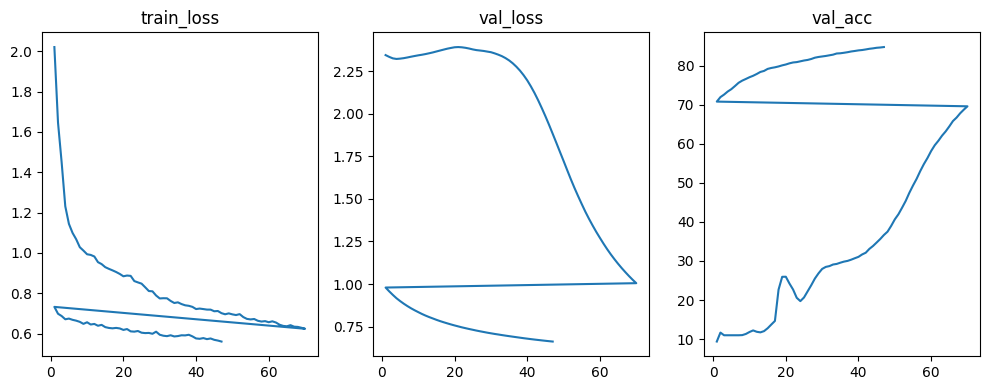

epoch=47/70  train_loss=0.5605  val_loss=0.6617  val_acc=84.76%


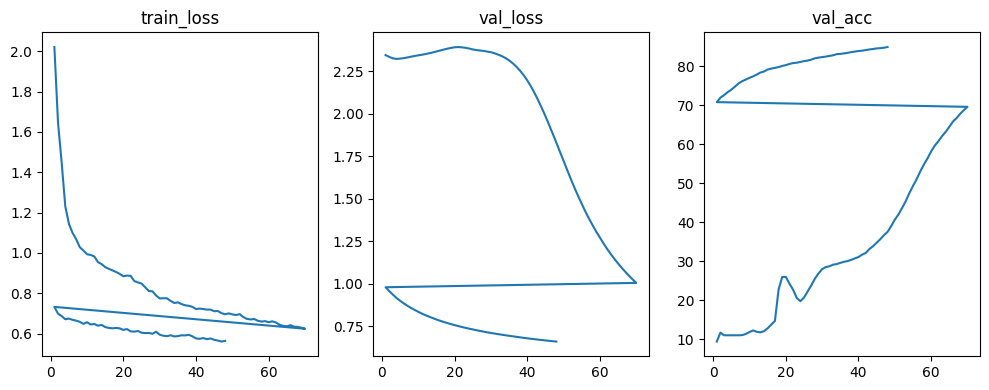

epoch=48/70  train_loss=0.5638  val_loss=0.6595  val_acc=84.93%


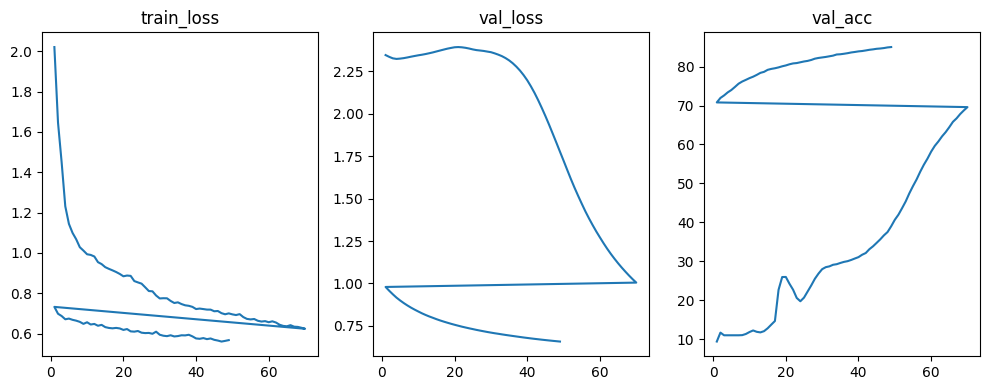

epoch=49/70  train_loss=0.5676  val_loss=0.6574  val_acc=85.02%


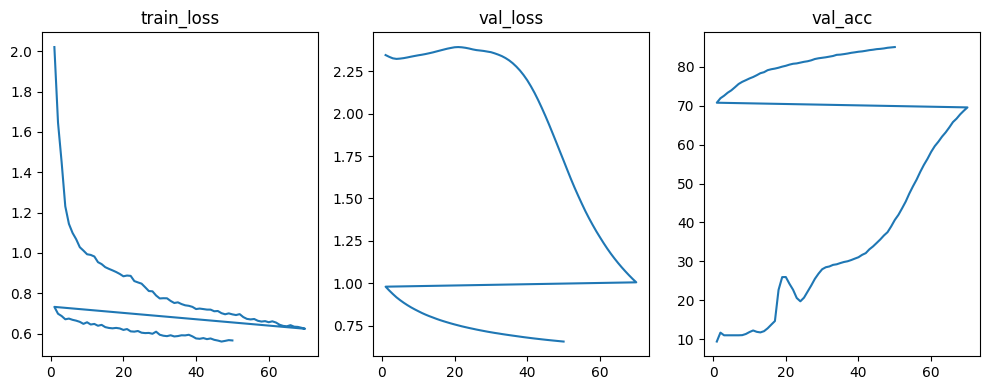

epoch=50/70  train_loss=0.5660  val_loss=0.6554  val_acc=85.11%


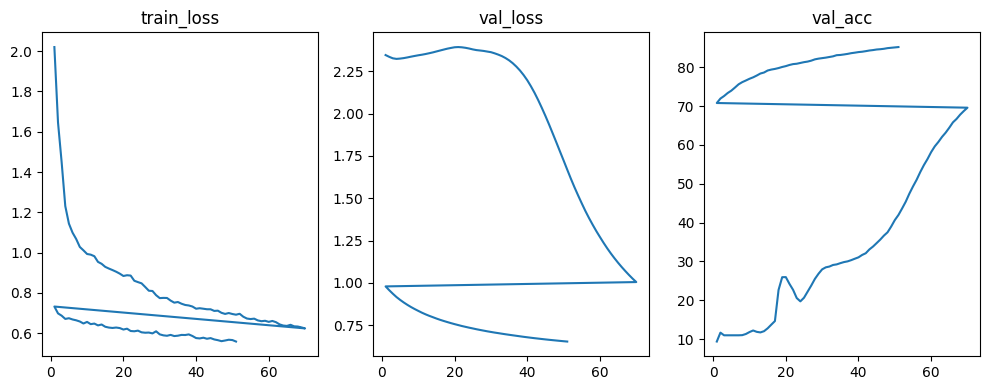

epoch=51/70  train_loss=0.5586  val_loss=0.6534  val_acc=85.20%


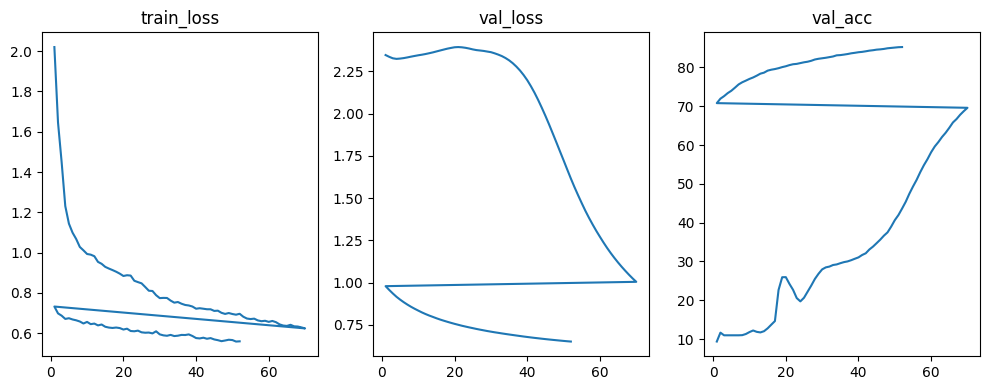

epoch=52/70  train_loss=0.5597  val_loss=0.6516  val_acc=85.24%


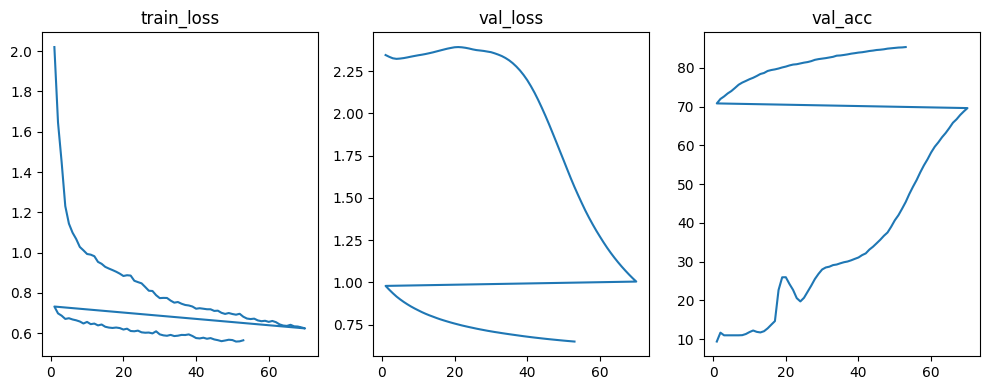

epoch=53/70  train_loss=0.5649  val_loss=0.6498  val_acc=85.33%


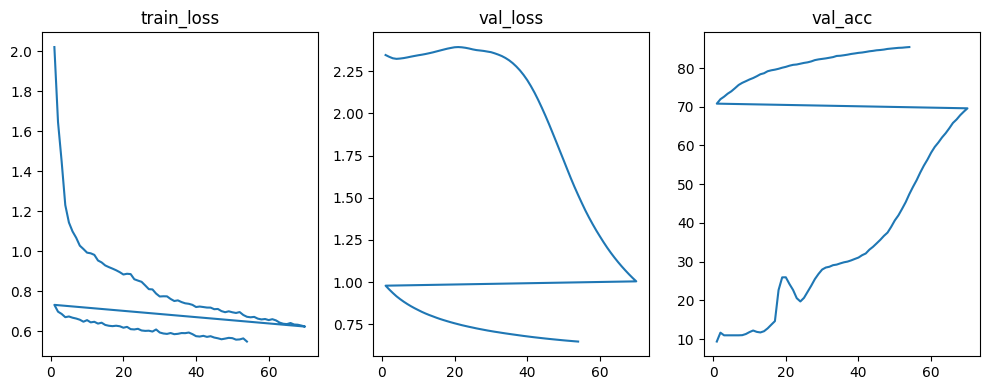

epoch=54/70  train_loss=0.5491  val_loss=0.6482  val_acc=85.41%


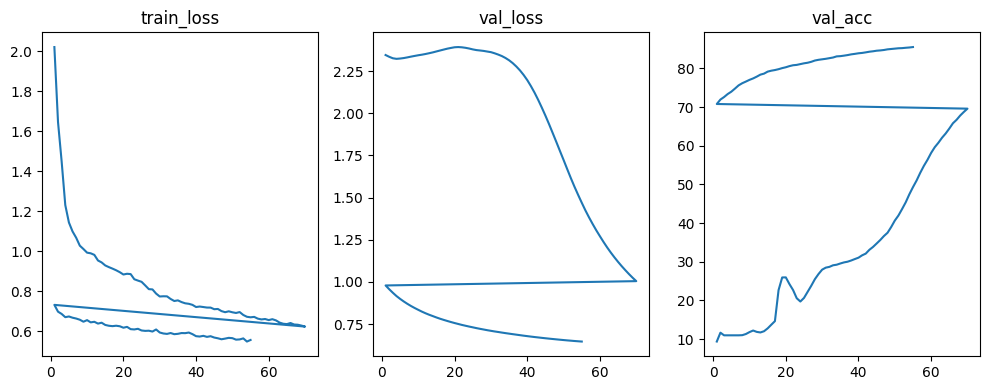

epoch=55/70  train_loss=0.5570  val_loss=0.6465  val_acc=85.52%


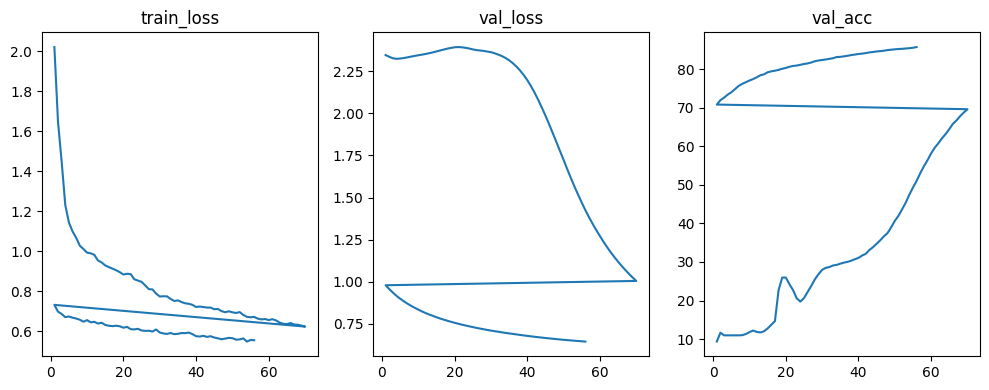

epoch=56/70  train_loss=0.5557  val_loss=0.6450  val_acc=85.70%


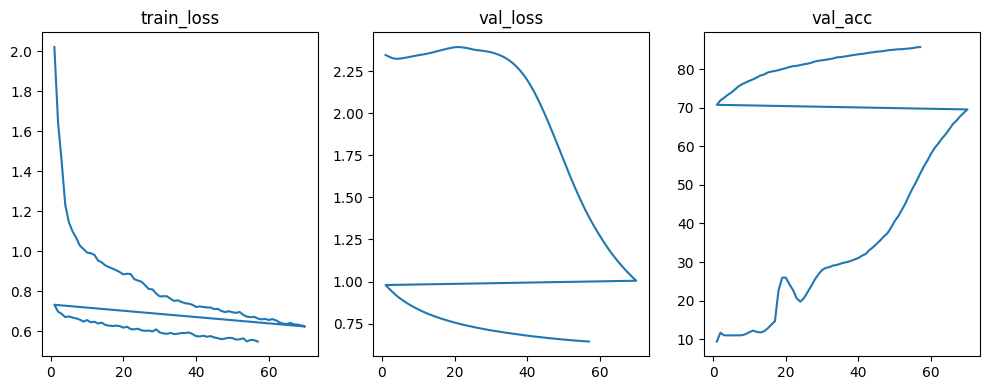

epoch=57/70  train_loss=0.5486  val_loss=0.6435  val_acc=85.78%


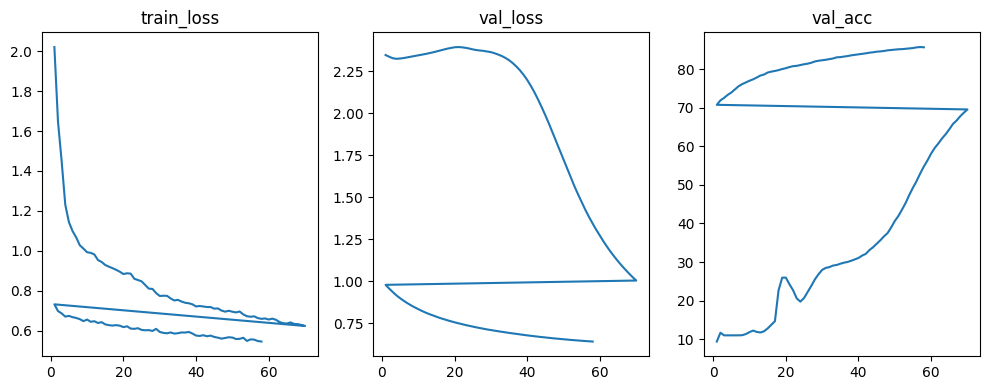

epoch=58/70  train_loss=0.5460  val_loss=0.6420  val_acc=85.72%


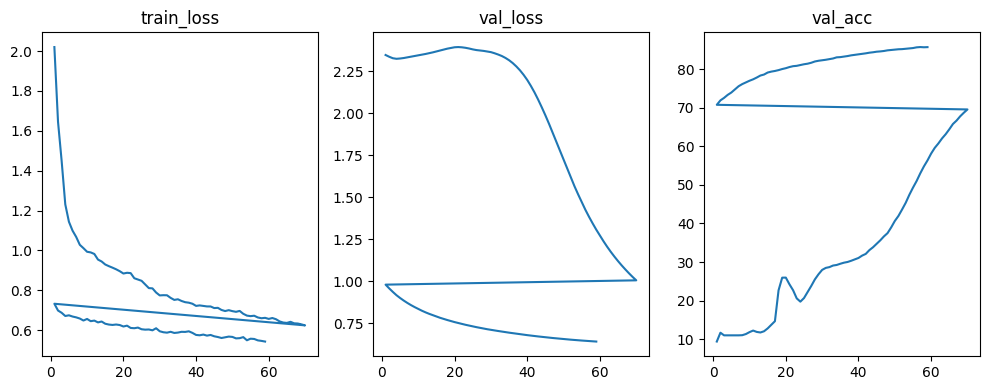

epoch=59/70  train_loss=0.5427  val_loss=0.6405  val_acc=85.76%


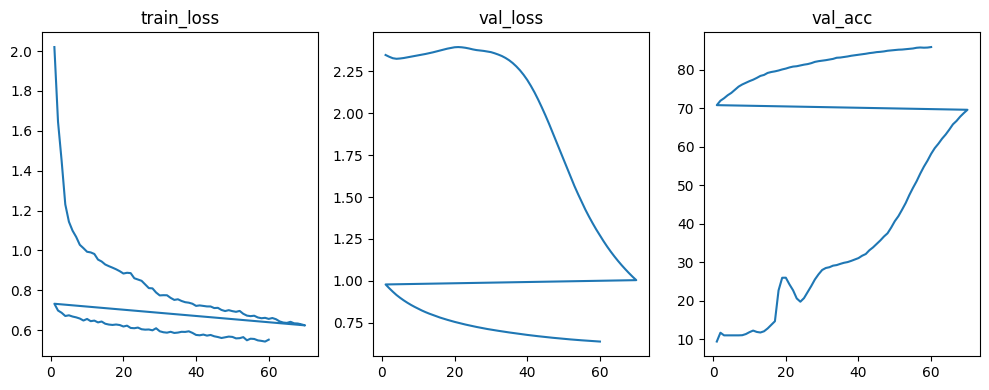

epoch=60/70  train_loss=0.5521  val_loss=0.6391  val_acc=85.89%


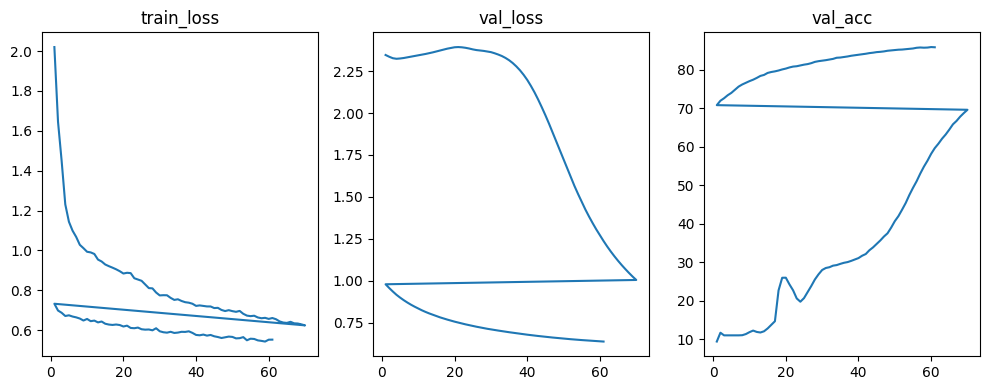

epoch=61/70  train_loss=0.5523  val_loss=0.6377  val_acc=85.83%


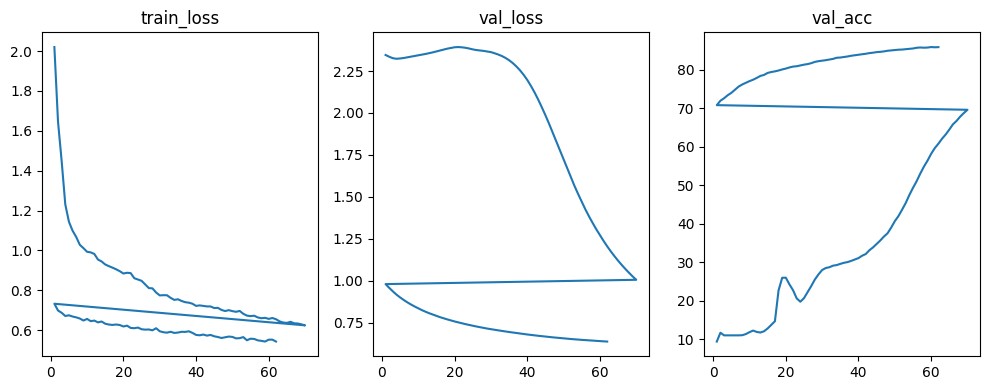

epoch=62/70  train_loss=0.5426  val_loss=0.6365  val_acc=85.87%


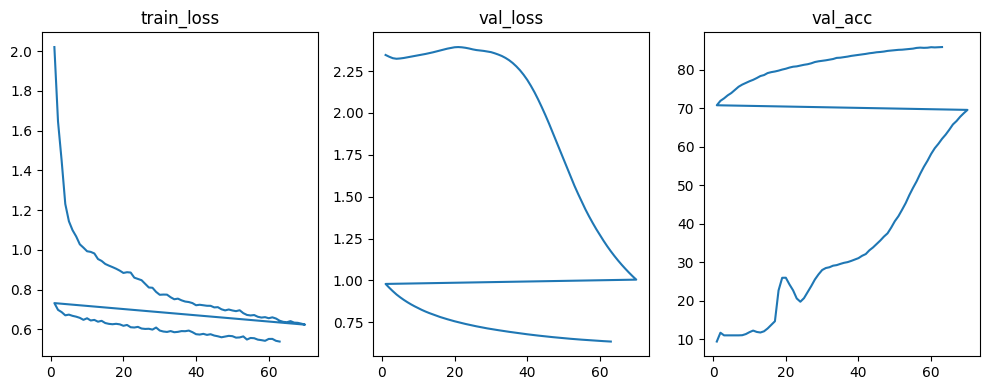

epoch=63/70  train_loss=0.5389  val_loss=0.6353  val_acc=85.93%


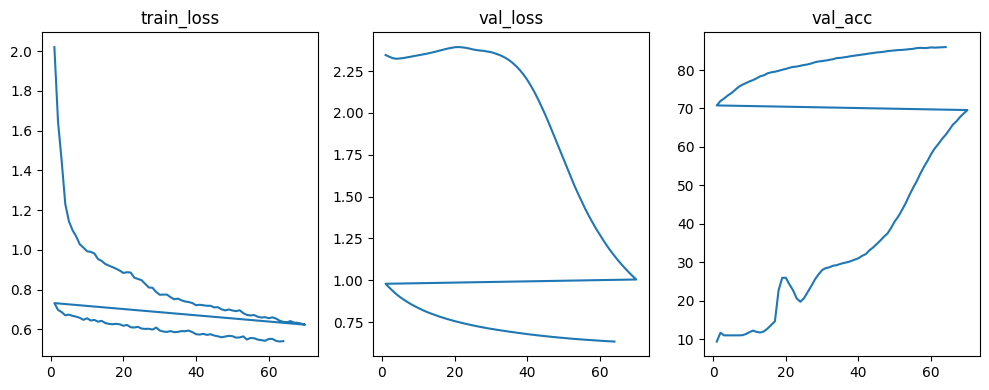

epoch=64/70  train_loss=0.5414  val_loss=0.6342  val_acc=85.98%


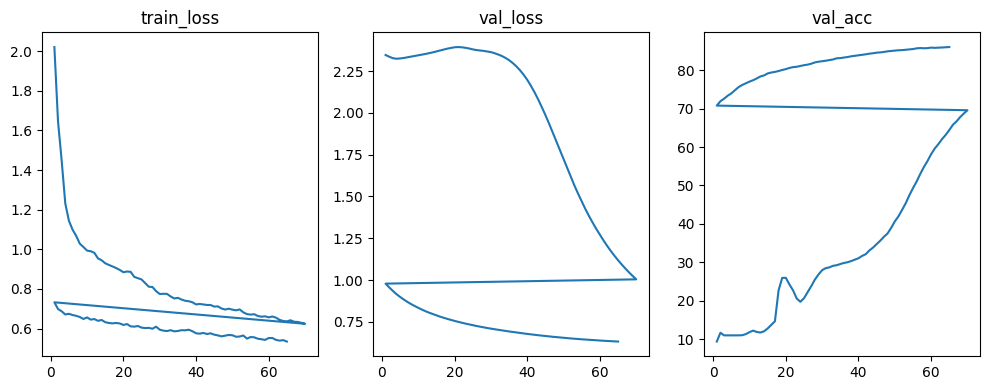

epoch=65/70  train_loss=0.5343  val_loss=0.6331  val_acc=86.04%


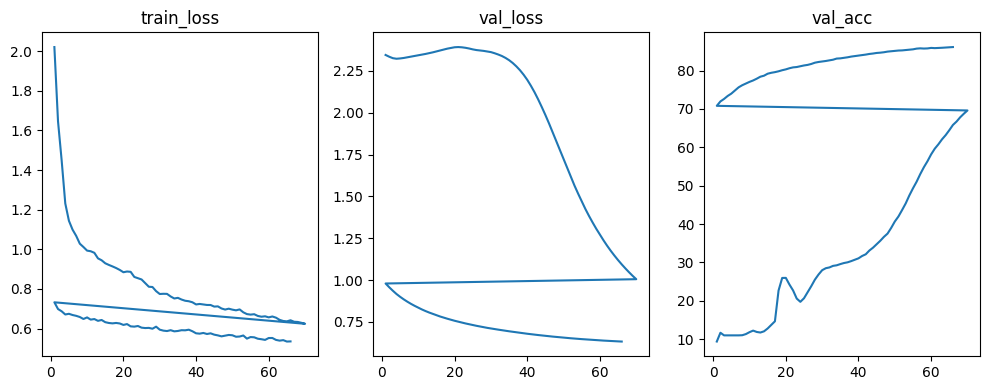

epoch=66/70  train_loss=0.5350  val_loss=0.6320  val_acc=86.11%


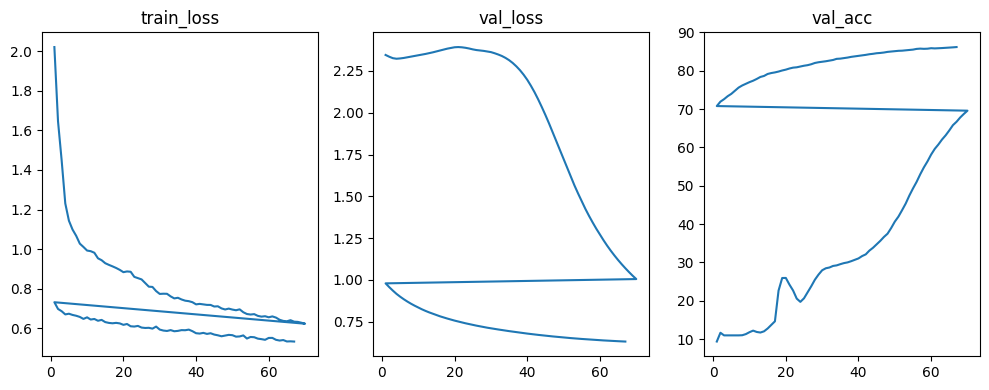

epoch=67/70  train_loss=0.5338  val_loss=0.6310  val_acc=86.19%


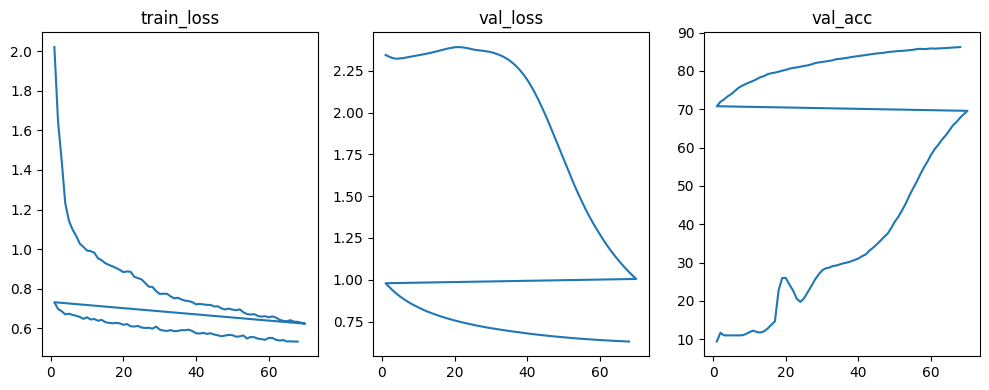

epoch=68/70  train_loss=0.5339  val_loss=0.6301  val_acc=86.24%


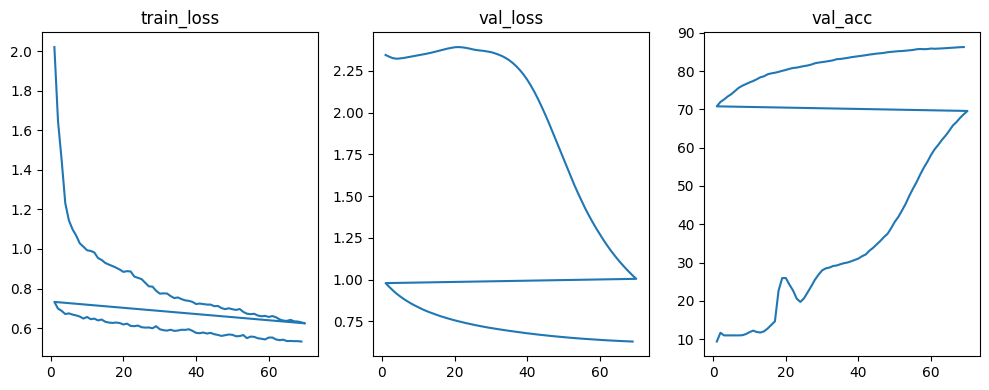

epoch=69/70  train_loss=0.5319  val_loss=0.6292  val_acc=86.28%


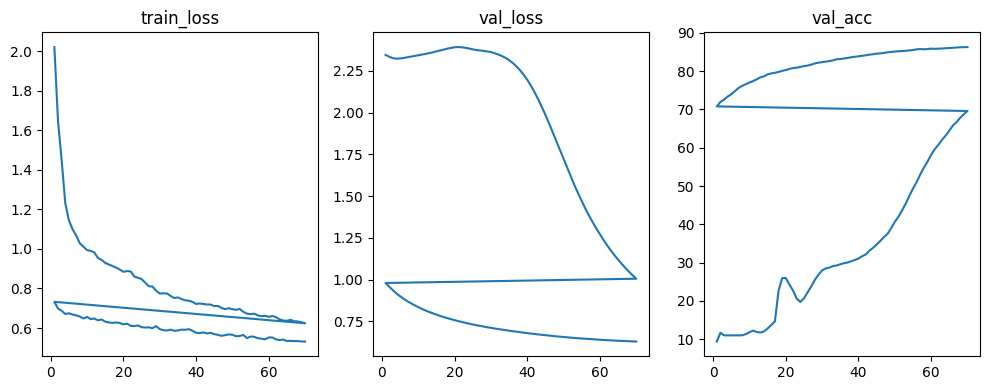

epoch=70/70  train_loss=0.5315  val_loss=0.6283  val_acc=86.30%
best_model: C:\Users\Stephen\Code\University\saved_model_eurosat\best_improved_model_eurosat_v4.pkl best_val_acc: 86.29629629629629


C:\Users\Stephen\AppData\Local\Temp\ipykernel_11232\3473562820.py:59: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(BEST_MODEL_PATH, map_loc

Final Test Accuracy: 86.30%
Precision: 0.8549
Recall: 0.8574
F1-Score: 0.8554


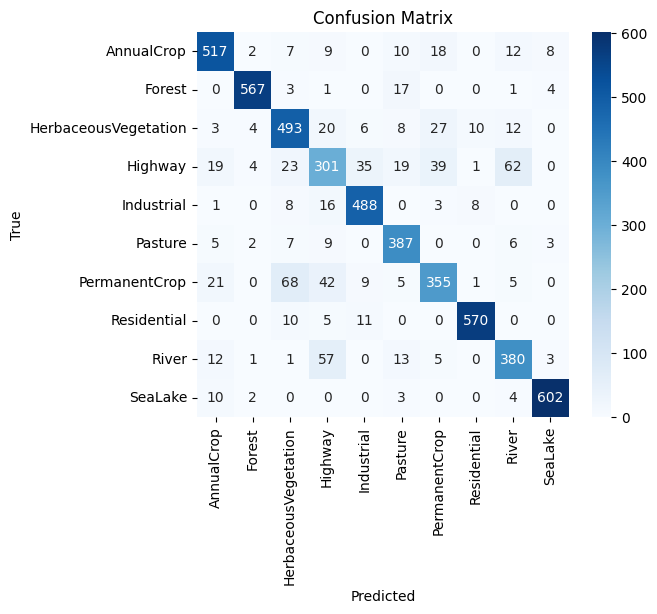

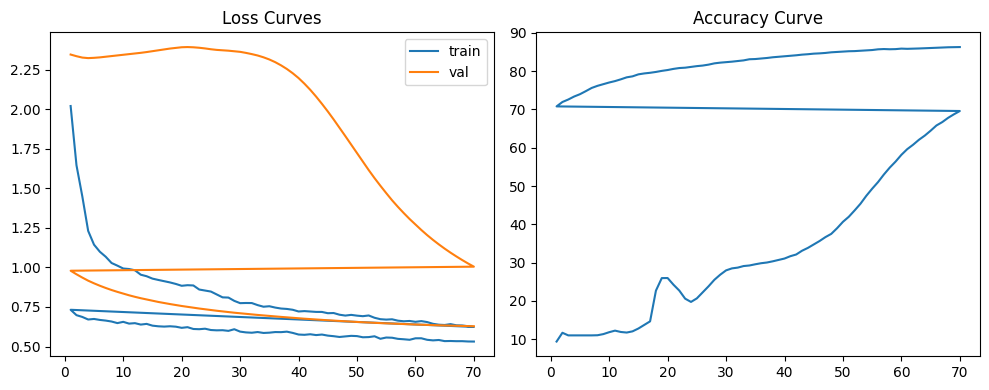

In [5]:
for epoch in range(1, EPOCHS+1):
    model.train()
    train_loss_sum = 0.0; n_train = 0
    for xb,yb in train_loader:
        xb,yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        optimizer.zero_grad(set_to_none=True)
        out = model(xb)
        loss = criterion(out,yb)
        loss.backward()
        optimizer.step()
        ema.update(model)
        train_loss_sum += loss.item()*xb.size(0)
        n_train += xb.size(0)

    model.eval()
    ema.apply_to(model)
    val_loss_sum = 0.0; correct = 0; n_val = 0
    with torch.no_grad():
        for xb,yb in val_loader:
            xb,yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
            logits = model(xb)
            if TTA_HFLIP:
                xb_h = torch.flip(xb, dims=[3])
                logits = logits + model(xb_h)
            if TTA_VFLIP:
                xb_v = torch.flip(xb, dims=[2])
                logits = logits + model(xb_v)
            logits = logits / (1 + int(TTA_HFLIP) + int(TTA_VFLIP))
            loss = criterion(logits,yb)
            val_loss_sum += loss.item()*xb.size(0)
            pred = logits.argmax(dim=1)
            correct += (pred==yb).sum().item()
            n_val += xb.size(0)
    val_acc = 100.0 * correct / max(1,n_val)
    ema.restore(model)

    train_loss = train_loss_sum / max(1,n_train)
    val_loss   = val_loss_sum   / max(1,n_val)
    cur_lr     = optimizer.param_groups[0]['lr']

    history["epoch"].append(epoch); history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss); history["val_acc"].append(val_acc); history["lr"].append(cur_lr)

    if val_acc > best_acc:
        best_acc = val_acc
        ema.apply_to(model)
        torch.save(model.state_dict(), BEST_MODEL_PATH)
        ema.restore(model)

    plt.figure(figsize=(10,4))
    plt.subplot(1,3,1); plt.plot(history["epoch"], history["train_loss"]); plt.title("train_loss")
    plt.subplot(1,3,2); plt.plot(history["epoch"], history["val_loss"]);  plt.title("val_loss")
    plt.subplot(1,3,3); plt.plot(history["epoch"], history["val_acc"]);   plt.title("val_acc")
    plt.tight_layout(); plt.show()
    print(f"epoch={epoch}/{EPOCHS}  train_loss={train_loss:.4f}  val_loss={val_loss:.4f}  val_acc={val_acc:.2f}%")

print("best_model:", BEST_MODEL_PATH, "best_val_acc:", best_acc)

model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=device))
model.eval()
all_preds, all_labels = [], []
val_loss_sum = 0.0; n_val = 0
with torch.no_grad():
    for xb,yb in val_loader:
        xb,yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
        logits = model(xb)
        if TTA_HFLIP:
            xb_h = torch.flip(xb, dims=[3]); logits = logits + model(xb_h)
        if TTA_VFLIP:
            xb_v = torch.flip(xb, dims=[2]); logits = logits + model(xb_v)
        logits = logits / (1 + int(TTA_HFLIP) + int(TTA_VFLIP))
        val_loss_sum += criterion(logits,yb).item()*xb.size(0)
        pred = logits.argmax(1)
        all_preds.extend(pred.detach().cpu().numpy().tolist())
        all_labels.extend(yb.detach().cpu().numpy().tolist())
        n_val += xb.size(0)

final_acc = 100.0 * (np.sum(np.array(all_preds)==np.array(all_labels)) / max(1,n_val))
prec = precision_score(all_labels, all_preds, average='macro', zero_division=0)
rec  = recall_score(all_labels, all_preds, average='macro', zero_division=0)
f1   = f1_score(all_labels, all_preds, average='macro', zero_division=0)
cm   = confusion_matrix(all_labels, all_preds)

print(f"Final Test Accuracy: {final_acc:.2f}%")
print(f"Precision: {prec:.4f}")
print(f"Recall: {rec:.4f}")
print(f"F1-Score: {f1:.4f}")

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=full_dataset.classes, yticklabels=full_dataset.classes)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Confusion Matrix"); plt.show()

plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.plot(history["epoch"], history["train_loss"], label="train"); plt.plot(history["epoch"], history["val_loss"], label="val"); plt.legend(); plt.title("Loss Curves")
plt.subplot(1,2,2); plt.plot(history["epoch"], history["val_acc"]); plt.title("Accuracy Curve")
plt.tight_layout(); plt.show()


#### Live Run

In [5]:
import os, random, numpy as np, torch, cv2, math
from PIL import Image
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split, Dataset
from torch import nn
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns

SEED=13
np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
os.environ["OMP_NUM_THREADS"]="1"; os.environ["MKL_NUM_THREADS"]="1"; cv2.setNumThreads(0); torch.set_num_threads(1)
device=torch.device("cuda" if torch.cuda.is_available() else "cpu")

DATA_ROOT="../Dataset/EuroSAT"
SAVE_DIR="./saved_model_eurosat"
WEIGHT_NAME="best_improved_model_eurosat_v4.pkl"
IMAGE_SIZE=64
BATCH_SIZE=500
N_SHOW=6
TTA_HFLIP=True
TTA_VFLIP=False

class LaplacianSharpenCLAHE:
    def __init__(self, alpha=0.25, clip_limit=2.0, tile_grid_size=(8,8)):
        self.alpha=float(alpha); self.clip_limit=float(clip_limit); self.tile_grid_size=tile_grid_size
    def __call__(self, img_pil: Image.Image) -> Image.Image:
        img = np.array(img_pil)
        lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        l,a,b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
        l_eq = clahe.apply(l)
        lab_eq = cv2.merge([l_eq,a,b])
        img_eq = cv2.cvtColor(lab_eq, cv2.COLOR_LAB2RGB)
        lap = cv2.Laplacian(img_eq, ddepth=cv2.CV_16S, ksize=3)
        lap = cv2.convertScaleAbs(lap)
        sharp = cv2.addWeighted(img_eq, 1.0, lap, self.alpha, 0)
        return Image.fromarray(sharp)

def build_train_tf(sz=64):
    return transforms.Compose([
        transforms.Resize((sz,sz)),
        LaplacianSharpenCLAHE(alpha=0.25, clip_limit=2.0, tile_grid_size=(8,8)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=10),
        transforms.RandomResizedCrop(sz, scale=(0.95,1.0), ratio=(0.95,1.05)),
        transforms.ToTensor(),
    ])

def build_val_tf(sz=64):
    return transforms.Compose([
        transforms.Resize((sz,sz)),
        LaplacianSharpenCLAHE(alpha=0.25, clip_limit=2.0, tile_grid_size=(8,8)),
        transforms.ToTensor(),
    ])

full_dataset = datasets.ImageFolder(DATA_ROOT)
TOTAL = len(full_dataset)
train_len = int(0.8*TOTAL); val_len = TOTAL-train_len
g = torch.Generator().manual_seed(SEED)
train_subset, val_subset = random_split(full_dataset, [train_len, val_len], generator=g)

train_subset.dataset.transform = build_train_tf(IMAGE_SIZE)
val_subset.dataset.transform   = build_val_tf(IMAGE_SIZE)

tmp_loader = DataLoader(train_subset, batch_size=256, shuffle=False, num_workers=0, pin_memory=True)
def compute_stats(loader):
    n=0; mean=torch.zeros(3,dtype=torch.double); M2=torch.zeros(3,dtype=torch.double)
    for x,_ in loader:
        x=x.double()
        b,c,h,w=x.shape; p=b*h*w; n+=p
        m=x.mean(dim=[0,2,3]); d=m-mean; mean+=d*(p/n)
        var=((x-m[None,:,None,None])**2).sum(dim=[0,2,3])/p
        M2+=var*p
    std=torch.sqrt(M2/max(1,n))
    return mean.float(), std.float()
train_mean, train_std = compute_stats(tmp_loader)
norm_tf = transforms.Normalize(mean=train_mean.tolist(), std=train_std.tolist())

val_tf_final = transforms.Compose([build_val_tf(IMAGE_SIZE), norm_tf])

class DWConv(nn.Module):
    def __init__(self, cin, cout, k=3, s=1, p=0):
        super().__init__()
        self.dw = nn.Conv2d(cin, cin, k, s, p, groups=cin, bias=False)
        self.pw = nn.Conv2d(cin, cout, 1, 1, 0, bias=False)
        self.act = nn.ReLU(inplace=True)
    def forward(self,x):
        x=self.dw(x); x=self.pw(x); x=self.act(x); return x

class SE(nn.Module):
    def __init__(self, c, r=8):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(nn.Linear(c, c//r), nn.ReLU(inplace=True), nn.Linear(c//r, c), nn.Sigmoid())
    def forward(self,x):
        b,c,_,_=x.shape
        w=self.pool(x).view(b,c)
        w=self.fc(w).view(b,c,1,1)
        return x*w

class LitePlusBiGRU_F2(nn.Module):
    def __init__(self, num_classes, drop_p=0.1):
        super().__init__()
        self.b1 = nn.Sequential(DWConv(3,16,k=3,s=1,p=0), nn.MaxPool2d(2))
        self.b2 = nn.Sequential(DWConv(16,32,k=3,s=1,p=0), nn.MaxPool2d(2))
        self.b3 = nn.Sequential(DWConv(32,32,k=3,s=1,p=0))
        self.se = SE(32, r=8)
        self.flat = nn.Flatten()
        self.T = 32
        self.gru = nn.GRU(input_size=144, hidden_size=48, num_layers=1, batch_first=True, bidirectional=True)
        self.norm = nn.LayerNorm(96)
        self.drop = nn.Dropout(0.1)
        self.head = nn.Sequential(nn.Linear(96,64), nn.ReLU(inplace=True), nn.Linear(64,num_classes))
    def forward(self,x):
        x=self.b1(x); x=self.b2(x); x=self.b3(x); x=self.se(x)
        x=self.flat(x)
        x=x.view(x.size(0), self.T, 4608//self.T)
        y,_=self.gru(x)
        h=y[:,-1,:]
        h=self.norm(h)
        h=self.drop(h)
        z=self.head(h)
        return z

classes = full_dataset.classes
num_classes = len(classes)
model = LitePlusBiGRU_F2(num_classes=num_classes, drop_p=0.1).to(device)
state = torch.load(os.path.join(SAVE_DIR, WEIGHT_NAME), map_location=device)
model.load_state_dict(state, strict=True)
model.eval()

C:\Users\Stephen\AppData\Local\Temp\ipykernel_23348\1282246456.py:129: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(os.path.join(SAVE_DIR, WEIGHT_NAME), 

LitePlusBiGRU_F2(
  (b1): Sequential(
    (0): DWConv(
      (dw): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1), groups=3, bias=False)
      (pw): Conv2d(3, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (act): ReLU(inplace=True)
    )
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (b2): Sequential(
    (0): DWConv(
      (dw): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), groups=16, bias=False)
      (pw): Conv2d(16, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (act): ReLU(inplace=True)
    )
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (b3): Sequential(
    (0): DWConv(
      (dw): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), groups=32, bias=False)
      (pw): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (act): ReLU(inplace=True)
    )
  )
  (se): SE(
    (pool): AdaptiveAvgPool2d(output_size=1)
    (fc): Sequential(
      (0): Linear(in_feat

Subset Accuracy: 100.00%
Precision: 1.0000
Recall: 1.0000
F1-Score: 1.0000


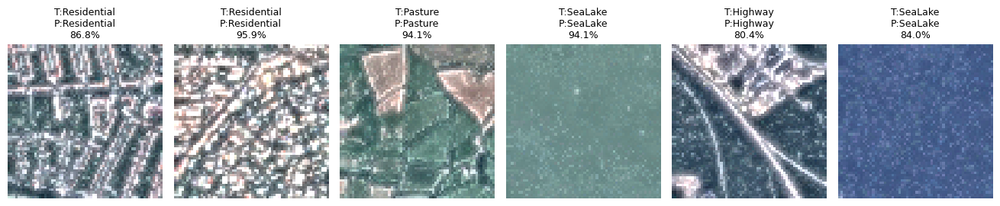

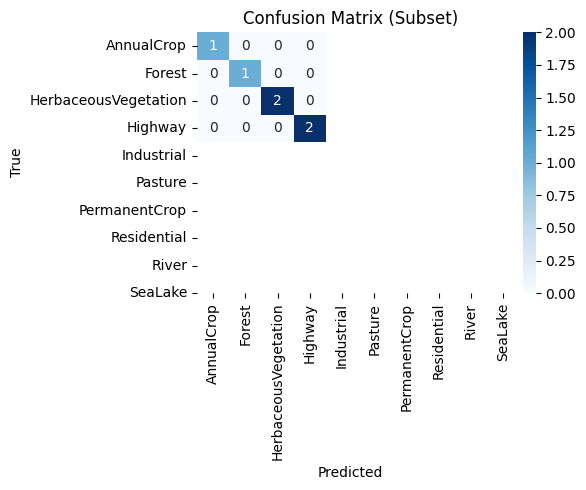

In [6]:
idx = random.sample(val_subset.indices, k=min(N_SHOW, len(val_subset)))
imgs = [(Image.open(full_dataset.samples[i][0]).convert("RGB"), full_dataset.samples[i][1]) for i in idx]
xb = torch.stack([val_tf_final(img) for img,_ in imgs]).to(device)
yb = torch.tensor([y for _,y in imgs], device=device)

with torch.no_grad():
    logits = model(xb)
    if TTA_HFLIP:
        xb_h = torch.flip(xb, dims=[3]); logits = logits + model(xb_h)
    if TTA_VFLIP:
        xb_v = torch.flip(xb, dims=[2]); logits = logits + model(xb_v)
    logits = logits / (1 + int(TTA_HFLIP) + int(TTA_VFLIP))
    probs = torch.softmax(logits, dim=1)
    pred = probs.argmax(1)

acc = 100.0*(pred==yb).float().mean().item()
prec = precision_score(yb.cpu().numpy(), pred.cpu().numpy(), average='macro', zero_division=0)
rec  = recall_score(yb.cpu().numpy(), pred.cpu().numpy(), average='macro', zero_division=0)
f1   = f1_score(yb.cpu().numpy(), pred.cpu().numpy(), average='macro', zero_division=0)
cm   = confusion_matrix(yb.cpu().numpy(), pred.cpu().numpy())

print(f"Subset Accuracy: {acc:.2f}%")
print(f"Precision: {prec:.4f}")
print(f"Recall: {rec:.4f}")
print(f"F1-Score: {f1:.4f}")

plt.figure(figsize=(N_SHOW*2.2, 3))
for i,(img,y) in enumerate(imgs):
    x = xb[i].detach().cpu()
    x = x*train_std.view(3,1,1) + train_mean.view(3,1,1)
    x = x.clamp(0,1).permute(1,2,0).numpy()
    p = int(pred[i].item()); conf = float(probs[i,p].item())
    ax = plt.subplot(1, N_SHOW, i+1); ax.imshow(x); ax.set_title(f"T:{classes[y]}\nP:{classes[p]}\n{conf*100:.1f}%", fontsize=9); ax.axis("off")
plt.tight_layout(); plt.show()

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Confusion Matrix (Subset)"); plt.tight_layout(); plt.show()

In [7]:
import torch
from torchinfo import summary


summary(model, input_size=(1, 3, 64, 64))

Layer (type:depth-idx)                   Output Shape              Param #
LitePlusBiGRU_F2                         [1, 10]                   --
├─Sequential: 1-1                        [1, 16, 31, 31]           --
│    └─DWConv: 2-1                       [1, 16, 62, 62]           --
│    │    └─Conv2d: 3-1                  [1, 3, 62, 62]            27
│    │    └─Conv2d: 3-2                  [1, 16, 62, 62]           48
│    │    └─ReLU: 3-3                    [1, 16, 62, 62]           --
│    └─MaxPool2d: 2-2                    [1, 16, 31, 31]           --
├─Sequential: 1-2                        [1, 32, 14, 14]           --
│    └─DWConv: 2-3                       [1, 32, 29, 29]           --
│    │    └─Conv2d: 3-4                  [1, 16, 29, 29]           144
│    │    └─Conv2d: 3-5                  [1, 32, 29, 29]           512
│    │    └─ReLU: 3-6                    [1, 32, 29, 29]           --
│    └─MaxPool2d: 2-4                    [1, 32, 14, 14]           --
├─Sequential: